# Plot velocities for each experiment

using GFDL exe from Dec 24

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr
import netCDF4 as nc
import cmocean as cm

from xgcm import Grid

In [2]:
basee = '/Users/claireyung/mom6/MOM6-examples/ocean_only/ISOMIP/seamount-icemount-PGtest-dec24/'
def open_files(label):
    base = basee 
    prog = xr.open_dataset(base + label+'/prog.nc')
    return prog
def open_mom(label):
    base = basee 
    mom = xr.open_dataset(base + label+'/mommean.nc')
    return mom
def open_IC(label):
    base = basee 
    IC = xr.open_dataset(base + label+'/MOM_IC.nc')
    return IC
def plot(ax,yy0,tt,variable,varname,vmin1,vmax1,cmap,ymax):
    prog = open_files(label)
    ocean_static = xr.open_dataset(label +'/ocean_geometry.nc')
    grid = Grid(prog,coords={"x":{"center":"xh","outer":"xq"},
                             "y":{"center":"yh","outer":"yq"},
                             "z":{"center":"zl","outer":"zi"}},periodic=False)
    file_name = label
    #IC = open_IC(label)
    depth = grid.interp(prog.e,"x")
    lon = ocean_static.geolonb
    dataplot = variable

    xx = lon
    if (varname == "uo") or (varname == "PFu") or (varname == "visc_rem_u"): 
        dataplot = grid.interp(dataplot,"x")
    levels = np.linspace(vmin1, vmax1, 51)
    yy = depth[:,:,yy0,:]
    z_levels = yy.shape[1]
    yi = np.linspace(0,5000,z_levels) 
    xi, yyi = np.meshgrid(xx[yy0,:], yi) 
    #print(xi.shape)
    #print(yy[tt,...].shape)
    #print(dataplot[tt,:,yy0,:].shape)
    cax = ax.pcolormesh(xi,yy[tt,...],dataplot[tt,:,yy0,:],vmin = vmin1, vmax = vmax1, cmap = cmap)
    if (varname == "uo"):
        cbar = plt.colorbar(cax, ax = ax, label = " ")
        cbar.formatter.set_powerlimits((0, 0))
        cbar.formatter.set_useMathText(True)
        cbar.ax.yaxis.set_offset_position('right')
        cbar.update_ticks()

    else:
        plt.colorbar(cax, ax = ax, label = varname)
    #plt.colorbar(cax, ax = ax, label = 'u (m/s)')
    
    ## plot interface heights
    i_heights = prog.e # this is 'Interface Height Relative to Mean Sea Level'
    # do for one time
    i_heights = i_heights.isel(Time = tt)
    # take zonal mean
    i_heights = i_heights.isel(yh = yy0)#.mean('xh')

    # plot a line of layer depths, layer by layer
    nz = len(i_heights.zi)
    xh = prog.xh

    for i in range(nz):
        ax.plot(xh,i_heights[i], color = 'k', linewidth = 0.5)
    
    ax.set_ylim(ymin=-ymax,ymax=0)
    ax.set_ylabel('Depth (m)')
    ax.set_xlabel('x (km)')
    ax.set_title(varname+' , ' +label)
    


In [34]:
def plot_u(ax,yy0,tt,variable,varname,vmin1,vmax1,cmap,ymax,ymin = 20): #boudnaries are t cell grid
    prog = open_files(label)
    ocean_static = xr.open_dataset(label +'/ocean_geometry.nc')
    grid = Grid(prog,coords={"x":{"center":"xh","outer":"xq"},
                             "y":{"center":"yh","outer":"yq"},
                             "z":{"center":"zl","outer":"zi"}},periodic=False)
    file_name = label
    #IC = open_IC(label)
    depth = prog.e#grid.interp(prog.e,"x")
    lon = prog.e*0 + prog.xh
    dataplot = variable[:,:,:,1:-1]

    #xx = lon
    #if (varname == "uo") or (varname == "PFu") or (varname == "visc_rem_u"): 
    #    dataplot = grid.interp(dataplot,"x")
    levels = np.linspace(vmin1, vmax1, 51)
    #yy = depth[:,:,yy0,:]
    #z_levels = yy.shape[1]
    #yi = np.linspace(0,5000,z_levels) 
    #xi, yyi = np.meshgrid(xx[yy0,:], y) 
    #print(xi.shape)
    #print(yy[tt,...].shape)
    #print(dataplot[tt,:,yy0,:].shape)
    #cax = ax.pcolormesh(xi,yy[tt,...],dataplot[tt,:,yy0,:],vmin = vmin1, vmax = vmax1, cmap = cmap)
#     print(lon.shape)
#     print(depth.shape)
#     print(dataplot.shape)
    cax = ax.pcolormesh(lon[tt,:,yy0,...],depth[tt,:,yy0,...],dataplot[tt,:,yy0,:],vmin = vmin1, vmax = vmax1, cmap = cmap)
    if (varname == "uo"):
        cbar = plt.colorbar(cax, ax = ax, label = " ")
        cbar.formatter.set_powerlimits((0, 0))
        cbar.formatter.set_useMathText(True)
        cbar.ax.yaxis.set_offset_position('right')
        cbar.update_ticks()

    else:
        plt.colorbar(cax, ax = ax, label = varname)
    #plt.colorbar(cax, ax = ax, label = 'u (m/s)')
    
    ## plot interface heights
    i_heights = prog.e # this is 'Interface Height Relative to Mean Sea Level'
    # do for one time
    i_heights = i_heights.isel(Time = tt)
    # take zonal mean
    i_heights = i_heights.isel(yh = yy0)#.mean('xh')

    # plot a line of layer depths, layer by layer
    nz = len(i_heights.zi)
    xh = prog.xh

    for i in range(nz):
        ax.plot(xh,i_heights[i], color = 'k', linewidth = 0.5)
        
    try:
        mom = open_mom(label)
        reset_ht = mom.reset_u.isel(Time = 0).isel(yh = yy0)
        height_reset = np.zeros(len(reset_ht.xq))
        for x in np.arange(1,len(reset_ht.xq)-1):
            # find depth
            if (np.max(reset_ht.isel(xq = x).values)==0):
                idx = -1 # using surface
            elif (np.max(reset_ht.isel(xq = x).values)==2):
                idx = -1 # using surface
            else:
                idx = np.argmax(reset_ht.isel(xq = x).values)
                print(idx)
            height_reset[x] = grid.interp(prog.e,"x").isel(Time = 0).isel(yh = yy0).isel(xq = x)[idx+1]

        ax.plot(prog.xq[1:-1], height_reset[1:-1], alpha = 0.5, color = 'yellow', linewidth = 2, zorder = 10)
    except AttributeError:
        print('No magic interface output')

    
    ax.set_ylim(ymin=-ymax,ymax=ymin)
    ax.set_ylabel('Depth (m)')
    ax.set_xlabel('x (km)')
    ax.set_title(varname+' , ' +label)
    


/Users/claireyung/opt/anaconda3/lib/python3.9/site-packages/xarray/coding/times.py:699: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)


7
4
2
2
1
1
1
1
1
2


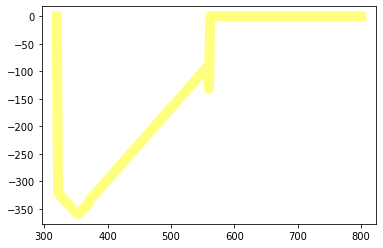

In [4]:
label = 'iceshelf3-sigma'
prog = open_files(label)
fig,ax = plt.subplots()
#try:
mom = open_mom(label)
yy0 = 0
grid = Grid(prog,coords={"x":{"center":"xh","outer":"xq"},
                         "y":{"center":"yh","outer":"yq"},
                         "z":{"center":"zl","outer":"zi"}},periodic=False)

depth = grid.interp(prog.e,"x")
reset_ht = mom.reset_u.isel(Time = -1).isel(yh = yy0)

height_reset = np.zeros(len(reset_ht.xq))
for x in np.arange(1,len(reset_ht.xq)-1):
    # find depth
    if (np.max(reset_ht.isel(xq = x).values)==0):
        idx = -1
    elif (np.max(reset_ht.isel(xq = x).values)==2):
        idx = -1 # using surface
    else:
        idx = np.argmax(reset_ht.isel(xq = x).values)
        print(idx)
    height_reset[x] = depth.isel(Time = 0).isel(yh = yy0).isel(xq = x)[idx+1]

ax.plot(prog.xq, height_reset, alpha = 0.5, color = 'yellow', linewidth = 10, zorder = 10)
#except:
#    print('No magic interface output')


In [5]:
def plot_t(ax,yy0,tt,variable,varname,vmin1,vmax1,cmap,ymax): #boundaries are u cell grid https://gist.github.com/adcroft/dde8d3fafd77d0caaa5613e64f1d7eff
    prog = open_files(label)
    ocean_static = xr.open_dataset(label +'/ocean_geometry.nc')
    grid = Grid(prog,coords={"x":{"center":"xh","outer":"xq"},
                             "y":{"center":"yh","outer":"yq"},
                             "z":{"center":"zl","outer":"zi"}},periodic=False)
    file_name = label
    #IC = open_IC(label)
    depth = grid.interp(prog.e,"x", boundary="extend")
    lon = depth*0 + depth.xq
    dataplot = variable

    #xx = lon
    #if (varname == "uo") or (varname == "PFu") or (varname == "visc_rem_u"): 
    #    dataplot = grid.interp(dataplot,"x")
    levels = np.linspace(vmin1, vmax1, 51)
    #yy = depth[:,:,yy0,:]
    #z_levels = yy.shape[1]
    #yi = np.linspace(0,5000,z_levels) 
    #xi, yyi = np.meshgrid(xx[yy0,:], y) 
    #print(xi.shape)
    #print(yy[tt,...].shape)
    #print(dataplot[tt,:,yy0,:].shape)
    #cax = ax.pcolormesh(xi,yy[tt,...],dataplot[tt,:,yy0,:],vmin = vmin1, vmax = vmax1, cmap = cmap)
    #print(lon.shape)
    #print(depth.shape)
    #print(dataplot.shape)
    cax = ax.pcolormesh(lon[tt,:,yy0,...],depth[tt,:,yy0,...],dataplot[tt,:,yy0,:],vmin = vmin1, vmax = vmax1, cmap = cmap)
    if (varname == "uo"):
        cbar = plt.colorbar(cax, ax = ax, label = " ")
        cbar.formatter.set_powerlimits((0, 0))
        cbar.formatter.set_useMathText(True)
        cbar.ax.yaxis.set_offset_position('right')
        cbar.update_ticks()

    else:
        plt.colorbar(cax, ax = ax, label = varname)
    #plt.colorbar(cax, ax = ax, label = 'u (m/s)')
    
    ## plot interface heights
    i_heights = depth # this is 'Interface Height Relative to Mean Sea Level' interpolated to u
    # do for one time
    i_heights = i_heights.isel(Time = tt)
    # take zonal mean
    i_heights = i_heights.isel(yh = yy0)#.mean('xh')

    # plot a line of layer depths, layer by layer
    nz = len(i_heights.zi)
    xq = prog.xq

    for i in range(nz):
        ax.plot(xq,i_heights[i], color = 'k', linewidth = 0.2)
    
    ax.set_ylim(ymin=-ymax,ymax=0)
    ax.set_ylabel('Depth (m)')
    ax.set_xlabel('x (km)')
    ax.set_title(varname+' , ' +label)
    


In [31]:
def plot_u_ISOMIP(ax,yy0,tt,variable,varname,vmin1,vmax1,cmap,ymax): #boudnaries are t cell grid
    #prog = prog
    ocean_static = ocean_geometry
    grid = Grid(prog,coords={"x":{"center":"xh","outer":"xq"},
                             "y":{"center":"yh","outer":"yq"},
                             "z":{"center":"zl","outer":"zi"}},periodic=False)
    file_name = label
    #IC = open_IC(label)
    depth = prog.e#grid.interp(prog.e,"x")
    lon = prog.e*0 + prog.xh
    dataplot = variable[:,:,:,1:-1]

    #xx = lon
    #if (varname == "uo") or (varname == "PFu") or (varname == "visc_rem_u"): 
    #    dataplot = grid.interp(dataplot,"x")
    levels = np.linspace(vmin1, vmax1, 51)
    #yy = depth[:,:,yy0,:]
    #z_levels = yy.shape[1]
    #yi = np.linspace(0,5000,z_levels) 
    #xi, yyi = np.meshgrid(xx[yy0,:], y) 
    #print(xi.shape)
    #print(yy[tt,...].shape)
    #print(dataplot[tt,:,yy0,:].shape)
    #cax = ax.pcolormesh(xi,yy[tt,...],dataplot[tt,:,yy0,:],vmin = vmin1, vmax = vmax1, cmap = cmap)
#     print(lon.shape)
#     print(depth.shape)
#     print(dataplot.shape)
    cax = ax.pcolormesh(lon[tt,:,yy0,...],depth[tt,:,yy0,...],dataplot[tt,:,yy0,:],vmin = vmin1, vmax = vmax1, cmap = cmap)
    if (varname == "uo"):
        cbar = plt.colorbar(cax, ax = ax, label = " ")
        cbar.formatter.set_powerlimits((0, 0))
        cbar.formatter.set_useMathText(True)
        cbar.ax.yaxis.set_offset_position('right')
        cbar.update_ticks()

    else:
        plt.colorbar(cax, ax = ax, label = varname)
    #plt.colorbar(cax, ax = ax, label = 'u (m/s)')
    
    ## plot interface heights
    i_heights = prog.e # this is 'Interface Height Relative to Mean Sea Level'
    # do for one time
    i_heights = i_heights.isel(Time = tt)
    # take zonal mean
    i_heights = i_heights.isel(yh = yy0)#.mean('xh')

    # plot a line of layer depths, layer by layer
    nz = len(i_heights.zi)
    xh = prog.xh

    for i in range(nz):
        ax.plot(xh,i_heights[i], color = 'k', linewidth = 0.5)
    try:
        reset_ht = mom.reset_u.isel(Time = 0).isel(yh = yy0)
        height_reset = np.zeros(len(reset_ht.xq))
        for x in np.arange(1,len(reset_ht.xq)-1):
            # find depth
            if (np.max(reset_ht.isel(xq = x).values)==0):
                idx = -1 # using surface
            elif (np.max(reset_ht.isel(xq = x).values)==2):
                idx = -1 # using surface
            else:
                idx = np.argmax(reset_ht.isel(xq = x).values)
                print(idx)
            height_reset[x] = grid.interp(prog.e,"x").isel(Time = 0).isel(yh = yy0).isel(xq = x)[idx+1]

        ax.plot(prog.xq[1:-1], height_reset[1:-1], alpha = 0.5, color = 'yellow', linewidth = 2, zorder = 10)
    except AttributeError:
        print('No magic interface output')
    
    ax.set_ylim(ymin=-ymax,ymax=10)
    ax.set_ylabel('Depth (m)')
    ax.set_xlabel('x (km)')
    ax.set_title(varname+' , ' +label)
    


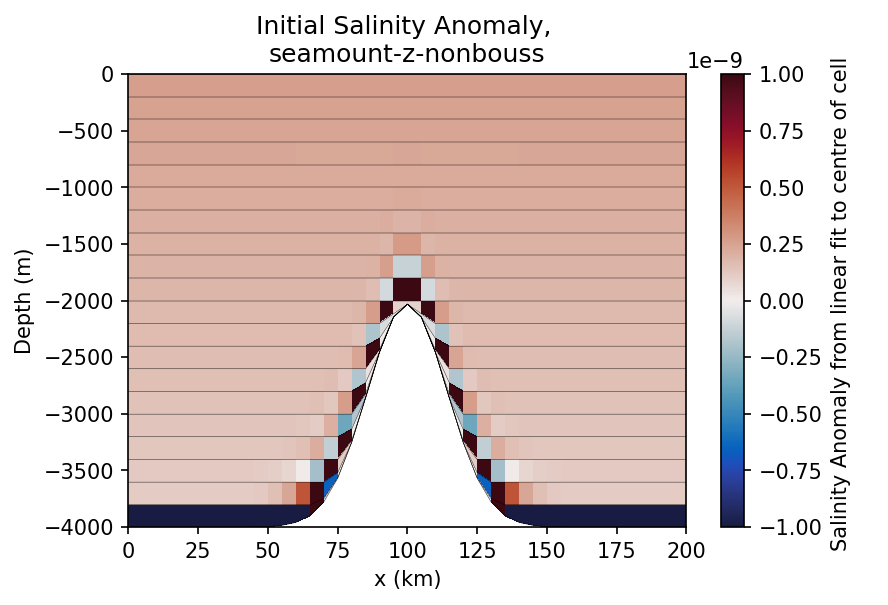

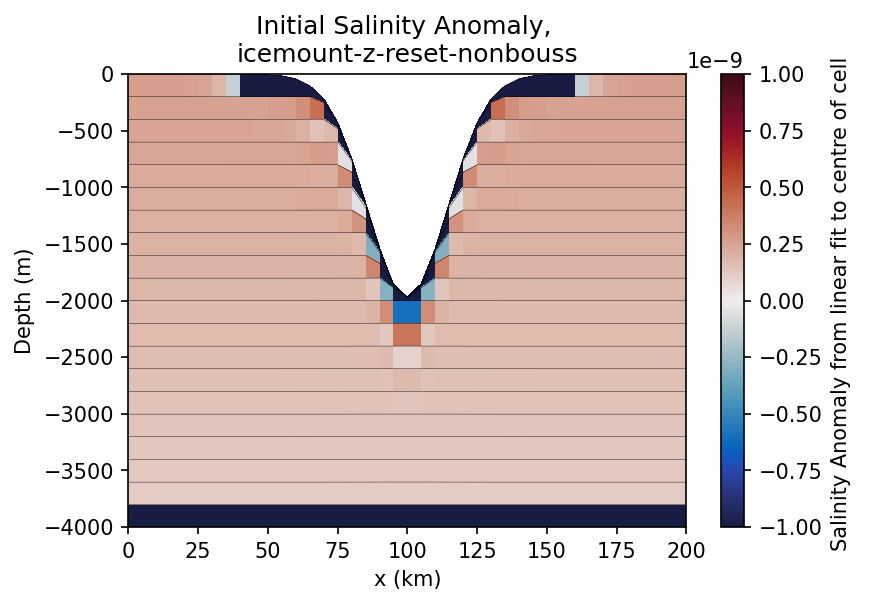

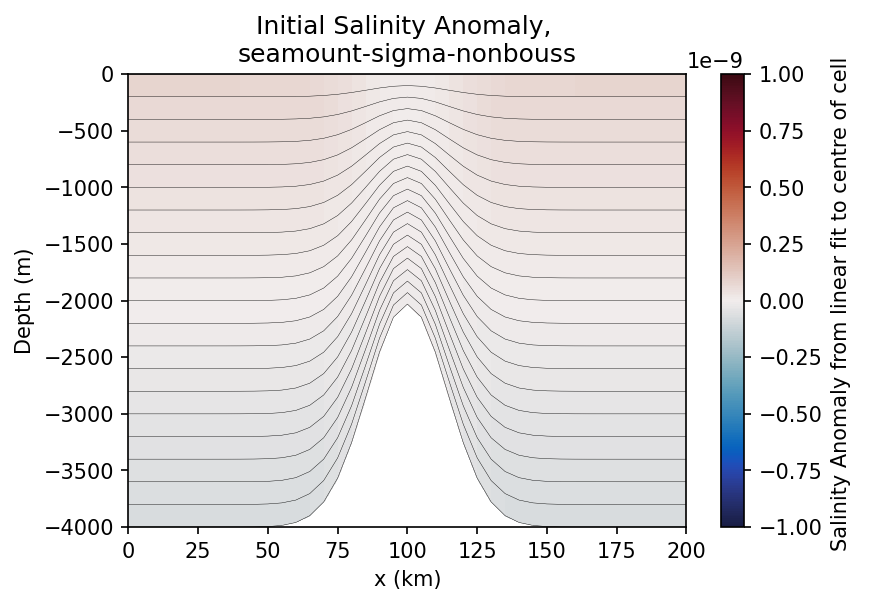

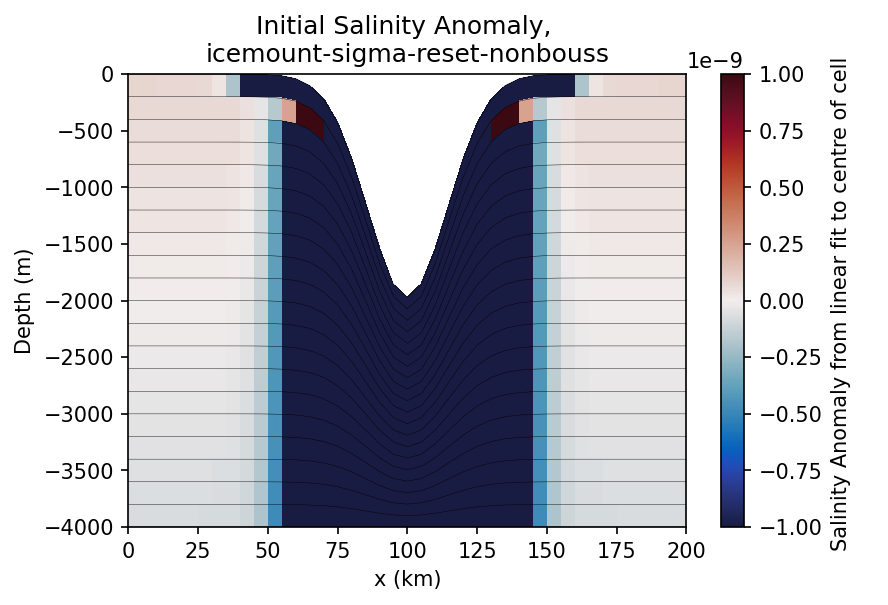

In [35]:
for label in ['seamount-z-nonbouss','icemount-z-reset-nonbouss','seamount-sigma-nonbouss',
             'icemount-sigma-reset-nonbouss']:

    fig, axes = plt.subplots(dpi = 150)
    IC = open_IC(label)
    time = 0
    x = 0
    ymax = 4000
    
    h_from_eta = xr.zeros_like(IC.Salt) + IC.eta.isel(Interface = np.arange(0,20)).values -IC.eta.isel(Interface = np.arange(1,21)).values
    
    ideal_salt = xr.zeros_like(IC.Salt) + (IC.eta.isel(Interface = 0)-h_from_eta.cumsum('Layer')+h_from_eta/2)*(34.55-33.8)/(-4000) + 33.8 
    plot_t(axes,x,time,IC.Salt-ideal_salt,"Salinity Anomaly from linear fit to centre of cell \n",-1e-9,1e-9,cm.cm.balance,ymax)
    axes.set_title('Initial Salinity Anomaly, \n'+label)
    plt.show()


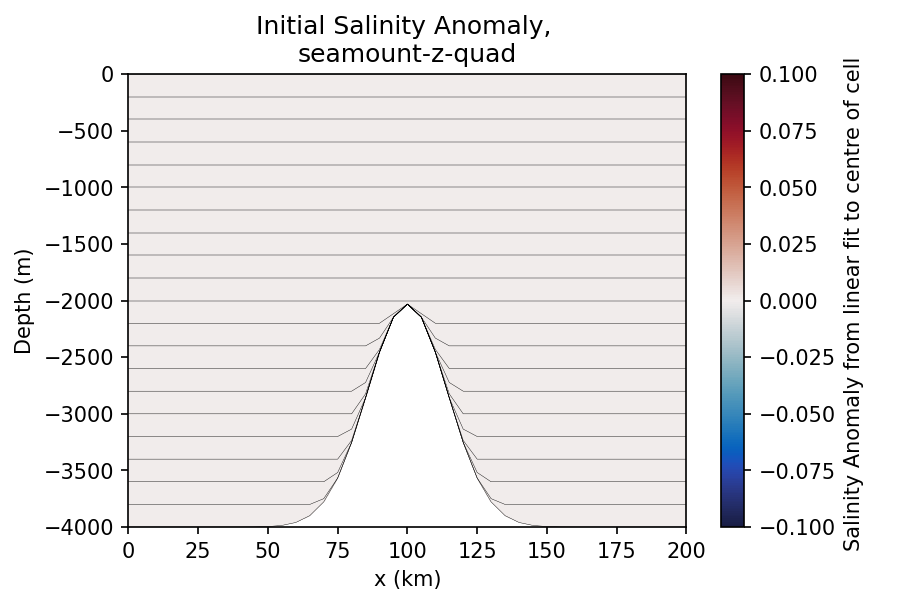

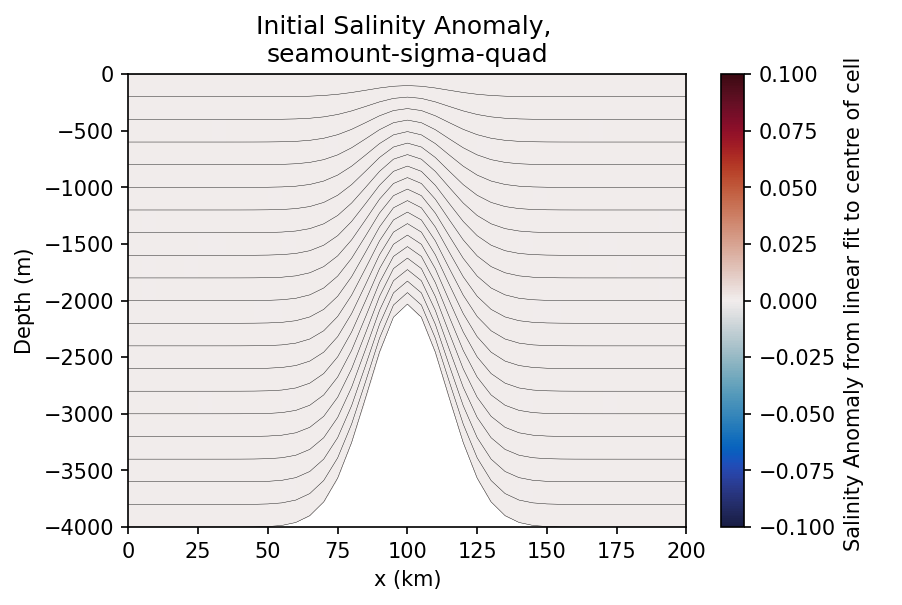

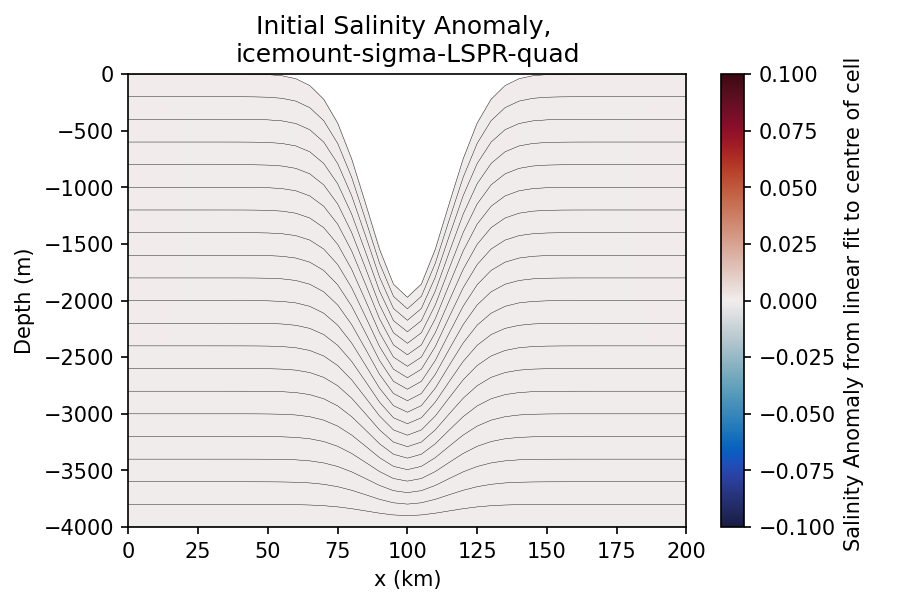

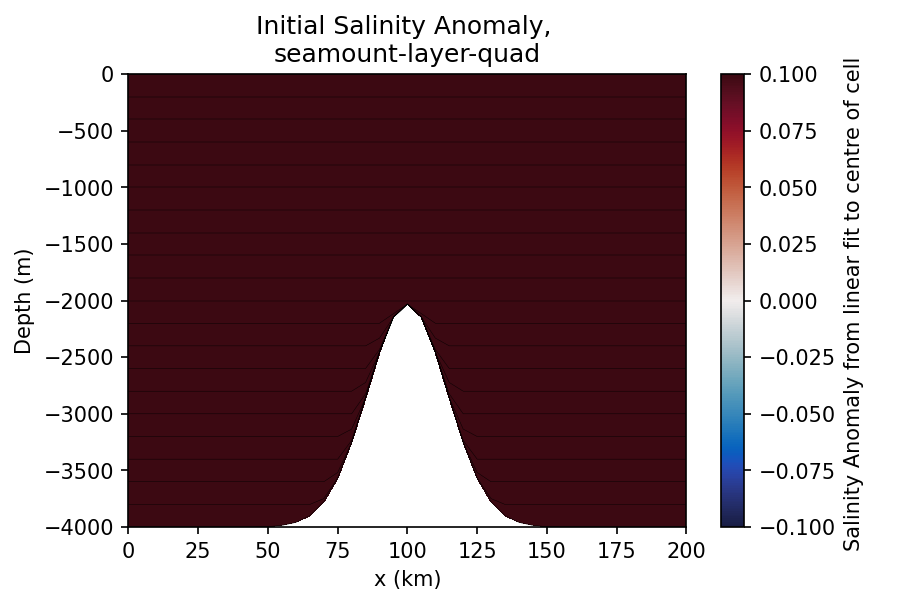

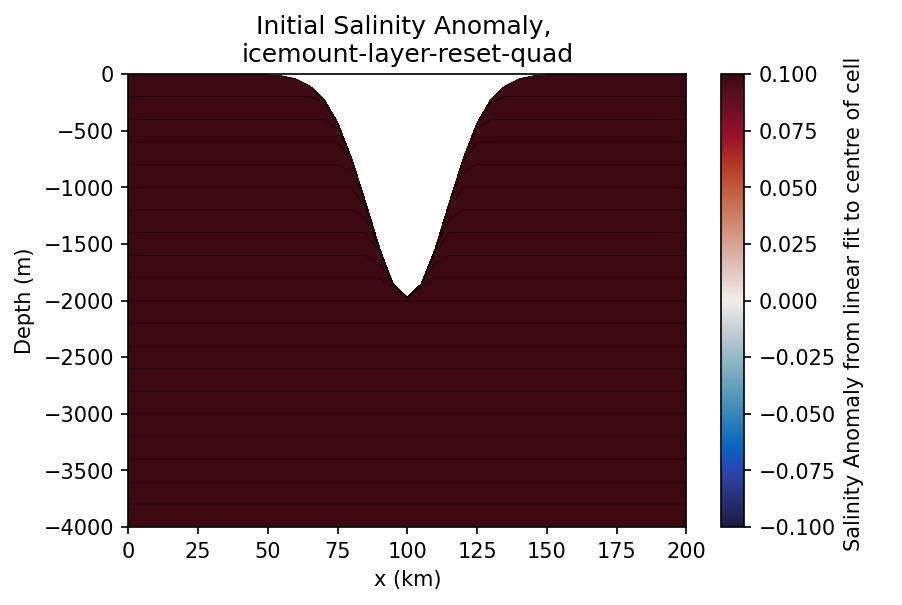

In [13]:
for label in ['seamount-z-quad','seamount-sigma-quad','icemount-sigma-LSPR-quad',
             'seamount-layer-quad','icemount-layer-reset-quad']:

    fig, axes = plt.subplots(dpi = 150)
    IC = open_IC(label)
    time = 0
    x = 0
    ymax = 4000
    
    ideal_salt = xr.zeros_like(IC.Salt) + (IC.eta.isel(Interface = 0)-IC.h.cumsum('Layer')+IC.h/2)*(34.55-33.8)/(-4000) \
    + 33.8 + ((IC.eta.isel(Interface = 0)-IC.h.cumsum('Layer')+IC.h/2)*(IC.eta.isel(Interface = 0)-IC.h.cumsum('Layer')+IC.h/2+4000))/4000**2*0.85
    plot_t(axes,x,time,IC.Salt-ideal_salt,"Salinity Anomaly from linear fit to centre of cell \n",-1e-1,1e-1,cm.cm.balance,ymax)
    axes.set_title('Initial Salinity Anomaly, \n'+label)
    plt.show()


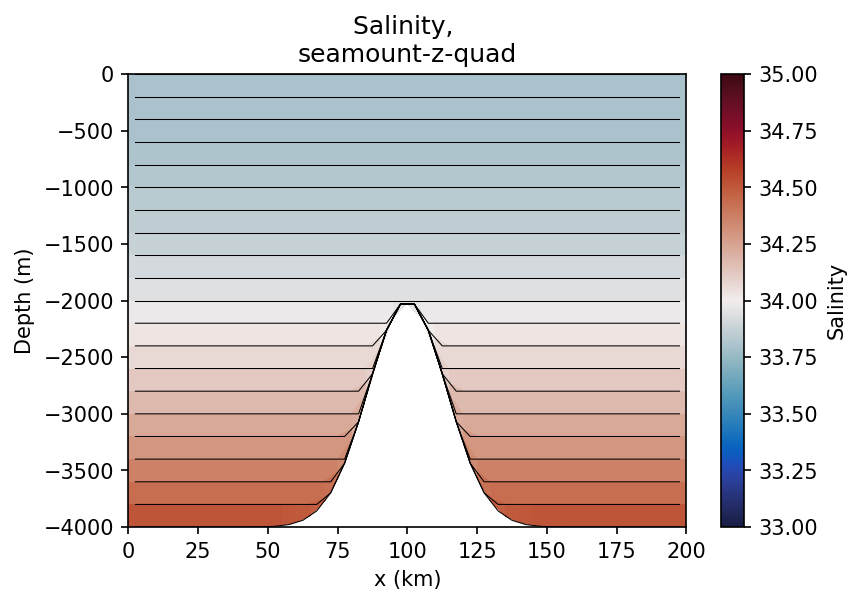

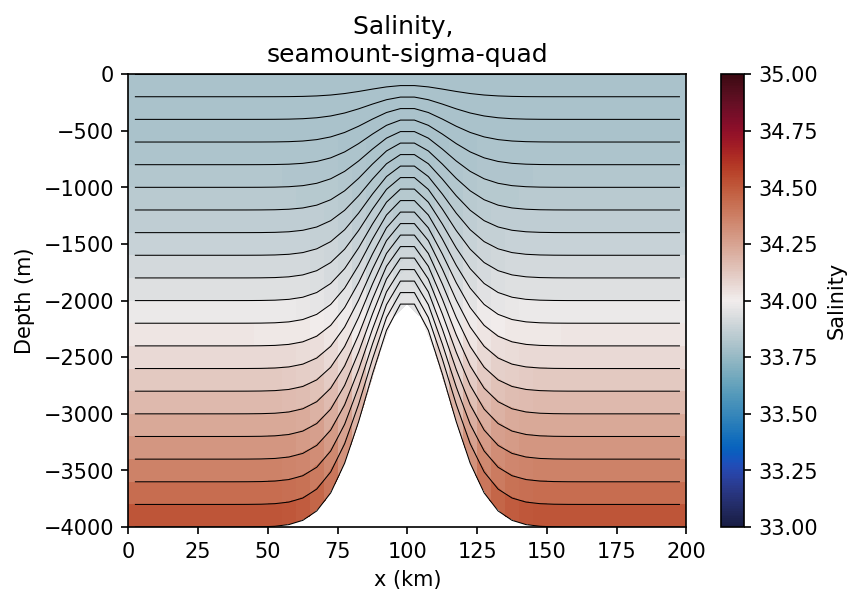

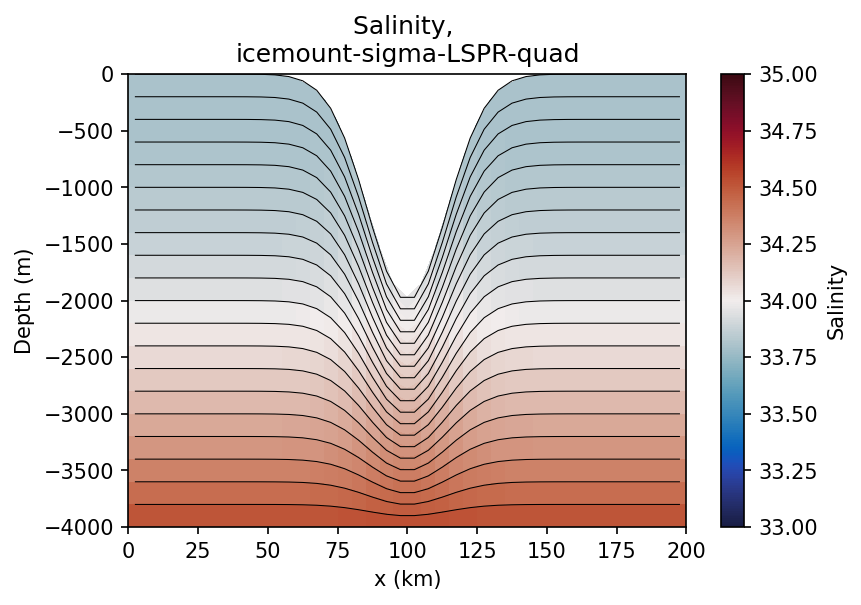

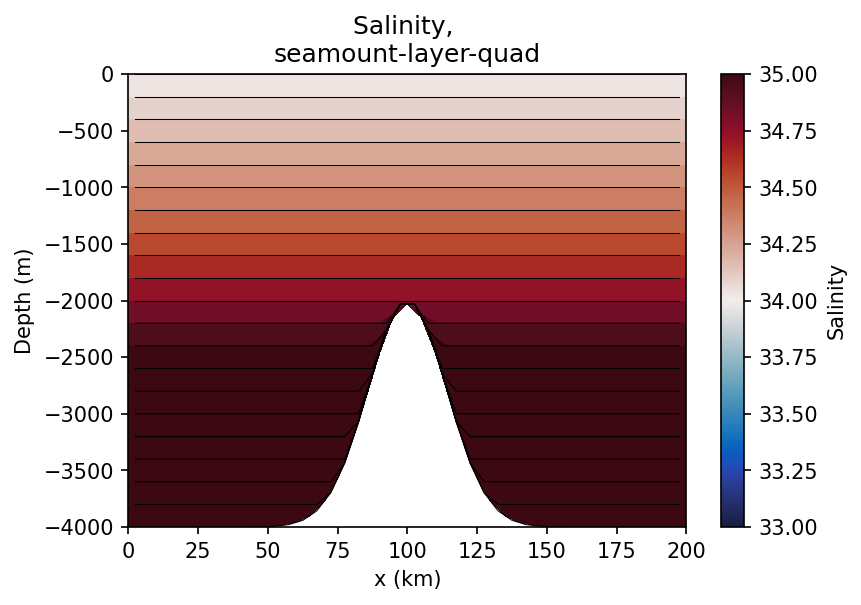

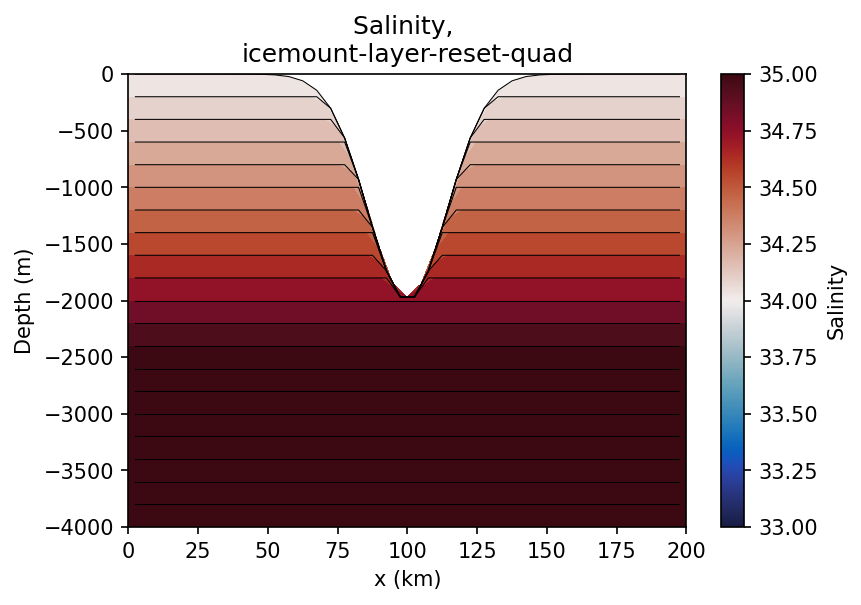

In [26]:
for label in ['seamount-z-quad','seamount-sigma-quad','icemount-sigma-LSPR-quad',
             'seamount-layer-quad','icemount-layer-reset-quad']:

    fig, axes = plt.subplots(dpi = 150)
    IC = open_IC(label)
    time = 0
    x = 0
    ymax = 4000
    
    #ideal_salt = xr.zeros_like(IC.Salt) + (IC.eta.isel(Interface = 0)-IC.h.cumsum('Layer')+IC.h/2)*(34.55-33.8)/(-4000) \
    #+ 33.8 + ((IC.eta.isel(Interface = 0)-IC.h.cumsum('Layer')+IC.h/2)*(IC.eta.isel(Interface = 0)-IC.h.cumsum('Layer')+IC.h/2+4000))/4000**2*0.85
    plot(axes,x,time,IC.Salt,"Salinity",33,35,cm.cm.balance,ymax)
    axes.set_title('Salinity, \n'+label)
    plt.show()


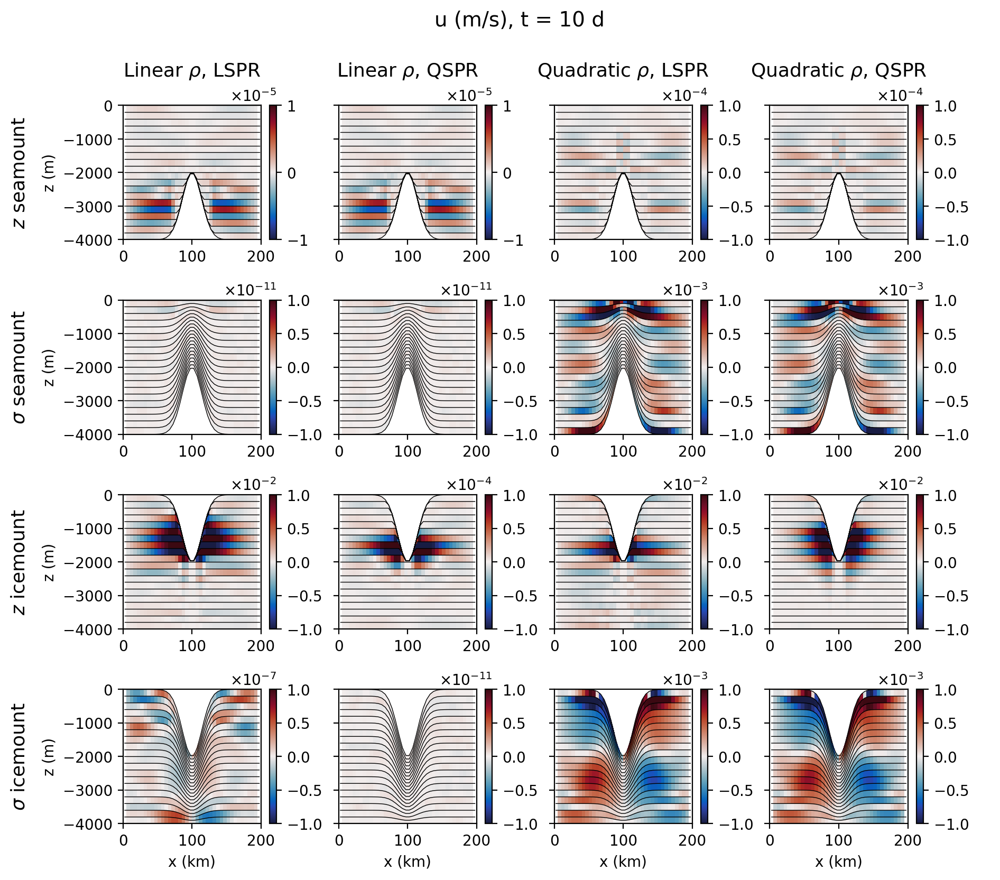

In [58]:
fig, axes = plt.subplots(ncols = 4, nrows = 4, figsize = (10,9),dpi = 200)
ax = np.ravel(axes)

for i in np.arange(16):

    label = ['seamount-z','seamount-z','seamount-z-quad','seamount-z-quad',
             'seamount-sigma','seamount-sigma','seamount-sigma-quad','seamount-sigma-quad',
              'icemount-z-LSPR','icemount-z-surfcorrect','icemount-z-LSPR-quad','icemount-z-surfcorrect-quad',
               'icemount-sigma-LSPR','icemount-sigma-surfcorrect','icemount-sigma-LSPR-quad','icemount-sigma-surfcorrect-quad'][i]
    loc = i
    vmax = [1e-5,1e-5,1e-4,1e-4,
            1e-11,1e-11,1e-3,1e-3,
            1e-2,1e-4,1e-2,1e-2,
            1e-7,1e-11,1e-3,1e-3,][i]
    
    a = ax[loc]

    prog = open_files(label)
    x = 0
    ymax = 4000

    plot(a,x,-1,prog.u,"uo",-vmax,vmax,cm.cm.balance,ymax)

    a.set_title('')
    if loc < 12:
        a.set_xlabel('')
    if (loc ==0) or (loc ==4) or (loc ==8) or (loc ==12):
        a.set_ylabel('z (m)')
        a.text(-150,-2000,[r'$z$ seamount',r'$\sigma$ seamount',r'$z$ icemount',r'$\sigma$ icemount'][int(loc/4)],
               ha = 'center', va = 'center',rotation = 90, fontsize = 13)
    else:
        a.set_ylabel('')
        a.set_yticklabels('')
        
    if loc < 4:
        a.set_title([r'Linear $\rho$, LSPR',r'Linear $\rho$, QSPR',r'Quadratic $\rho$, LSPR',r'Quadratic $\rho$, QSPR'][loc], 
                    y = 1.15, fontsize = 13)
fig.subplots_adjust(wspace = 0.25,hspace = 0.45)
fig.suptitle('u (m/s), t = 10 d', fontsize = 14, y = 0.98)



plt.show()


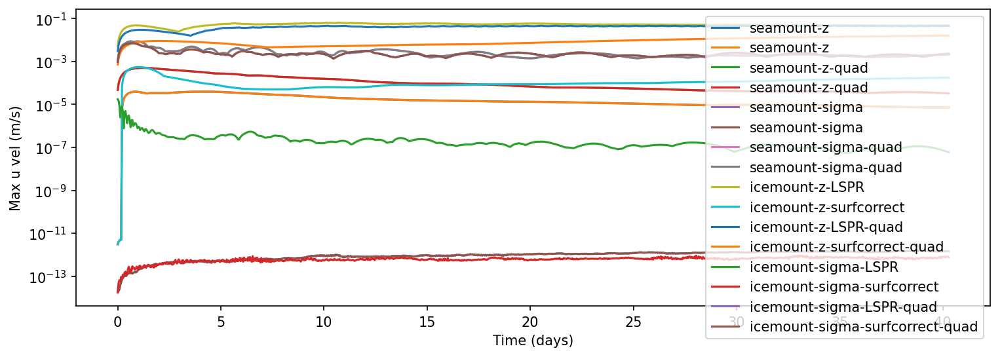

In [32]:
fig, axes = plt.subplots(figsize = (12,4),dpi = 150)

for label in ['seamount-z','seamount-z','seamount-z-quad','seamount-z-quad',
             'seamount-sigma','seamount-sigma','seamount-sigma-quad','seamount-sigma-quad',
              'icemount-z-LSPR','icemount-z-surfcorrect','icemount-z-LSPR-quad','icemount-z-surfcorrect-quad',
               'icemount-sigma-LSPR','icemount-sigma-surfcorrect','icemount-sigma-LSPR-quad','icemount-sigma-surfcorrect-quad']:


    prog = open_files(label)
    axes.plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
                 label = label) 
axes.set_ylabel('Max u vel (m/s)')
axes.set_xlabel('Time (days)')
axes.set_yscale('log')
plt.legend(loc = 'upper right')

Low spurious currents for all except `icemount-z-surfcorrect` which has the problem that vanishing layers mess up the otherwise perfect surface pressure. This is fixed in `icemount-z-reset` with `MASS_WEIGHT_IN_PRESSURE_GRADIENT` implemented for ice shelves, and resetting the integral at a nonvanished and nonMWIPG affected layer.

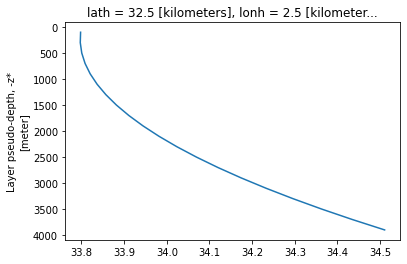

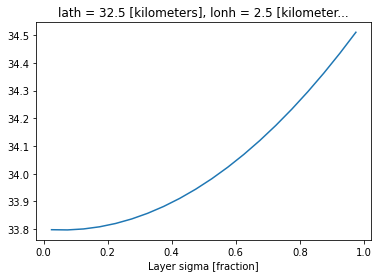

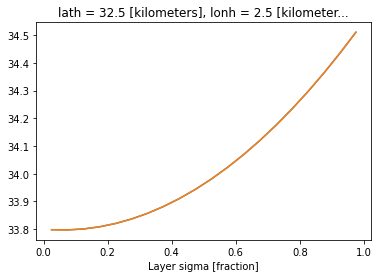

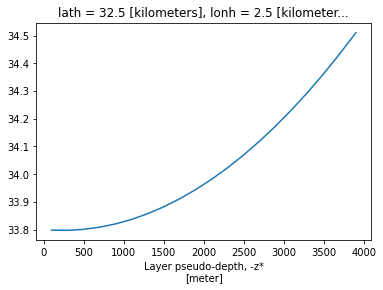

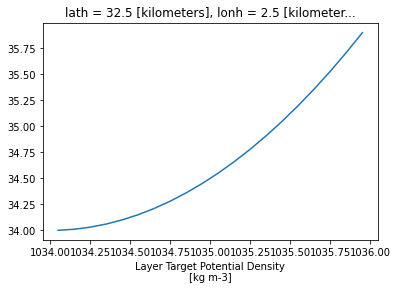

In [67]:
# make quadratic profile
IC = open_IC('seamount-z')
IC_S_COPY = IC.Salt.isel(lath = 0)+IC.Salt*0
middle_depth = IC.h.cumsum('Layer')-IC.h/2
IC_S_COPY = IC_S_COPY + 0.85*(middle_depth)*(middle_depth-4000)/4000**2
IC_S_COPY.isel(Time = 0, lath = 0, lonh = 0).plot(y = 'Layer',yincrease = False)
IC_S_COPY = IC_S_COPY.isel(Time = 0).rename('SALT')
ds_ICfile = xr.merge([IC_S_COPY.transpose("Layer","lath","lonh"), 
                      IC.Temp.isel(Time = 0).rename('PTEMP')]).drop('Time')
ds_ICfile.to_netcdf('INPUT/quadraticSaltseamountz.nc')
plt.show()

# make quadratic profile
IC = open_IC('seamount-sigma')
IC_S_COPY = IC.Salt.isel(lath = 0)+IC.Salt*0
middle_depth = IC.h.cumsum('Layer')-IC.h/2
IC_S_COPY = IC_S_COPY + 0.85*(middle_depth)*(middle_depth-4000)/4000**2
IC_S_COPY.isel(Time = 0, lath = 0, lonh = 0).plot()
IC_S_COPY = IC_S_COPY.isel(Time = 0).rename('SALT')
ds_ICfile = xr.merge([IC_S_COPY.transpose("Layer","lath","lonh"), 
                      IC.Temp.isel(Time = 0).rename('PTEMP')]).drop('Time')
ds_ICfile.to_netcdf('INPUT/quadraticSaltseamountsigma.nc')

plt.show()

# make quadratic profile
IC = open_IC('icemount-sigma-LSPR')
IC_S_COPY = IC.Salt#.isel(lath = 0)+IC.Salt*0
middle_depth = IC.h.cumsum('Layer')-IC.h/2 -IC.eta.isel(Interface = 0)
IC_S_COPY = IC_S_COPY + 0.85*(middle_depth)*(middle_depth-4000)/4000**2
IC_S_COPY.isel(Time = 0, lath = 0, lonh = 0).plot()
IC_S_COPY = IC_S_COPY.isel(Time = 0).rename('SALT')
ds_ICfile = xr.merge([IC_S_COPY.transpose("Layer","lath","lonh"), 
                      IC.Temp.isel(Time = 0).rename('PTEMP')]).drop('Time')
ds_ICfile.to_netcdf('INPUT/quadraticSalticemountsigma.nc')

# make quadratic profile
IC = open_IC('icemount-sigma-LSPR')
IC_S_COPY = IC.Salt.isel(lonh = 0)+IC.Salt*0
middle_depth = IC.h.cumsum('Layer')-IC.h/2 +IC.eta.isel(Interface = 0)
IC_S_COPY = IC_S_COPY + 0.85*(middle_depth.isel(lonh = 0))*(middle_depth.isel(lonh = 0)-4000)/4000**2
IC_S_COPY.isel(Time = 0, lath = 0, lonh = 0).plot()
IC_S_COPY = IC_S_COPY.isel(Time = 0).rename('SALT')
ds_ICfile = xr.merge([IC_S_COPY.transpose("Layer","lath","lonh"), 
                      IC.Temp.isel(Time = 0).rename('PTEMP')]).drop('Time').isel(lonh = 0, lath = 0)
ds_ICfile.to_netcdf('INPUT/quadraticSalticemountsigma1D.nc')
plt.show()

# make quadratic profile
IC = open_IC('icemount-z-LSPR')
IC_S_COPY = IC.Salt.isel(lonh = 0)+IC.Salt*0
middle_depth = IC.h.cumsum('Layer')-IC.h/2 +IC.eta.isel(Interface = 0)
IC_S_COPY = IC_S_COPY + 0.85*(middle_depth.isel(lonh = 0))*(middle_depth.isel(lonh = 0)-4000)/4000**2
IC_S_COPY.isel(Time = 0, lath = 0, lonh = 0).plot()
IC_S_COPY = IC_S_COPY.isel(Time = 0).rename('SALT')
ds_ICfile = xr.merge([IC_S_COPY.transpose("Layer","lath","lonh"), 
                      IC.Temp.isel(Time = 0).rename('PTEMP')]).drop('Time').isel(lonh = 0, lath = 0)
ds_ICfile.to_netcdf('INPUT/quadraticSalticemountz1D.nc')
plt.show()
# make quadratic profile
IC = open_IC('icemount-layer-LSPR')
IC_S_COPY = IC.Salt.isel(lonh = 0)+IC.Salt*0
middle_depth = IC.h.cumsum('Layer')-IC.h/2 +IC.eta.isel(Interface = 0)
IC_S_COPY = IC_S_COPY + 2*(middle_depth.isel(lonh = 0))*(middle_depth.isel(lonh = 0)-4000)/4000**2
IC_S_COPY.isel(Time = 0, lath = 0, lonh = 0).plot()
IC_S_COPY = IC_S_COPY.isel(Time = 0).rename('SALT')
ds_ICfile = xr.merge([IC_S_COPY.transpose("Layer","lath","lonh"), 
                      IC.Temp.isel(Time = 0).rename('PTEMP')]).drop('Time').isel(lonh = 0, lath = 0)
ds_ICfile.to_netcdf('INPUT/quadraticSalticemountlayer1D.nc')

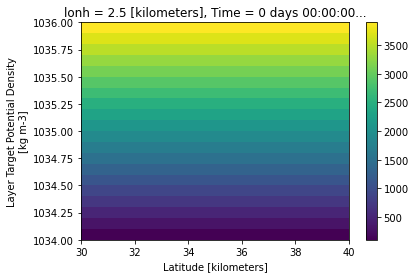

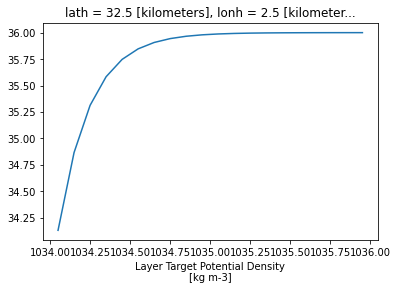

In [75]:
# make exponential profile rhotop+S*(np.exp(-((depth)/z_bot*10))-1)
IC = open_IC('icemount-layer-LSPR')
IC_S_COPY = IC.Salt.isel(lonh = 0)+IC.Salt*0
middle_depth = IC.h.cumsum('Layer')-IC.h/2 +IC.eta.isel(Interface = 0)
middle_depth.isel(lonh=0).plot()
plt.show()
IC_S_COPY = IC_S_COPY*0+33.6 - 2.4*(np.exp(-middle_depth.isel(lonh = 0)/400)-1)
IC_S_COPY.isel(Time = 0, lath = 0, lonh = 0).plot()
IC_S_COPY = IC_S_COPY.isel(Time = 0).rename('SALT')
ds_ICfile = xr.merge([IC_S_COPY.transpose("Layer","lath","lonh"), 
                      IC.Temp.isel(Time = 0).rename('PTEMP')]).drop('Time').isel(lonh = 0, lath = 0)
ds_ICfile.to_netcdf('INPUT/exponentialSalticemountlayer1D.nc')


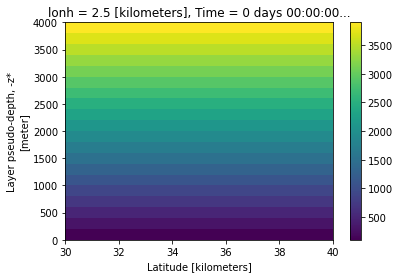

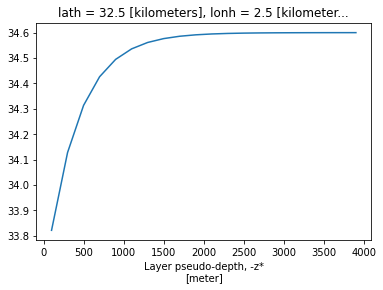

In [111]:
# make exponential profile rhotop+S*(np.exp(-((depth)/z_bot*10))-1)
IC = open_IC('icemount-z-LSPR')
IC_S_COPY = IC.Salt.isel(lonh = 0)+IC.Salt*0
middle_depth = IC.h.cumsum('Layer')-IC.h/2 +IC.eta.isel(Interface = 0)
middle_depth.isel(lonh=0).plot()
plt.show()
IC_S_COPY = IC_S_COPY*0+33.6 - 1*(np.exp(-middle_depth.isel(lonh = 0)/400)-1)
IC_S_COPY.isel(Time = 0, lath = 0, lonh = 0).plot()
IC_S_COPY = IC_S_COPY.isel(Time = 0).rename('SALT')
ds_ICfile = xr.merge([IC_S_COPY.transpose("Layer","lath","lonh"), 
                      IC.Temp.isel(Time = 0).rename('PTEMP')]).drop('Time').isel(lonh = 0, lath = 0)
ds_ICfile.to_netcdf('INPUT/exponentialSalticemountz1D.nc')


In [70]:
ds_ICfile.SALT#.isel(lath = 0).plot()

<xarray.DataArray 'SALT' (Layer: 20)>
array([34.13087812, 34.86632027, 35.31238849, 35.58294254, 35.74704186,
       35.84657313, 35.9069419 , 35.94355741, 35.96576584, 35.97923593,
       35.98740596, 35.99236133, 35.99536691, 35.99718989, 35.99829558,
       35.99896622, 35.99937298, 35.99961969, 35.99976933, 35.99986009])
Coordinates:
    lath       float64 32.5
    lonh       float64 2.5
  * Layer      (Layer) float64 1.034e+03 1.034e+03 ... 1.036e+03 1.036e+03
    Interface  float64 1.034e+03

/Users/claireyung/opt/anaconda3/lib/python3.9/site-packages/xarray/coding/times.py:699: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/Users/claireyung/opt/anaconda3/lib/python3.9/site-packages/xarray/coding/times.py:699: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)


No magic interface output


/Users/claireyung/opt/anaconda3/lib/python3.9/site-packages/xarray/coding/times.py:699: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/Users/claireyung/opt/anaconda3/lib/python3.9/site-packages/xarray/coding/times.py:699: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/Users/claireyung/opt/anaconda3/lib/python3.9/site-packages/xarray/coding/times.py:699: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)


No magic interface output
No magic interface output


/Users/claireyung/opt/anaconda3/lib/python3.9/site-packages/xarray/coding/times.py:699: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)


1
2
4
6
8
9
9
9
8
6
4
2
1


/Users/claireyung/opt/anaconda3/lib/python3.9/site-packages/xarray/coding/times.py:699: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)


1
2
4
6
8
9
9
9
8
6
4
2
1


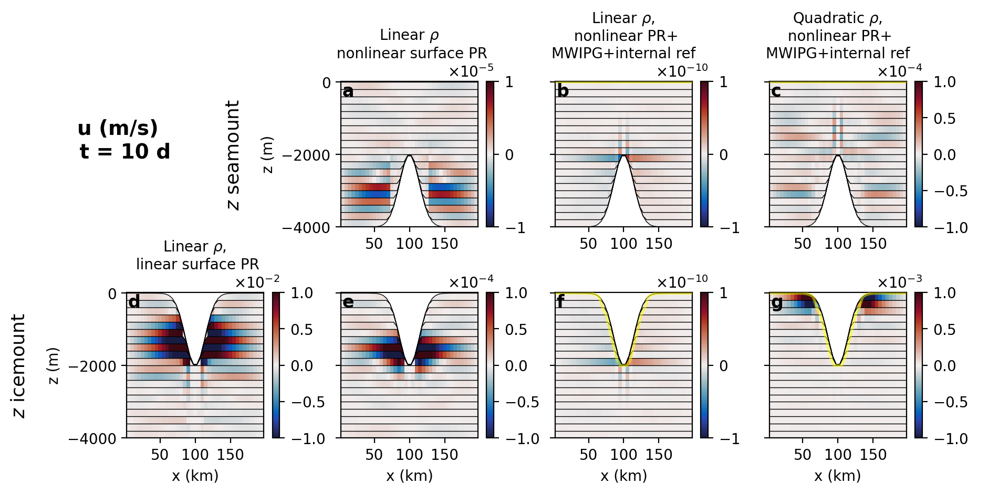

In [28]:
fig, axes = plt.subplots(ncols = 4, nrows = 2, figsize = (10,4.5),dpi = 200)
ax = np.ravel(axes)

for i in np.arange(7):

    label = ['seamount-z','seamount-z-MWIPG','seamount-z-quad-MWIPG',
              'icemount-z-LSPR','icemount-z-surfcorrect','icemount-z-reset','icemount-z-reset-quad'][i]
    loc = i+1
    vmax = [1e-5,1e-10,1e-4,
            1e-2,1e-4,1e-10,1e-3][i]
    
    a = ax[loc]

    prog = open_files(label)
    x = 0
    ymax = 4000

    plot_u(a,x,-1,prog.u,"uo",-vmax,vmax,cm.cm.balance,ymax)

    a.set_title('')
    if loc < 4:
        a.set_xlabel('')
    if (loc ==1):
        a.set_ylabel('z (m)')
        a.text(-150,-2000,r'$z$ seamount',
               ha = 'center', va = 'center',rotation = 90, fontsize = 13)
    elif (loc==4):
        a.set_ylabel('z (m)')
        a.text(-150,-2000,r'$z$ icemount',
               ha = 'center', va = 'center',rotation = 90, fontsize = 13)
        
    else:
        a.set_ylabel('')
        a.set_yticklabels('')
        
    if loc < 5:
        a.set_title(['',r'Linear $\rho$'+' \n nonlinear surface PR',r'Linear $\rho$, '+'\n nonlinear PR+\nMWIPG+internal ref',r'Quadratic $\rho$, '+'\n nonlinear PR+\nMWIPG+internal ref',r'Linear $\rho$, '+'\n linear surface PR'][loc], 
                    y = 1.1, fontsize = 10)
    a.text(0.01,0.99,['a','b','c','d','e','f','g','h','i','j'][i], fontsize = 12, transform=a.transAxes, fontweight='bold', va='top', zorder = 20)

    
ax[0].set_axis_off()

fig.subplots_adjust(wspace = 0.25,hspace = 0.45)
fig.suptitle('u (m/s) \n t = 10 d', fontsize = 14, y = 0.8, x = 0.12,weight = 'bold')



plt.show()


/Users/claireyung/opt/anaconda3/lib/python3.9/site-packages/xarray/coding/times.py:699: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/Users/claireyung/opt/anaconda3/lib/python3.9/site-packages/xarray/coding/times.py:699: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/Users/claireyung/opt/anaconda3/lib/python3.9/site-packages/xarray/coding/times.py:699: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/Users/claireyung/opt/

No magic interface output
1
2
2
2
2
2
2
2
2
1


/Users/claireyung/opt/anaconda3/lib/python3.9/site-packages/xarray/coding/times.py:699: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)


1
2
2
2
2
2
2
2
2
1


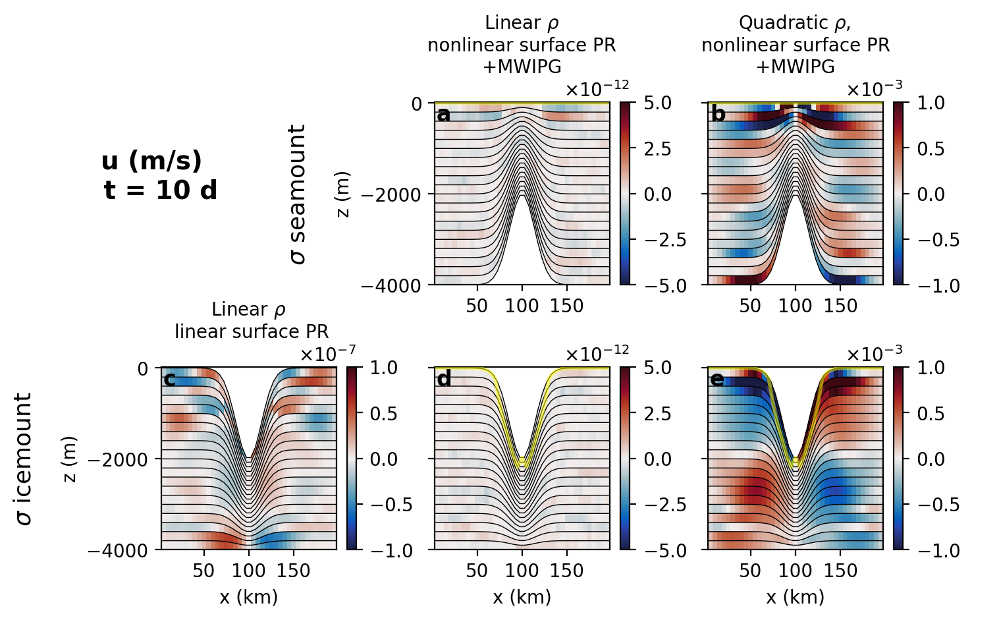

In [29]:
fig, axes = plt.subplots(ncols = 3, nrows = 2, figsize = (7.5,4.5),dpi = 200)
ax = np.ravel(axes)

for i in np.arange(5):

    label = ['seamount-sigma','seamount-sigma-quad',
              'icemount-sigma-LSPR','icemount-sigma-reset','icemount-sigma-reset-quad'][i]
    loc = [1,2,3,4,5][i]
    vmax = [5e-12,1e-3,
            1e-7,5e-12,1e-3][i]
    
    a = ax[loc]

    prog = open_files(label)
    x = 0
    ymax = 4000

    plot_u(a,x,-1,prog.u,"uo",-vmax,vmax,cm.cm.balance,ymax)

    a.set_title('')
    if loc < 3:
        a.set_xlabel('')
    if (loc ==1):
        a.set_ylabel('z (m)')
        a.text(-150,-2000,r'$\sigma$ seamount',
               ha = 'center', va = 'center',rotation = 90, fontsize = 13)
    elif (loc==3):
        a.set_ylabel('z (m)')
        a.text(-150,-2000,r'$\sigma$ icemount',
               ha = 'center', va = 'center',rotation = 90, fontsize = 13)
        
    else:
        a.set_ylabel('')
        a.set_yticklabels('')
        
    if loc < 4:
        a.set_title(['',r'Linear $\rho$'+' \n nonlinear surface PR \n+MWIPG',r'Quadratic $\rho$, '+'\n nonlinear surface PR \n+MWIPG',r'Linear $\rho$'+' \n linear surface PR'][loc], 
                    y = 1.1, fontsize = 10)
    a.text(0.01,0.99,['a','b','c','d','e','f','g','h','i','j'][i], fontsize = 12, transform=a.transAxes, fontweight='bold', va='top', zorder = 20)

    
ax[0].set_axis_off()

fig.subplots_adjust(wspace = 0.25,hspace = 0.45)
fig.suptitle('u (m/s) \n t = 10 d', fontsize = 14, y = 0.8, x = 0.12,weight = 'bold')



plt.show()


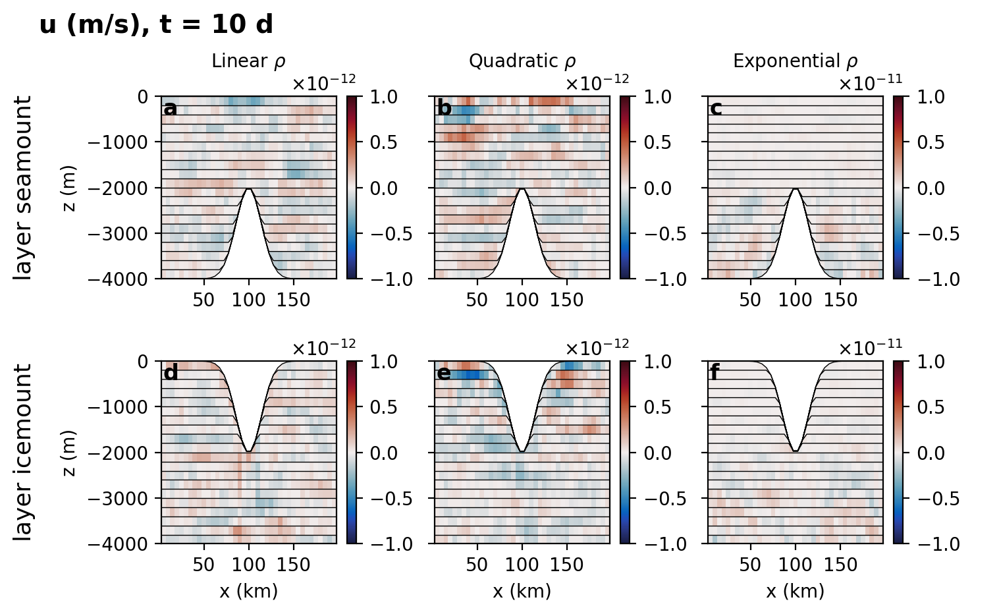

In [40]:
fig, axes = plt.subplots(ncols = 3, nrows = 2, figsize = (7.5,4.5),dpi = 200)
ax = np.ravel(axes)

for i in np.arange(6):

    label = ['seamount-layer','seamount-layer-quad','seamount-layer-exp',
              'icemount-layer-LSPR','icemount-layer-reset-quad','icemount-layer-LSPR-exp'][i]
    loc = [0,1,2,3,4,5][i]
    vmax = [1e-12,1e-12,1e-11,
            1e-12,1e-12,1e-11][i]
    
    a = ax[loc]

    prog = open_files(label)
    x = 0
    ymax = 4000

    plot_u(a,x,-1,prog.u,"uo",-vmax,vmax,cm.cm.balance,ymax)

    a.set_title('')
    if loc < 3:
        a.set_xlabel('')
    if (loc ==0):
        a.set_ylabel('z (m)')
        a.text(-150,-2000,r'layer seamount',
               ha = 'center', va = 'center',rotation = 90, fontsize = 13)
    elif (loc==3):
        a.set_ylabel('z (m)')
        a.text(-150,-2000,r'layer icemount',
               ha = 'center', va = 'center',rotation = 90, fontsize = 13)
        
    else:
        a.set_ylabel('')
        a.set_yticklabels('')
        
    if loc < 3:
        a.set_title([r'Linear $\rho$',r'Quadratic $\rho$',r'Exponential $\rho$'][loc], 
                    y = 1.1, fontsize = 10)
    a.text(0.01,0.99,['a','b','c','d','e','f','g','h','i','j'][i], fontsize = 12, transform=a.transAxes, fontweight='bold', va='top')

    
#ax[0].set_axis_off()

fig.subplots_adjust(wspace = 0.25,hspace = 0.45)
fig.suptitle('u (m/s), t = 10 d', fontsize = 14, y = 1.02, x = 0.12,weight = 'bold')



plt.show()


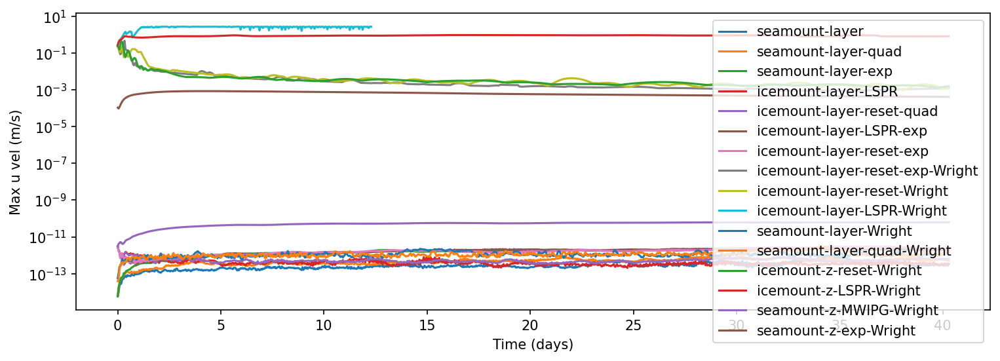

In [113]:
fig, axes = plt.subplots(figsize = (12,4),dpi = 150)

for label in ['seamount-layer','seamount-layer-quad','seamount-layer-exp',
              'icemount-layer-LSPR','icemount-layer-reset-quad','icemount-layer-LSPR-exp',
              'icemount-layer-reset-exp','icemount-layer-reset-exp-Wright','icemount-layer-reset-Wright',
             'icemount-layer-LSPR-Wright','seamount-layer-Wright','seamount-layer-quad-Wright',
             'icemount-z-reset-Wright','icemount-z-LSPR-Wright','seamount-z-MWIPG-Wright','seamount-z-exp-Wright']:


    prog = open_files(label)
    axes.plot(np.arange(len(prog.Time))/24,np.abs(prog.u).max(['zl','yh','xq']), 
                 label = label) 
axes.set_ylabel('Max u vel (m/s)')
axes.set_xlabel('Time (days)')
axes.set_yscale('log')
plt.legend(loc = 'upper right')

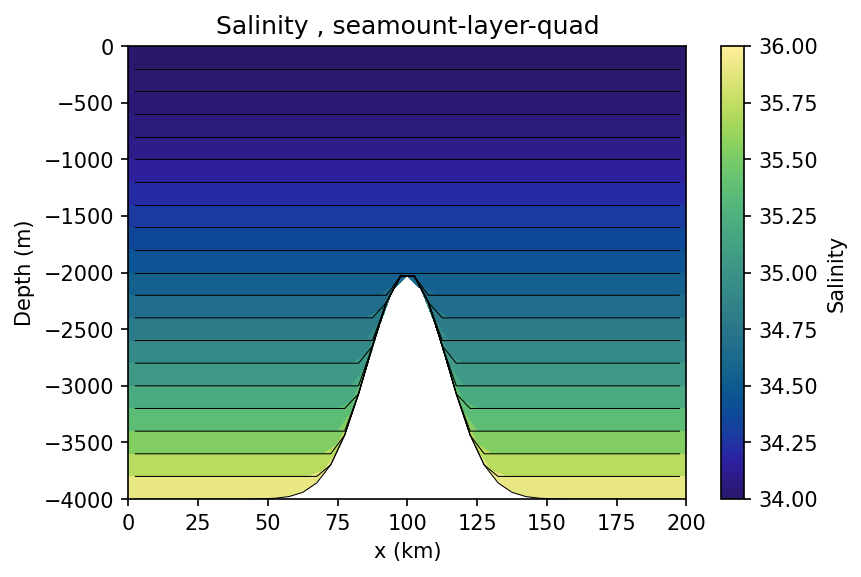

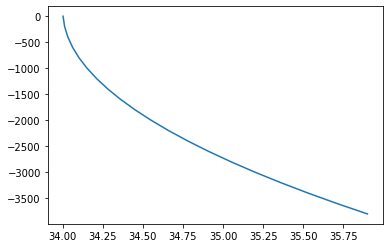

In [61]:
fig, axes = plt.subplots(dpi = 150)
label = 'seamount-layer-quad'
prog = open_files(label)
time = 0
x = 0
ymax = 4000

plot(axes,x,time,prog.salt,"Salinity",34,36,cm.cm.haline,ymax)
plt.show()
plt.plot(prog.salt.isel(Time = 0,yh = 0,xh = 0).values,prog.e.isel(Time = 0,yh = 0,xh = 0).values[:-1])


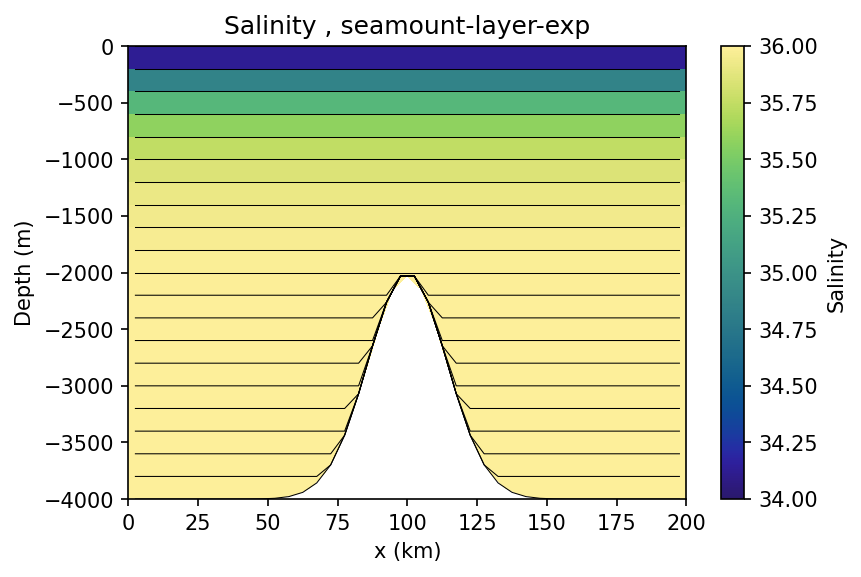

In [79]:
fig, axes = plt.subplots(dpi = 150)
label = 'seamount-layer-exp'
prog = open_files(label)
time = 0
x = 0
ymax = 4000

plot(axes,x,time,prog.salt,"Salinity",34,36,cm.cm.haline,ymax)


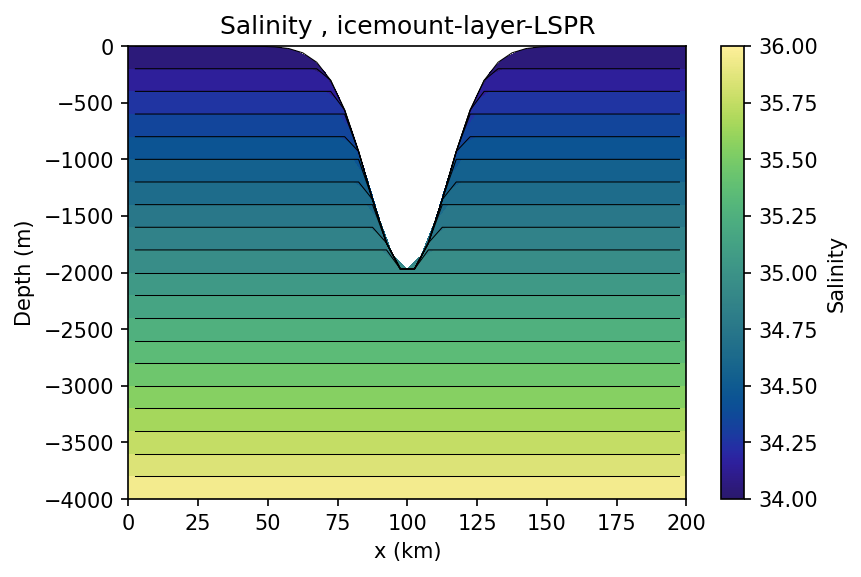

In [72]:
fig, axes = plt.subplots(dpi = 150)
label = 'icemount-layer-LSPR'
prog = open_files(label)

time = 0
x = 0
ymax = 4000

plot(axes,x,time,prog.salt,"Salinity",34,36,cm.cm.haline,ymax)


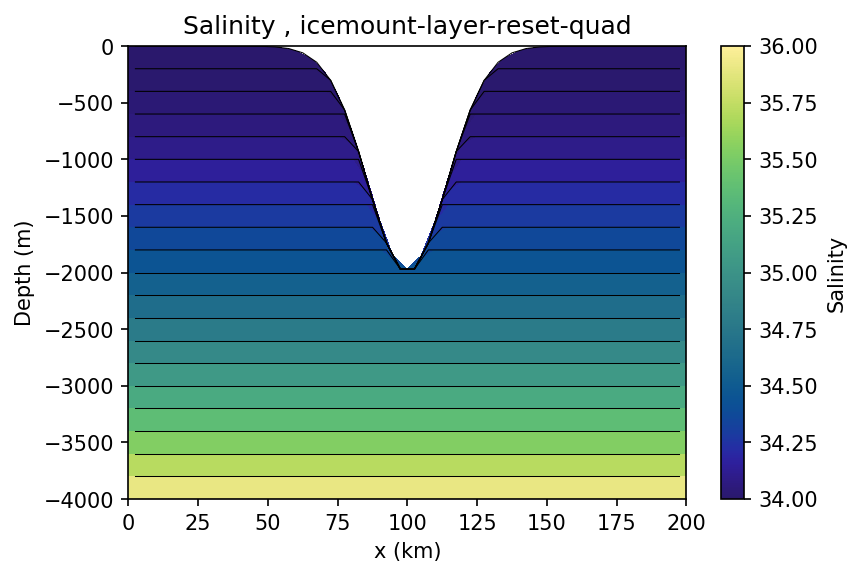

In [81]:
fig, axes = plt.subplots(dpi = 150)
label = 'icemount-layer-reset-quad'
prog = open_files(label)

time = 0
x = 0
ymax = 4000

plot(axes,x,time,prog.salt,"Salinity",34,36,cm.cm.haline,ymax)


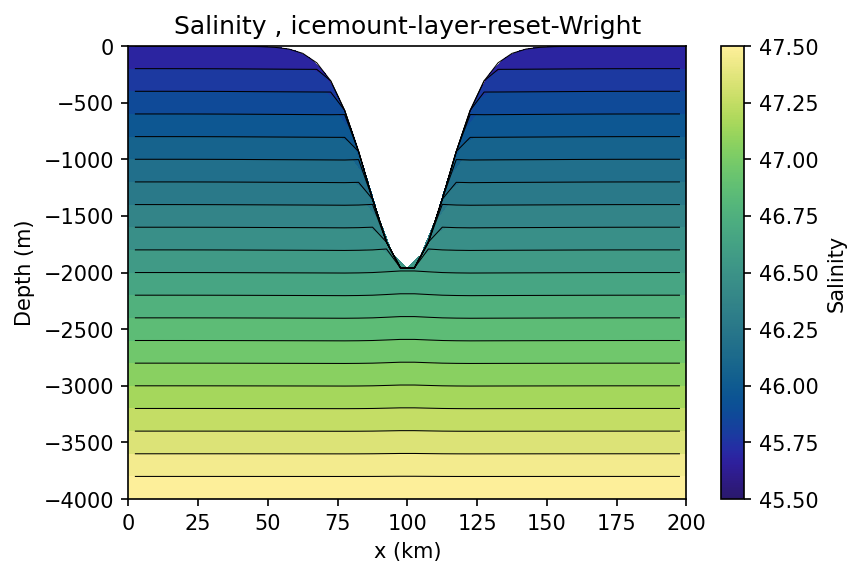

In [18]:
fig, axes = plt.subplots(dpi = 150)
label = 'icemount-layer-reset-Wright'
prog = open_files(label)

time = 0
x = 0
ymax = 4000

plot(axes,x,time,prog.salt,"Salinity",45.5,47.5,cm.cm.haline,ymax)


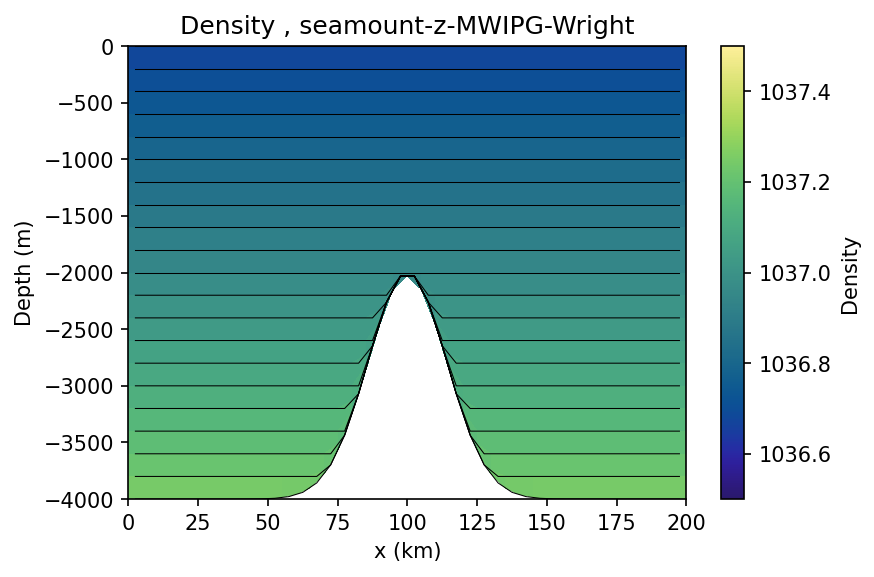

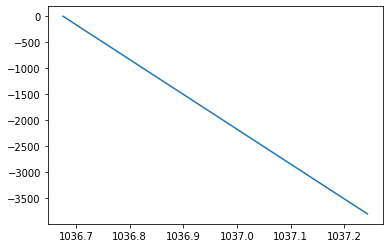

In [15]:
fig, axes = plt.subplots(dpi = 150)
label = 'seamount-z-MWIPG-Wright'
prog = open_files(label)

time = 0
x = 0
ymax = 4000

plot(axes,x,time,prog.Rml,"Density",1036.5,1037.5,cm.cm.haline,ymax)
plt.show()

plt.plot(prog.Rml.isel(Time = 0, yh = 0, xh = 0).values,prog.e.isel(Time = 0, yh = 0, xh = 0).values[:-1])

# Initialisation of layer mode with Wright EQN OF STATE?

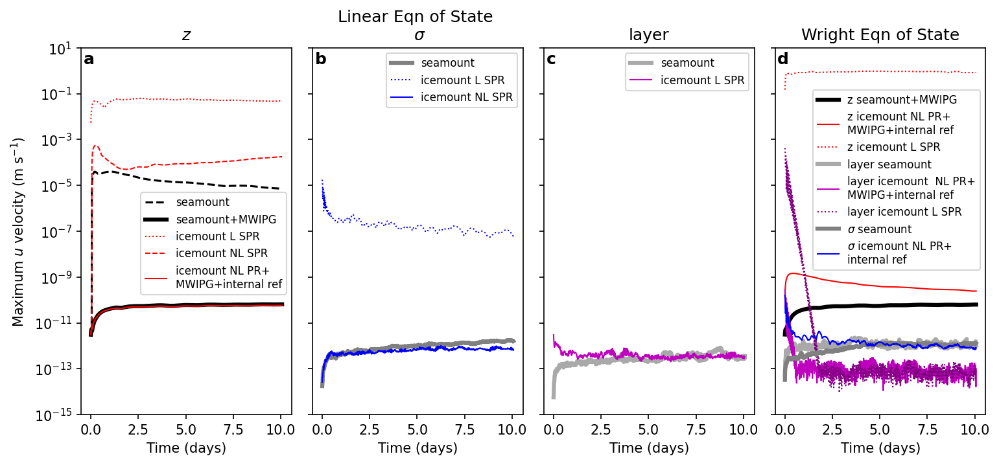

In [22]:
fig, axes = plt.subplots(ncols = 4, figsize = (12,5),dpi = 150, sharey = True)

# for label in ['seamount-layer','seamount-layer-quad','seamount-layer-exp',
#               'icemount-layer-LSPR','icemount-layer-reset-quad','icemount-layer-LSPR-exp',
#               'icemount-layer-reset-exp','icemount-layer-reset-exp-Wright','icemount-layer-reset-Wright',
#              'icemount-layer-LSPR-Wright','seamount-layer-Wright','seamount-layer-quad-Wright',
#              'icemount-z-reset-Wright','icemount-z-LSPR-Wright','seamount-z-MWIPG-Wright','seamount-z-exp-Wright']:
for i in np.arange(5):
    label = ['seamount-z','seamount-z-MWIPG',
              'icemount-z-LSPR','icemount-z-surfcorrect','icemount-z-reset'][i]
    labelplot = ['seamount','seamount+MWIPG','icemount L SPR','icemount NL SPR','icemount NL PR+\nMWIPG+internal ref'][i]
    color = ['k','k','r','r','r'][i]
    linestyle = ['--','-','dotted','--','-'][i]
    linewidth = [1.5,3,1,1,1][i]
    prog = open_files(label)
    axes[0].plot(np.arange(len(prog.Time))/24/4,np.abs(prog.u).max(['zl','yh','xq']), 
                 label = labelplot, color = color, linestyle = linestyle, linewidth = linewidth) 
axes[0].set_ylabel('Maximum $u$ velocity (m s$^{-1}$)')
axes[0].set_xlabel('Time (days)')
axes[0].set_yscale('log')
axes[0].legend(loc = 'upper right', fontsize = 8, bbox_to_anchor = (1,0.62))

for i in np.arange(3):
    label = ['seamount-sigma','icemount-sigma-LSPR','icemount-sigma-reset'][i]
    labelplot = ['seamount','icemount L SPR','icemount NL SPR'][i]
    color = ['gray','b','b','b'][i]
    linestyle = ['-','dotted','-'][i]
    linewidth = [3,1,1,1][i]
    prog = open_files(label)
    axes[1].plot(np.arange(len(prog.Time))/24/4,np.abs(prog.u).max(['zl','yh','xq']), 
                 label = labelplot, color = color, linestyle = linestyle, linewidth = linewidth) 
#axes[0].set_ylabel('Max u vel (m/s)')
axes[1].set_xlabel('Time (days)')
#axes[0].set_yscale('log')
axes[1].legend(loc = 'upper right', fontsize = 8)

for i in np.arange(2):
    label = ['seamount-layer','icemount-layer-LSPR'][i]
    labelplot = ['seamount','icemount L SPR'][i]
    color = ['darkgrey','m','b','b'][i]
    linestyle = ['-','-'][i]
    linewidth = [3,1,1,1][i]
    prog = open_files(label)
    axes[2].plot(np.arange(len(prog.Time))/24/4,np.abs(prog.u).max(['zl','yh','xq']), 
                 label = labelplot, color = color, linestyle = linestyle, linewidth = linewidth) 
#axes[0].set_ylabel('Max u vel (m/s)')
axes[2].set_xlabel('Time (days)')
#axes[0].set_yscale('log')
axes[2].legend(loc = 'upper right', fontsize = 8)


for i in np.arange(8):
    label = ['seamount-z-MWIPG-Wright','icemount-z-reset-Wright','icemount-z-LSPR-Wright',
             'seamount-layer-Wright','icemount-layer-reset-Wright','icemount-layer-LSPR-Wright',
             'seamount-sigma-Wright','icemount-sigma-reset-Wright'][i]
    labelplot = ['z seamount+MWIPG','z icemount NL PR+\nMWIPG+internal ref','z icemount L SPR',
                 'layer seamount', 'layer icemount  NL PR+\nMWIPG+internal ref','layer icemount L SPR',
                 '$\sigma$ seamount','$\sigma$ icemount NL PR+\ninternal ref'][i]
    color = ['k','r','r','darkgrey','m','purple','gray','b',][i]
    linestyle = ['-','-','dotted','-','-','dotted','-','-'][i]
    linewidth = [3,1,1,3,1,1,3,1][i]
    prog = open_files(label)
    axes[3].plot(np.arange(len(prog.Time))/24/4,np.abs(prog.u).max(['zl','yh','xq']), 
                 label = labelplot, color = color, linestyle = linestyle, linewidth = linewidth) 
#axes[0].set_ylabel('Max u vel (m/s)')
axes[3].set_xlabel('Time (days)')
#axes[0].set_yscale('log')
axes[3].legend(loc = 'upper right', bbox_to_anchor = (1,0.9), fontsize = 8)

fig.subplots_adjust(wspace = 0.1)

axes[0].set_ylim(1e-15,10)

axes[0].set_title('$z$')
axes[1].set_title('Linear Eqn of State \n $\sigma$')
axes[2].set_title('layer')
axes[3].set_title('Wright Eqn of State')

# fig.suptitle('Spurious currents in linear temperature and salinity stratification tests', fontweight = 'bold',
#             x = 0.12,ha = 'left', y = 1.06)
for i in np.arange(4):
    axes[i].text(0.01,0.99,['a','b','c','d','e','f','g','h','i','j'][i], fontsize = 12, transform=axes[i].transAxes, fontweight='bold', va='top')


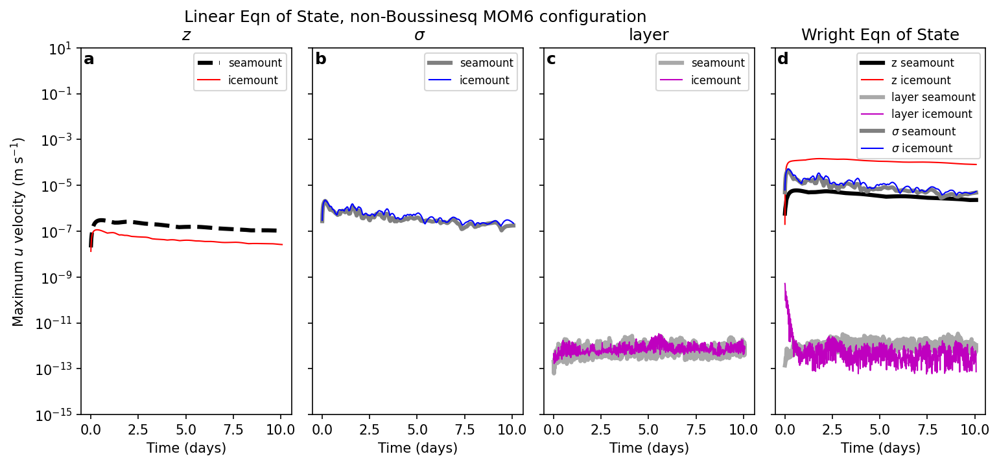

In [23]:
fig, axes = plt.subplots(ncols = 4, figsize = (12,5),dpi = 150, sharey = True)

# for label in ['seamount-layer','seamount-layer-quad','seamount-layer-exp',
#               'icemount-layer-LSPR','icemount-layer-reset-quad','icemount-layer-LSPR-exp',
#               'icemount-layer-reset-exp','icemount-layer-reset-exp-Wright','icemount-layer-reset-Wright',
#              'icemount-layer-LSPR-Wright','seamount-layer-Wright','seamount-layer-quad-Wright',
#              'icemount-z-reset-Wright','icemount-z-LSPR-Wright','seamount-z-MWIPG-Wright','seamount-z-exp-Wright']:
for i in np.arange(2):
    label = ['seamount-z-nonbouss',
              'icemount-z-reset-nonbouss'][i]
    labelplot = ['seamount','icemount'][i]
    color = ['k','r','r','r'][i]
    linestyle = ['--','-'][i]
    linewidth = [3,1][i]
    prog = open_files(label)
    axes[0].plot(np.arange(len(prog.Time))/24/4,np.abs(prog.u).max(['zl','yh','xq']), 
                 label = labelplot, color = color, linestyle = linestyle, linewidth = linewidth) 
axes[0].set_ylabel('Maximum $u$ velocity (m s$^{-1}$)')
axes[0].set_xlabel('Time (days)')
axes[0].set_yscale('log')
axes[0].legend(loc = 'upper right', fontsize = 8)

for i in np.arange(2):
    label = ['seamount-sigma-nonbouss','icemount-sigma-reset-nonbouss'][i]
    labelplot = ['seamount','icemount'][i]
    color = ['gray','b','b','b'][i]
    linestyle = ['-','-'][i]
    linewidth = [3,1,1,1][i]
    prog = open_files(label)
    axes[1].plot(np.arange(len(prog.Time))/24/4,np.abs(prog.u).max(['zl','yh','xq']), 
                 label = labelplot, color = color, linestyle = linestyle, linewidth = linewidth) 
#axes[0].set_ylabel('Max u vel (m/s)')
axes[1].set_xlabel('Time (days)')
#axes[0].set_yscale('log')
axes[1].legend(loc = 'upper right', fontsize = 8)

for i in np.arange(2):
    label = ['seamount-layer-nonbouss','icemount-layer-reset-nonbouss'][i]
    labelplot = ['seamount','icemount'][i]
    color = ['darkgrey','m','b','b'][i]
    linestyle = ['-','-'][i]
    linewidth = [3,1,1,1][i]
    prog = open_files(label)
    axes[2].plot(np.arange(len(prog.Time))/24/4,np.abs(prog.u).max(['zl','yh','xq']), 
                 label = labelplot, color = color, linestyle = linestyle, linewidth = linewidth) 
#axes[0].set_ylabel('Max u vel (m/s)')
axes[2].set_xlabel('Time (days)')
#axes[0].set_yscale('log')
axes[2].legend(loc = 'upper right', fontsize = 8)


for i in np.arange(6):
    label = ['seamount-z-nonbouss-Wright','icemount-z-reset-nonbouss-Wright',
             'seamount-layer-nonbouss-Wright','icemount-layer-reset-nonbouss-Wright',
             'seamount-sigma-nonbouss-Wright','icemount-sigma-reset-nonbouss-Wright'][i]
    labelplot = ['z seamount','z icemount',
                 'layer seamount', 'layer icemount',
                 '$\sigma$ seamount','$\sigma$ icemount'][i]
    color = ['k','r','darkgrey','m','gray','b',][i]
    linestyle = ['-','-','-','-','-','-'][i]
    linewidth = [3,1,3,1,3,1][i]
    prog = open_files(label)
    axes[3].plot(np.arange(len(prog.Time))/24/4,np.abs(prog.u).max(['zl','yh','xq']), 
                 label = labelplot, color = color, linestyle = linestyle, linewidth = linewidth) 
#axes[0].set_ylabel('Max u vel (m/s)')
axes[3].set_xlabel('Time (days)')
#axes[0].set_yscale('log')
axes[3].legend(loc = 'upper right', fontsize = 8)

fig.subplots_adjust(wspace = 0.1)

axes[0].set_ylim(1e-15,10)
axes[0].set_title('$z$')
axes[1].set_title('Linear Eqn of State, non-Boussinesq MOM6 configuration \n $\sigma$')
axes[2].set_title('layer')
axes[3].set_title('Wright Eqn of State')

# fig.suptitle('Spurious currents in linear temperature and salinity stratification tests', fontweight = 'bold',
#             x = 0.12,ha = 'left', y = 1.06)
for i in np.arange(4):
    axes[i].text(0.01,0.99,['a','b','c','d','e','f','g','h','i','j'][i], fontsize = 12, transform=axes[i].transAxes, fontweight='bold', va='top')


iceshelf3-z 3.199435934453949e-09
iceshelf3-sigma-dynsurfp 0.000458774122290058
iceshelf2-z 7.642995182536262e-10
iceshelf2-sigma 3.788409281420689e-12


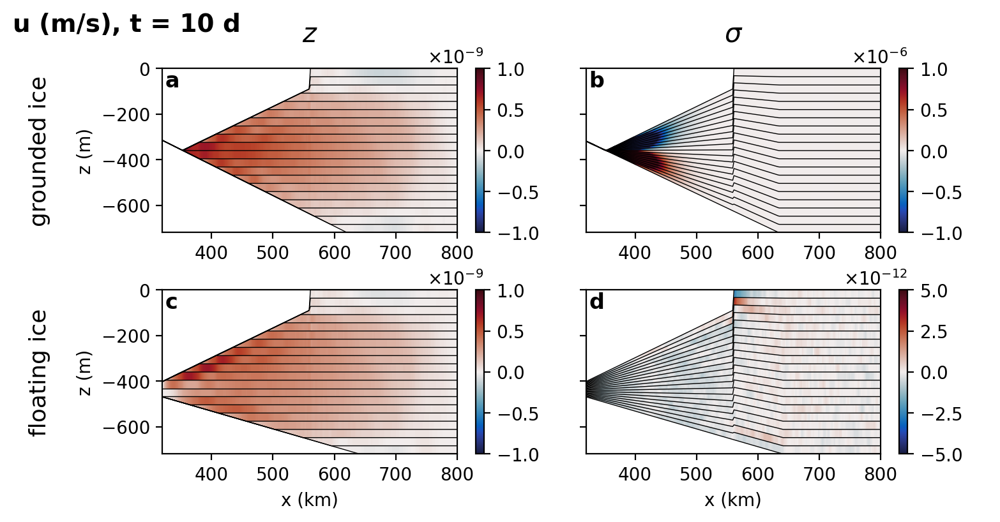

In [12]:
fig, axes = plt.subplots(ncols = 2, nrows = 2, figsize = (8,4),dpi = 200)
ax = np.ravel(axes)

for i in np.arange(4):

    label = ['iceshelf3-z','iceshelf3-sigma-dynsurfp','iceshelf2-z','iceshelf2-sigma'][i]
    loc = [0,1,2,3][i]
    vmax = [1e-9,1e-6,
            1e-9,5e-12,1e-11][i]
    
    a = ax[loc]

    prog = open_files(label)
    x = 0
    ymax = 720

    plot(a,x,-1,prog.u,"uo",-vmax,vmax,cm.cm.balance,ymax)

    a.set_title('')
    if loc < 2:
        a.set_xlabel('')
    if (loc ==0):
        a.set_ylabel('z (m)')
        a.text(120,-360,'grounded ice',
               ha = 'center', va = 'center',rotation = 90, fontsize = 13)
    elif (loc==2):
        a.set_ylabel('z (m)')
        a.text(120,-360,'floating ice',
               ha = 'center', va = 'center',rotation = 90, fontsize = 13)
        
    else:
        a.set_ylabel('')
        a.set_yticklabels('')
        
    if loc < 2:
        a.set_title(['$z$','$\sigma$'][loc], 
                    y = 1.1, fontsize = 15)
    a.text(0.01,0.99,['a','b','c','d','e','f','g','h','i','j'][i], fontsize = 12, transform=a.transAxes, fontweight='bold', va='top')
    print(label, np.abs(prog.u).max().values)
    
#ax[0].set_axis_off()

fig.subplots_adjust(wspace = 0.15,hspace = 0.35)
fig.suptitle('u (m/s), t = 10 d', fontsize = 14, y = 0.99, x = 0.09,weight = 'bold')



plt.show()


iceshelf3-z 3.199435934453949e-09
iceshelf3-sigma 0.00045849598825079045
iceshelf2-z 7.642995182536262e-10
iceshelf2-sigma 3.788409281420689e-12


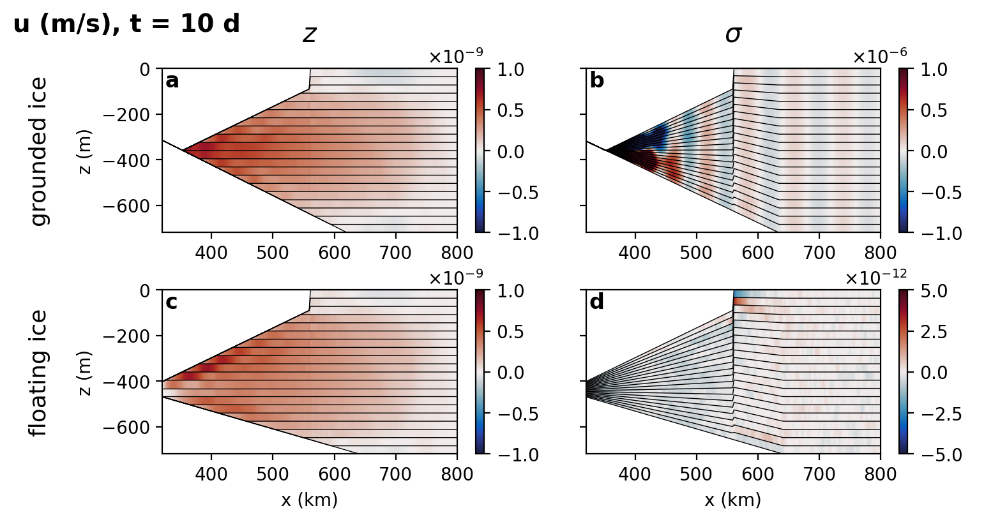

In [6]:
fig, axes = plt.subplots(ncols = 2, nrows = 2, figsize = (8,4),dpi = 200)
ax = np.ravel(axes)

for i in np.arange(4):

    label = ['iceshelf3-z','iceshelf3-sigma','iceshelf2-z','iceshelf2-sigma'][i]
    loc = [0,1,2,3][i]
    vmax = [1e-9,1e-6,
            1e-9,5e-12,1e-11][i]
    
    a = ax[loc]

    prog = open_files(label)
    x = 0
    ymax = 720

    plot(a,x,-1,prog.u,"uo",-vmax,vmax,cm.cm.balance,ymax)

    a.set_title('')
    if loc < 2:
        a.set_xlabel('')
    if (loc ==0):
        a.set_ylabel('z (m)')
        a.text(120,-360,'grounded ice',
               ha = 'center', va = 'center',rotation = 90, fontsize = 13)
    elif (loc==2):
        a.set_ylabel('z (m)')
        a.text(120,-360,'floating ice',
               ha = 'center', va = 'center',rotation = 90, fontsize = 13)
        
    else:
        a.set_ylabel('')
        a.set_yticklabels('')
        
    if loc < 2:
        a.set_title(['$z$','$\sigma$'][loc], 
                    y = 1.1, fontsize = 15)
    a.text(0.01,0.99,['a','b','c','d','e','f','g','h','i','j'][i], fontsize = 12, transform=a.transAxes, fontweight='bold', va='top')
    print(label, np.abs(prog.u).max().values)

    
#ax[0].set_axis_off()

fig.subplots_adjust(wspace = 0.15,hspace = 0.35)
fig.suptitle('u (m/s), t = 10 d', fontsize = 14, y = 0.99, x = 0.09,weight = 'bold')



plt.show()


/Users/claireyung/opt/anaconda3/lib/python3.9/site-packages/xarray/coding/times.py:699: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)


11
11
10
10
10
10
10
10
10
10
10
10
10
10
10
10
9
9
9
9
9
9
9
9
9
9
9
9
9
9
8
8
8
8
8
8
8
8
8
8
8
8
8
8
7
7
7
7
7
7
7
7
7
7
7
7
7
6
6
6
6
6
6
6
6
6
6
6
6
6
6
5
5
5
5
5
5
5
5
5
5
5
5
5
5
4
4
4
4
4
4
4
4
4
4
4
4
4
4
3
3
3
3
3
3
3
3
3
3
3
3
3
2
2
2
2
2
2
2
2


/Users/claireyung/opt/anaconda3/lib/python3.9/site-packages/xarray/coding/times.py:699: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)


2


/Users/claireyung/opt/anaconda3/lib/python3.9/site-packages/xarray/coding/times.py:699: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)


9
9
9
9
9
9
9
9
9
9
9
9
9
8
8
8
8
8
8
8
8
8
8
8
8
8
8
7
7
7
7
7
7
7
7
7
7
7
7
7
6
6
6
6
6
6
6
6
6
6
6
6
6
6
5
5
5
5
5
5
5
5
5
5
5
5
5
5
4
4
4
4
4
4
4
4
4
4
4
4
4
4
3
3
3
3
3
3
3
3
3
3
3
3
3
2
2
2
2
2
2
2
2


/Users/claireyung/opt/anaconda3/lib/python3.9/site-packages/xarray/coding/times.py:699: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)


5
3
2
2
1
1
1
1
1
2


/Users/claireyung/opt/anaconda3/lib/python3.9/site-packages/xarray/coding/times.py:699: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)


21
20
19
19
19
18
18
18
17
17
17
16
16
16
15
15
15
14
14
14
13
13
13
12
12
12
12
11
11
11
10
10
10
10
9
9
9
9
9
8
8
8
8
8
8
8
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
5
4
3
2
1


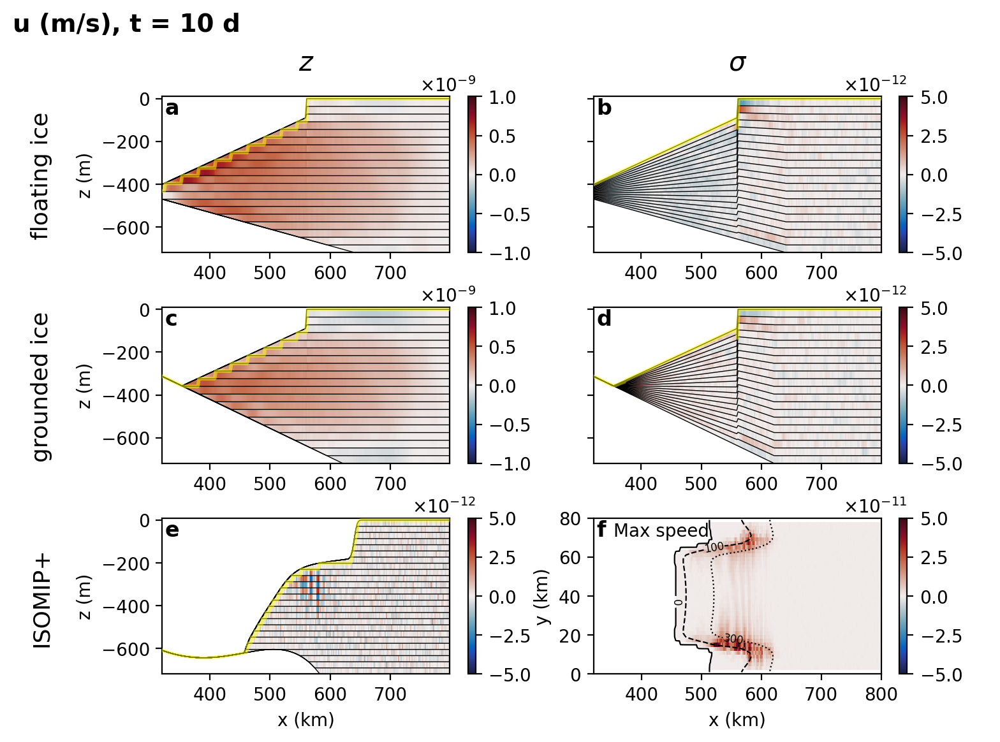

In [35]:
fig, axes = plt.subplots(ncols = 2, nrows = 3, figsize = (8,6),dpi = 200)
ax = np.ravel(axes)

for i in np.arange(4):

    label = ['iceshelf2-z','iceshelf2-sigma','iceshelf-z','iceshelf-sigma',][i]
    loc = [0,1,2,3][i]
    vmax = [1e-9,5e-12,
            1e-9,5e-12,1e-11][i]
    
    a = ax[loc]

    prog = open_files(label)
    x = 0
    ymax = 720

    plot_u(a,x,-1,prog.u,"uo",-vmax,vmax,cm.cm.balance,ymax, ymin = 10)

    a.set_title('')
    if loc < 4:
        a.set_xlabel('')
    if (loc ==0):
        a.set_ylabel('z (m)')
        a.text(120,-360,'floating ice',
               ha = 'center', va = 'center',rotation = 90, fontsize = 13)
    elif (loc==2):
        a.set_ylabel('z (m)')
        a.text(120,-360,'grounded ice',
               ha = 'center', va = 'center',rotation = 90, fontsize = 13)
        
    else:
        a.set_ylabel('')
        a.set_yticklabels('')
        
    if loc < 2:
        a.set_title(['$z$','$\sigma$'][loc], 
                    y = 1.1, fontsize = 15)
    a.text(0.01,0.99,['a','b','c','d','e','f','g','h','i','j'][i], fontsize = 12, transform=a.transAxes, fontweight='bold', va='top')

i = 4
vmax = 5e-12
a = ax[i]
prog = xr.open_dataset('/Users/claireyung/mom6/MOM6-examples/ocean_only/ISOMIP/layer-MOM6-examples/prog__0001_002.nc')
ocean_geometry = xr.open_dataset('/Users/claireyung/mom6/MOM6-examples/ocean_only/ISOMIP/layer-MOM6-examples/ocean_geometry.nc')
mom = xr.open_dataset('/Users/claireyung/mom6/MOM6-examples/ocean_only/ISOMIP/layer-MOM6-examples/mom__0001_001.nc')
x = 20
ymax = 720

plot_u_ISOMIP(a,x,-1,prog.u,"uo",-vmax,vmax,cm.cm.balance,ymax)

a.set_title('')
a.set_xlabel('x (km)')
a.set_ylabel('z (m)')
a.text(120,-360,'ISOMIP+',
           ha = 'center', va = 'center',rotation = 90, fontsize = 13)
a.text(0.01,0.99,['a','b','c','d','e','f','g','h','i','j'][i], fontsize = 12, transform=a.transAxes, fontweight='bold', va='top')

i = 5
vmax = 5e-11
a = ax[i]
u_interp = 0.5*(prog.u.isel(Time = -1).values[:,:,:-1]+prog.u.isel(Time = -1).values[:,:,1:])
v_interp = 0.5*(prog.v.isel(Time = -1).values[:,:-1,:]+prog.v.isel(Time = -1).values[:,1:,:])

speed = (np.sqrt(u_interp**2+v_interp**2))
max_speed = np.max(speed,0)
max_speed = np.where(max_speed > 1e-15, max_speed, np.nan)

sum_h = prog.h.isel(Time = 0).sum('zl')
CS1 = a.contour(prog.xh.values, prog.yh.values,sum_h.values,levels = [0.5,100,300],colors = 'k', linewidths =0.8, linestyles = ['-','--','dotted'])
plt.clabel(CS1, CS1.levels, inline=True, fontsize=6,fmt ='%1.0f')
c = a.pcolormesh(prog.xq.values, prog.yq.values,max_speed,vmax = vmax, vmin = -vmax, cmap = cm.cm.balance)
cbar = plt.colorbar(c, ax = a, label = " ")
cbar.set_ticks([-5e-11,-2.5e-11,0,2.5e-11,5e-11])
cbar.formatter.set_powerlimits((0, 0))
cbar.formatter.set_useMathText(True)
cbar.ax.yaxis.set_offset_position('right')
cbar.update_ticks()
a.set_title('')
a.set_xlabel('x (km)')
a.set_ylabel('y (km)')
a.text(0.01,0.99,['a','b','c','d','e','f','g','h','i','j'][i], fontsize = 12, transform=a.transAxes, fontweight='bold', va='top')
a.text(0.07,0.97,'Max speed', fontsize = 10, transform=a.transAxes, va='top')

    
# #ax[0].set_axis_off()

fig.subplots_adjust(wspace = 0.2,hspace = 0.35)
fig.suptitle('u (m/s), t = 10 d', fontsize = 14, y = 0.99, x = 0.09,weight = 'bold')



plt.show()


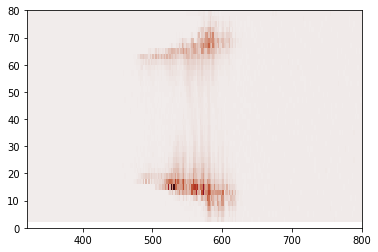

In [32]:
# i = 5
# vmax = 5e-12
# a = ax[i]
grid = Grid(prog,coords={"x":{"center":"xh","outer":"xq"},
                             "y":{"center":"yh","outer":"yq"},
                             "z":{"center":"zl","outer":"zi"}},periodic=False)
speed = (np.sqrt(prog.u.isel(Time = -1).values[:,:,:-1]**2+prog.v.isel(Time = -1).values[:,:-1,:]**2))
plt.pcolormesh(prog.xq.values, prog.yq.values,np.max(speed,0),vmax = vmax, vmin = -vmax, cmap = cm.cm.balance)

# a.set_title('')
# a.set_xlabel('x (km)')
# a.set_ylabel('')
# a.text(0.01,0.99,['a','b','c','d','e','f','g','h','i','j'][i], fontsize = 12, transform=a.transAxes, fontweight='bold', va='top')
# a.text(0.05,0.99,'Max speed', fontsize = 12, transform=a.transAxes, va='top')

    
# #ax[0].set_axis_off()


In [28]:
max_speed

array([[0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ..., 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00],
       [0.0000000e+00, 2.8508825e-22, 3.7806408e-22, ..., 1.1086598e-12,
        1.0385205e-12, 9.8681078e-13],
       [0.0000000e+00, 3.7057691e-22, 4.4607663e-22, ..., 1.1688927e-12,
        8.4448637e-13, 1.2864142e-12],
       ...,
       [0.0000000e+00, 5.7628791e-22, 6.2638933e-22, ..., 1.0388707e-12,
        1.0326563e-12, 1.0259922e-12],
       [0.0000000e+00, 3.7057691e-22, 4.4607663e-22, ..., 9.0753566e-13,
        1.2526305e-12, 1.1782422e-12],
       [0.0000000e+00, 2.8508825e-22, 3.7806408e-22, ..., 1.0312600e-12,
        1.0563433e-12, 1.3164327e-12]], dtype=float32)

In [12]:
speed.shape

(25, 40, 240)

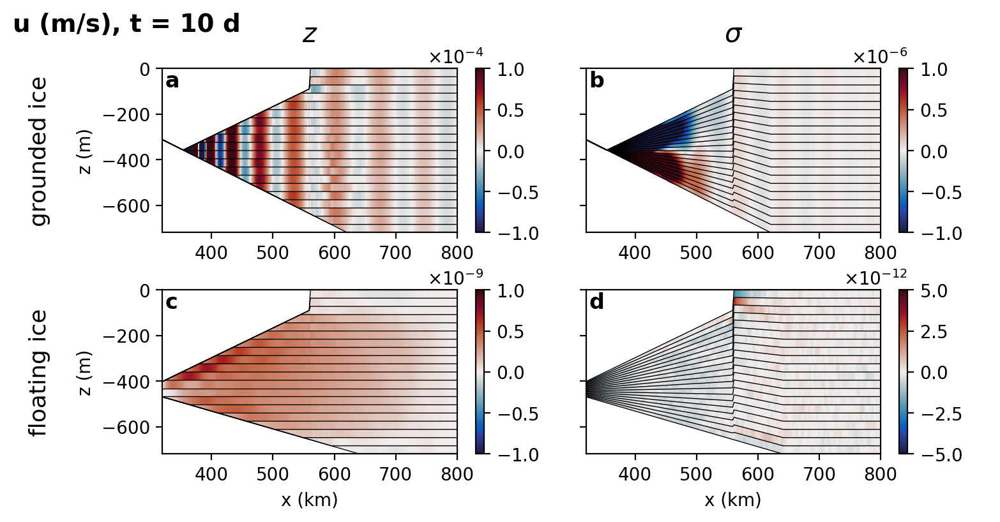

In [38]:
fig, axes = plt.subplots(ncols = 2, nrows = 2, figsize = (8,4),dpi = 200)
ax = np.ravel(axes)

for i in np.arange(4):

    label = ['iceshelf-z','iceshelf-sigma','iceshelf2-z','iceshelf2-sigma'][i]
    loc = [0,1,2,3][i]
    vmax = [1e-4,1e-6,
            1e-9,5e-12,1e-11][i]
    
    a = ax[loc]

    prog = open_files(label)
    x = 0
    ymax = 720

    plot(a,x,-1,prog.u,"uo",-vmax,vmax,cm.cm.balance,ymax)

    a.set_title('')
    if loc < 2:
        a.set_xlabel('')
    if (loc ==0):
        a.set_ylabel('z (m)')
        a.text(120,-360,'grounded ice',
               ha = 'center', va = 'center',rotation = 90, fontsize = 13)
    elif (loc==2):
        a.set_ylabel('z (m)')
        a.text(120,-360,'floating ice',
               ha = 'center', va = 'center',rotation = 90, fontsize = 13)
        
    else:
        a.set_ylabel('')
        a.set_yticklabels('')
        
    if loc < 2:
        a.set_title(['$z$','$\sigma$'][loc], 
                    y = 1.1, fontsize = 15)
    a.text(0.01,0.99,['a','b','c','d','e','f','g','h','i','j'][i], fontsize = 12, transform=a.transAxes, fontweight='bold', va='top')

    
#ax[0].set_axis_off()

fig.subplots_adjust(wspace = 0.15,hspace = 0.35)
fig.suptitle('u (m/s), t = 10 d', fontsize = 14, y = 0.99, x = 0.09,weight = 'bold')



plt.show()


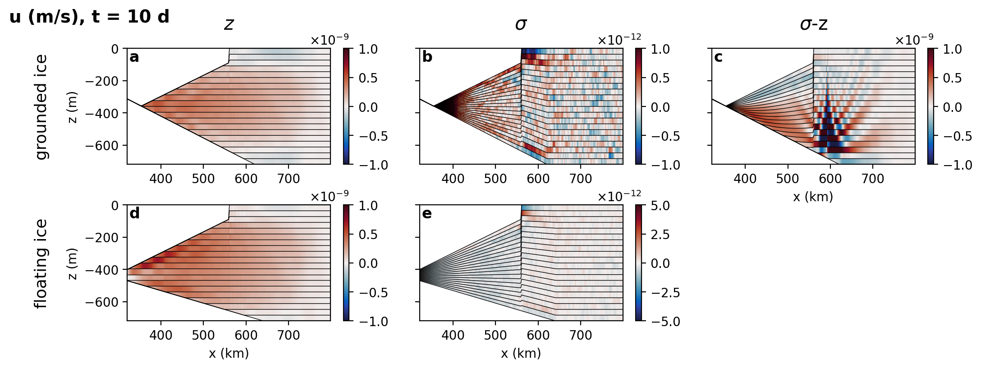

In [12]:
fig, axes = plt.subplots(ncols = 3, nrows = 2, figsize = (12,4),dpi = 200)
ax = np.ravel(axes)

for i in np.arange(5):

    label = ['iceshelf-z','iceshelf-sigma','iceshelf-sigmazstar',
             'iceshelf2-z','iceshelf2-sigma'][i]
    loc = [0,1,2,3,4][i]
    vmax = [1e-9,1e-12,1e-9,
            1e-9,5e-12,1e-11][i]
    
    a = ax[loc]

    prog = open_files(label)
    x = 0
    ymax = 720

    plot_u(a,x,-1,prog.u,"uo",-vmax,vmax,cm.cm.balance,ymax)

    a.set_title('')
    if loc < 2:
        a.set_xlabel('')
    if (loc ==0):
        a.set_ylabel('z (m)')
        a.text(120,-360,'grounded ice',
               ha = 'center', va = 'center',rotation = 90, fontsize = 13)
    elif (loc==3):
        a.set_ylabel('z (m)')
        a.text(120,-360,'floating ice',
               ha = 'center', va = 'center',rotation = 90, fontsize = 13)
        
    else:
        a.set_ylabel('')
        a.set_yticklabels('')
        
    if loc < 3:
        a.set_title(['$z$','$\sigma$','$\sigma$-z'][loc], 
                    y = 1.1, fontsize = 15)
    a.text(0.01,0.99,['a','b','c','d','e','f','g','h','i','j'][i], fontsize = 12, transform=a.transAxes, fontweight='bold', va='top')

    
ax[5].set_axis_off()

fig.subplots_adjust(wspace = 0.15,hspace = 0.35)
fig.suptitle('u (m/s), t = 10 d', fontsize = 14, y = 0.99, x = 0.09,weight = 'bold')



plt.show()


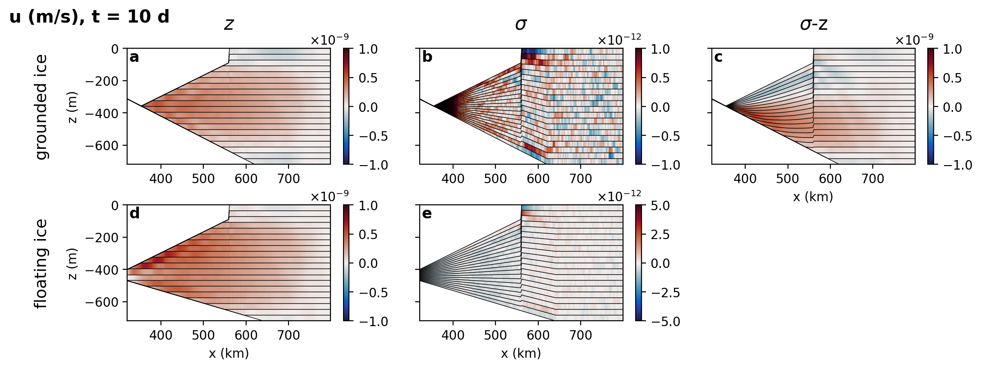

In [20]:
fig, axes = plt.subplots(ncols = 3, nrows = 2, figsize = (12,4),dpi = 200)
ax = np.ravel(axes)

for i in np.arange(5):

    label = ['iceshelf-z','iceshelf-sigma','iceshelf-sigmazstar',
             'iceshelf2-z','iceshelf2-sigma'][i]
    loc = [0,1,2,3,4][i]
    vmax = [1e-9,1e-12,1e-9,
            1e-9,5e-12,1e-11][i]
    
    a = ax[loc]

    prog = open_files(label)
    x = 0
    ymax = 720

    plot_u(a,x,-1,prog.u,"uo",-vmax,vmax,cm.cm.balance,ymax)

    a.set_title('')
    if loc < 2:
        a.set_xlabel('')
    if (loc ==0):
        a.set_ylabel('z (m)')
        a.text(120,-360,'grounded ice',
               ha = 'center', va = 'center',rotation = 90, fontsize = 13)
    elif (loc==3):
        a.set_ylabel('z (m)')
        a.text(120,-360,'floating ice',
               ha = 'center', va = 'center',rotation = 90, fontsize = 13)
        
    else:
        a.set_ylabel('')
        a.set_yticklabels('')
        
    if loc < 3:
        a.set_title(['$z$','$\sigma$','$\sigma$-z'][loc], 
                    y = 1.1, fontsize = 15)
    a.text(0.01,0.99,['a','b','c','d','e','f','g','h','i','j'][i], fontsize = 12, transform=a.transAxes, fontweight='bold', va='top')

    
ax[5].set_axis_off()

fig.subplots_adjust(wspace = 0.15,hspace = 0.35)
fig.suptitle('u (m/s), t = 10 d', fontsize = 14, y = 0.99, x = 0.09,weight = 'bold')



plt.show()


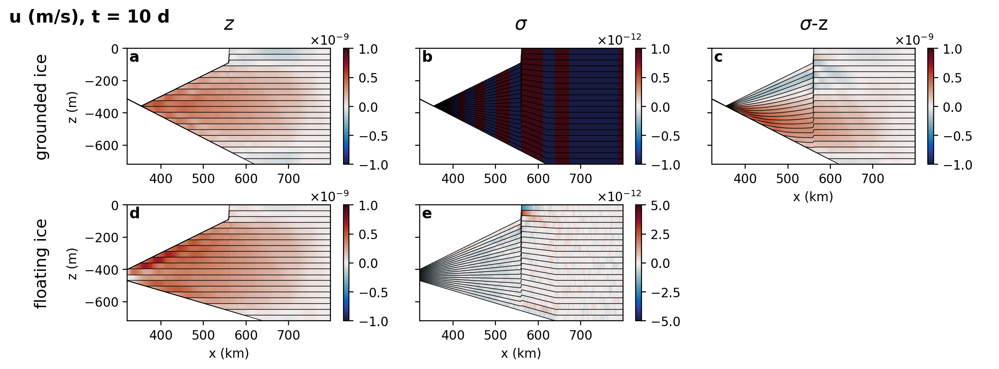

In [8]:
fig, axes = plt.subplots(ncols = 3, nrows = 2, figsize = (12,4),dpi = 200)
ax = np.ravel(axes)

for i in np.arange(5):

    label = ['iceshelf-z','iceshelf-sigma','iceshelf-sigmazstar',
             'iceshelf2-z','iceshelf2-sigma'][i]
    loc = [0,1,2,3,4][i]
    vmax = [1e-9,1e-12,1e-9,
            1e-9,5e-12,1e-11][i]
    
    a = ax[loc]

    prog = open_files(label)
    x = 0
    ymax = 720

    plot_u(a,x,-1,prog.u,"uo",-vmax,vmax,cm.cm.balance,ymax)

    a.set_title('')
    if loc < 2:
        a.set_xlabel('')
    if (loc ==0):
        a.set_ylabel('z (m)')
        a.text(120,-360,'grounded ice',
               ha = 'center', va = 'center',rotation = 90, fontsize = 13)
    elif (loc==3):
        a.set_ylabel('z (m)')
        a.text(120,-360,'floating ice',
               ha = 'center', va = 'center',rotation = 90, fontsize = 13)
        
    else:
        a.set_ylabel('')
        a.set_yticklabels('')
        
    if loc < 3:
        a.set_title(['$z$','$\sigma$','$\sigma$-z'][loc], 
                    y = 1.1, fontsize = 15)
    a.text(0.01,0.99,['a','b','c','d','e','f','g','h','i','j'][i], fontsize = 12, transform=a.transAxes, fontweight='bold', va='top')

    
ax[5].set_axis_off()

fig.subplots_adjust(wspace = 0.15,hspace = 0.35)
fig.suptitle('u (m/s), t = 10 d', fontsize = 14, y = 0.99, x = 0.09,weight = 'bold')



plt.show()


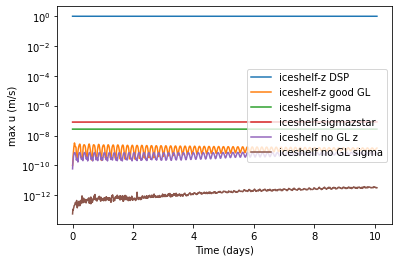

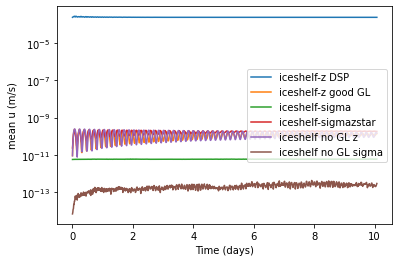

In [14]:
for i in np.arange(6):
    label = ['iceshelf-z','iceshelf3-z','iceshelf-sigma','iceshelf-sigmazstar',
             'iceshelf2-z','iceshelf2-sigma'][i]
    labelplot = ['iceshelf-z DSP','iceshelf-z good GL','iceshelf-sigma','iceshelf-sigmazstar',
             'iceshelf no GL z','iceshelf no GL sigma'][i]
    prog = open_files(label)
    plt.plot(np.arange(len(prog.Time))/24/4,np.abs(prog.u).max(['zl','yh','xq']), 
                 label = labelplot)#, color = color, linestyle = linestyle, linewidth = linewidth) 
plt.xlabel('Time (days)')
plt.legend(loc = 'center right', fontsize = 10)
plt.ylabel('max u (m/s)')
plt.yscale('log')
plt.show()

for i in np.arange(6):
    label = ['iceshelf-z','iceshelf3-z','iceshelf-sigma','iceshelf-sigmazstar',
             'iceshelf2-z','iceshelf2-sigma'][i]
    labelplot = ['iceshelf-z DSP','iceshelf-z good GL','iceshelf-sigma','iceshelf-sigmazstar',
             'iceshelf no GL z','iceshelf no GL sigma'][i]
    prog = open_files(label)
    plt.plot(np.arange(len(prog.Time))/24/4,np.abs(prog.u).mean(['zl','yh','xq']), 
                 label = labelplot)#, color = color, linestyle = linestyle, linewidth = linewidth) 
plt.xlabel('Time (days)')
plt.legend(loc = 'center right', fontsize = 10)
plt.ylabel('mean u (m/s)')
plt.yscale('log')
plt.show()


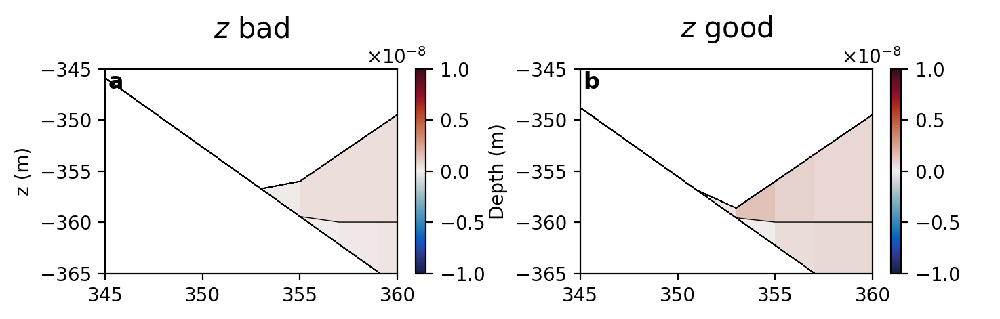

In [6]:
fig, axes = plt.subplots(ncols = 2, nrows = 1, figsize = (8,2),dpi = 200)
ax = np.ravel(axes)

for i in np.arange(2):

    label = ['iceshelf-z','iceshelf3-z'][i]
    loc = [0,1,2,3][i]
    vmax = [1e-8,1e-8,
            1e-9,5e-12,1e-11][i]
    
    a = ax[loc]

    prog = open_files(label)
    x = 0
    ymax = 720

    plot_u(a,x,-1,prog.u,"uo",-vmax,vmax,cm.cm.balance,ymax)

    a.set_title('')
    if loc < 2:
        a.set_xlabel('')
        if (loc ==0):
            a.set_ylabel('z (m)')
#         a.text(120,-360,'grounded ice',
#                ha = 'center', va = 'center',rotation = 90, fontsize = 13)
#     elif (loc==2):
#         a.set_ylabel('z (m)')
#         a.text(120,-360,'floating ice',
#                ha = 'center', va = 'center',rotation = 90, fontsize = 13)
        
    else:
        a.set_ylabel('')
        a.set_yticklabels('')
        
    if loc < 2:
        a.set_title(['$z$ bad','$z$ good'][loc], 
                    y = 1.1, fontsize = 15)
    a.text(0.01,0.99,['a','b','c','d','e','f','g','h','i','j'][i], fontsize = 12, transform=a.transAxes, fontweight='bold', va='top')
    a.set_ylim(-365,-345)
    a.set_xlim(345,360)
    
#ax[0].set_axis_off()

fig.subplots_adjust(wspace = 0.3,hspace = 0.35)
#fig.suptitle('u (m/s), t = 10 d', fontsize = 14, y = 0.99, x = 0.09,weight = 'bold')



plt.show()


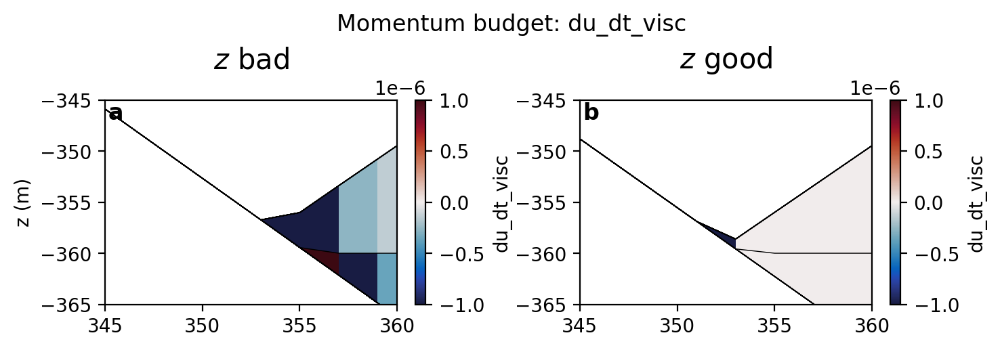

In [58]:
fig, axes = plt.subplots(ncols = 2, nrows = 1, figsize = (8,2),dpi = 200)
ax = np.ravel(axes)

for i in np.arange(2):

    label = ['iceshelf-z','iceshelf3-z'][i]
    loc = [0,1,2,3][i]
    vmax = [1e-6,1e-6,
            1e-9,5e-12,1e-11][i]
    
    a = ax[loc]

    prog = open_files(label)
    mom = open_mom(label)
    x = 0
    ymax = 720
    time = 0
    plot_u(a,x,time,mom.du_dt_visc,"du_dt_visc",-vmax,vmax,cm.cm.balance,ymax)

    a.set_title('')
    if loc < 2:
        a.set_xlabel('')
        if (loc ==0):
            a.set_ylabel('z (m)')
        else:
            a.set_ylabel('')
#         a.text(120,-360,'grounded ice',
#                ha = 'center', va = 'center',rotation = 90, fontsize = 13)
#     elif (loc==2):
#         a.set_ylabel('z (m)')
#         a.text(120,-360,'floating ice',
#                ha = 'center', va = 'center',rotation = 90, fontsize = 13)
        
    else:
        a.set_ylabel('')
        a.set_yticklabels('')
        
    if loc < 2:
        a.set_title(['$z$ bad','$z$ good'][loc], 
                    y = 1.1, fontsize = 15)
    a.text(0.01,0.99,['a','b','c','d','e','f','g','h','i','j'][i], fontsize = 12, transform=a.transAxes, fontweight='bold', va='top')
    a.set_ylim(-365,-345)
    a.set_xlim(345,360)
    
#ax[0].set_axis_off()

fig.subplots_adjust(wspace = 0.3,hspace = 0.35)
#fig.suptitle('u (m/s), t = 10 d', fontsize = 14, y = 0.99, x = 0.09,weight = 'bold')

fig.suptitle('Momentum budget: du_dt_visc', y = 1.2)


plt.show()


In [9]:
def open_mom(label):
    base = basee 
    prog = xr.open_dataset(base + label+'/mom.nc')
    return prog

def open_visc(label):
    base = basee 
    prog = xr.open_dataset(base + label+'/visc.nc')
    return prog


/Users/claireyung/opt/anaconda3/lib/python3.9/site-packages/xarray/coding/times.py:699: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/Users/claireyung/opt/anaconda3/lib/python3.9/site-packages/xarray/coding/times.py:699: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)


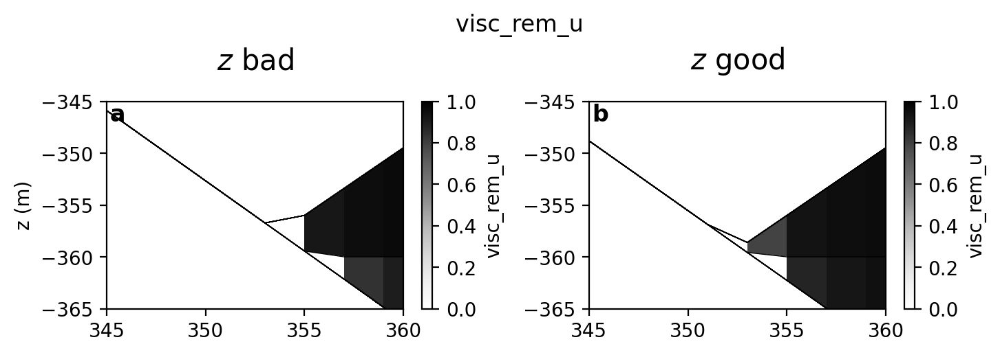

In [7]:
fig, axes = plt.subplots(ncols = 2, nrows = 1, figsize = (8,2),dpi = 200)
ax = np.ravel(axes)

for i in np.arange(2):

    label = ['iceshelf-z','iceshelf3-z'][i]
    loc = [0,1,2,3][i]
    vmax = [1e-6,1e-6,
            1e-9,5e-12,1e-11][i]
    
    a = ax[loc]

    prog = open_files(label)
    mom = open_mom(label)
    visc = open_visc(label)
    x = 0
    ymax = 720
    time = 0
    plot_u(a,x,time,visc.visc_rem_u,"visc_rem_u",0,1,'Greys',ymax)

    a.set_title('')
    if loc < 2:
        a.set_xlabel('')
        if (loc ==0):
            a.set_ylabel('z (m)')
        else:
            a.set_ylabel('')
#         a.text(120,-360,'grounded ice',
#                ha = 'center', va = 'center',rotation = 90, fontsize = 13)
#     elif (loc==2):
#         a.set_ylabel('z (m)')
#         a.text(120,-360,'floating ice',
#                ha = 'center', va = 'center',rotation = 90, fontsize = 13)
        
    else:
        a.set_ylabel('')
        a.set_yticklabels('')
        
    if loc < 2:
        a.set_title(['$z$ bad','$z$ good'][loc], 
                    y = 1.1, fontsize = 15)
    a.text(0.01,0.99,['a','b','c','d','e','f','g','h','i','j'][i], fontsize = 12, transform=a.transAxes, fontweight='bold', va='top')
    a.set_ylim(-365,-345)
    a.set_xlim(345,360)
    
#ax[0].set_axis_off()

fig.subplots_adjust(wspace = 0.3,hspace = 0.35)
#fig.suptitle('u (m/s), t = 10 d', fontsize = 14, y = 0.99, x = 0.09,weight = 'bold')

fig.suptitle('visc_rem_u', y = 1.2)


plt.show()


iceshelf-sigma 2.700804041538286e-08
iceshelf-sigmazstar 8.229043516352375e-08


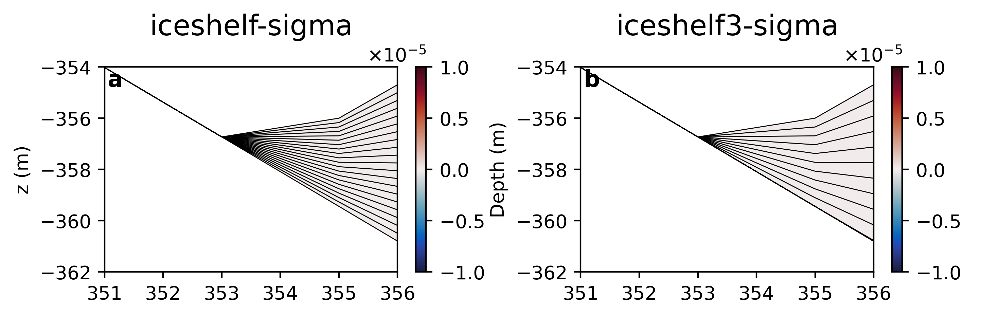

In [44]:
fig, axes = plt.subplots(ncols = 2, nrows = 1, figsize = (8,2),dpi = 400)
ax = np.ravel(axes)

for i in np.arange(2):

    label = ['iceshelf-sigma','iceshelf-sigmazstar'][i]
    loc = [0,1,2,3][i]
    vmax = [1e-5,1e-5,
            1e-9,5e-12,1e-11][i]
    
    a = ax[loc]

    prog = open_files(label)
    x = 0
    ymax = 720

    plot_u(a,x,-1,prog.u,"uo",-vmax,vmax,cm.cm.balance,ymax)
    print(label,prog.u.isel(Time = -1).max().values)

    a.set_title('')
    if loc < 2:
        a.set_xlabel('')
        if (loc ==0):
            a.set_ylabel('z (m)')
#         a.text(120,-360,'grounded ice',
#                ha = 'center', va = 'center',rotation = 90, fontsize = 13)
#     elif (loc==2):
#         a.set_ylabel('z (m)')
#         a.text(120,-360,'floating ice',
#                ha = 'center', va = 'center',rotation = 90, fontsize = 13)
        
    else:
        a.set_ylabel('')
        a.set_yticklabels('')
        
    if loc < 2:
        a.set_title(['iceshelf-sigma','iceshelf3-sigma'][loc], 
                    y = 1.1, fontsize = 15)
    a.text(0.01,0.99,['a','b','c','d','e','f','g','h','i','j'][i], fontsize = 12, transform=a.transAxes, fontweight='bold', va='top')
    a.set_ylim(-362,-354)
    a.set_xlim(351,356)
    
#ax[0].set_axis_off()

fig.subplots_adjust(wspace = 0.3,hspace = 0.35)
#fig.suptitle('u (m/s), t = 10 d', fontsize = 14, y = 0.99, x = 0.09,weight = 'bold')



plt.show()


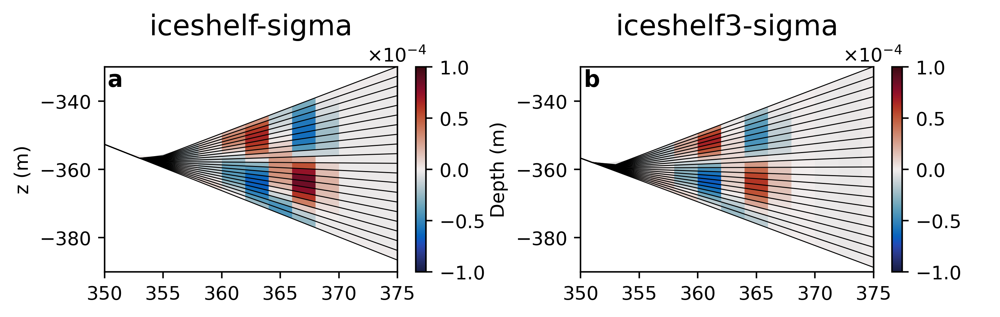

In [5]:
fig, axes = plt.subplots(ncols = 2, nrows = 1, figsize = (8,2),dpi = 400)
ax = np.ravel(axes)

for i in np.arange(2):

    label = ['iceshelf-sigma','iceshelf3-sigma'][i]
    loc = [0,1,2,3][i]
    vmax = [1e-4,1e-4,
            1e-9,5e-12,1e-11][i]
    
    a = ax[loc]

    prog = open_files(label)
    x = 0
    ymax = 720

    plot(a,x,0,prog.u,"uo",-vmax,vmax,cm.cm.balance,ymax)

    a.set_title('')
    if loc < 2:
        a.set_xlabel('')
        if (loc ==0):
            a.set_ylabel('z (m)')
#         a.text(120,-360,'grounded ice',
#                ha = 'center', va = 'center',rotation = 90, fontsize = 13)
#     elif (loc==2):
#         a.set_ylabel('z (m)')
#         a.text(120,-360,'floating ice',
#                ha = 'center', va = 'center',rotation = 90, fontsize = 13)
        
    else:
        a.set_ylabel('')
        a.set_yticklabels('')
        
    if loc < 2:
        a.set_title(['iceshelf-sigma','iceshelf3-sigma'][loc], 
                    y = 1.1, fontsize = 15)
    a.text(0.01,0.99,['a','b','c','d','e','f','g','h','i','j'][i], fontsize = 12, transform=a.transAxes, fontweight='bold', va='top')
    a.set_ylim(-390,-330)
    a.set_xlim(350,375)

#ax[0].set_axis_off()

fig.subplots_adjust(wspace = 0.3,hspace = 0.35)
#fig.suptitle('u (m/s), t = 10 d', fontsize = 14, y = 0.99, x = 0.09,weight = 'bold')



plt.show()


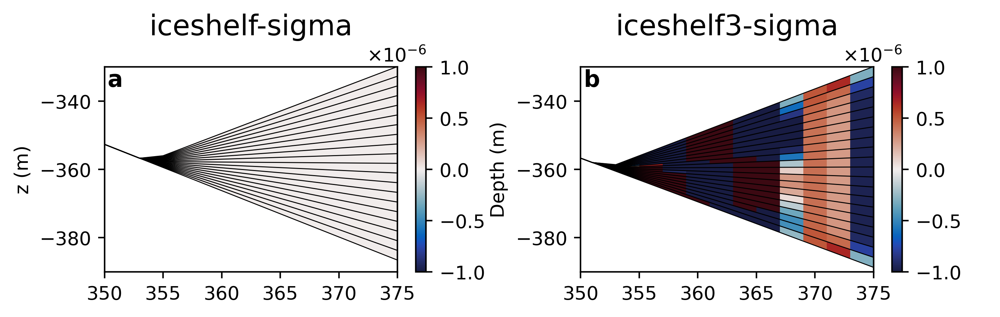

In [38]:
fig, axes = plt.subplots(ncols = 2, nrows = 1, figsize = (8,2),dpi = 400)
ax = np.ravel(axes)

for i in np.arange(2):

    label = ['iceshelf-sigma','iceshelf3-sigma'][i]
    loc = [0,1,2,3][i]
    vmax = [1e-6,1e-6,
            1e-9,5e-12,1e-11][i]
    
    a = ax[loc]

    prog = open_files(label)
    x = 0
    ymax = 720

    plot_u(a,x,1,prog.u,"uo",-vmax,vmax,cm.cm.balance,ymax)

    a.set_title('')
    if loc < 2:
        a.set_xlabel('')
        if (loc ==0):
            a.set_ylabel('z (m)')
#         a.text(120,-360,'grounded ice',
#                ha = 'center', va = 'center',rotation = 90, fontsize = 13)
#     elif (loc==2):
#         a.set_ylabel('z (m)')
#         a.text(120,-360,'floating ice',
#                ha = 'center', va = 'center',rotation = 90, fontsize = 13)
        
    else:
        a.set_ylabel('')
        a.set_yticklabels('')
        
    if loc < 2:
        a.set_title(['iceshelf-sigma','iceshelf3-sigma'][loc], 
                    y = 1.1, fontsize = 15)
    a.text(0.01,0.99,['a','b','c','d','e','f','g','h','i','j'][i], fontsize = 12, transform=a.transAxes, fontweight='bold', va='top')
    a.set_ylim(-390,-330)
    a.set_xlim(350,375)

#ax[0].set_axis_off()

fig.subplots_adjust(wspace = 0.3,hspace = 0.35)
#fig.suptitle('u (m/s), t = 10 d', fontsize = 14, y = 0.99, x = 0.09,weight = 'bold')



plt.show()


Text(0, 0.5, '')

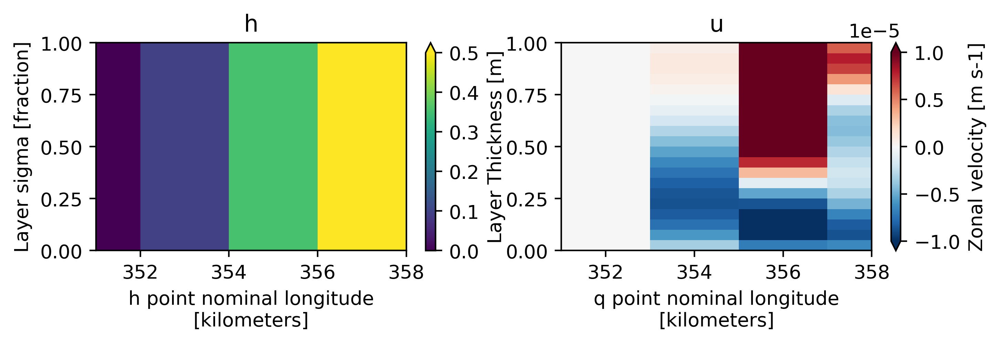

In [60]:
fig, axes = plt.subplots(ncols = 2, nrows = 1, figsize = (8,2),dpi = 400)
ax = np.ravel(axes)


label = 'iceshelf3-sigma'
prog = open_files(label)

prog.h.isel(Time = -1, yh = 0).plot(ax = ax[0],vmax = 0.5,vmin = 0)
ax[0].set_xlim(351,358)
ax[0].set_title('h')

prog.u.isel(Time = -1, yh = 0).plot(ax = ax[1], vmax = 1e-5, vmin = -1e-5, cmap = 'RdBu_r')
ax[1].set_xlim(351,358)
ax[1].set_title('u')
ax[1].set_ylabel('')

Text(0, 0.5, '')

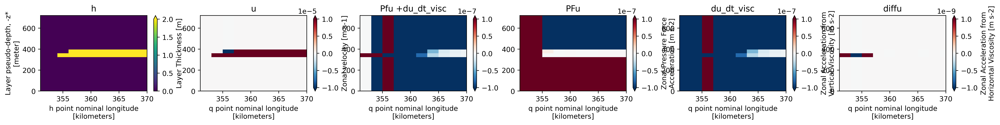

In [69]:
fig, axes = plt.subplots(ncols = 6, nrows = 1, figsize = (24,2),dpi = 400)
ax = np.ravel(axes)
time = 0

label = 'iceshelf-z'
prog = open_files(label)
def open_mom(label):
    base = basee 
    prog = xr.open_dataset(base + label+'/mom.nc')
    return prog
mom = open_mom(label)

prog.h.isel(Time = time, yh = 0).plot(ax = ax[0],vmax = 2,vmin = 0)
ax[0].set_xlim(351,370)
ax[0].set_title('h')

prog.u.isel(Time = time, yh = 0).plot(ax = ax[1], vmax = 1e-5, vmin = -1e-5, cmap = 'RdBu_r')
ax[1].set_xlim(351,370)
ax[1].set_title('u')
ax[1].set_ylabel('')

(mom.PFu.isel(Time = time, yh = 0)+mom.du_dt_visc.isel(Time = time, yh = 0)).plot(ax = ax[2], vmax = 1e-7, vmin = -1e-7, cmap = 'RdBu_r')
ax[2].set_xlim(351,370)
ax[2].set_title('Pfu +du_dt_visc')
ax[2].set_ylabel('')

mom.PFu.isel(Time = time, yh = 0).plot(ax = ax[3], vmax = 1e-7, vmin = -1e-7, cmap = 'RdBu_r')
ax[3].set_xlim(351,370)
ax[3].set_title('PFu')
ax[3].set_ylabel('')
mom.du_dt_visc.isel(Time = time, yh = 0).plot(ax = ax[4], vmax = 1e-7, vmin = -1e-7, cmap = 'RdBu_r')
ax[4].set_xlim(351,370)
ax[4].set_title('du_dt_visc')
ax[4].set_ylabel('')

mom.diffu.isel(Time = time, yh = 0).plot(ax = ax[5], vmax = 1e-9, vmin = -1e-9, cmap = 'RdBu_r')
ax[5].set_xlim(351,370)
ax[5].set_title('diffu')
ax[5].set_ylabel('')

Text(0, 0.5, '')

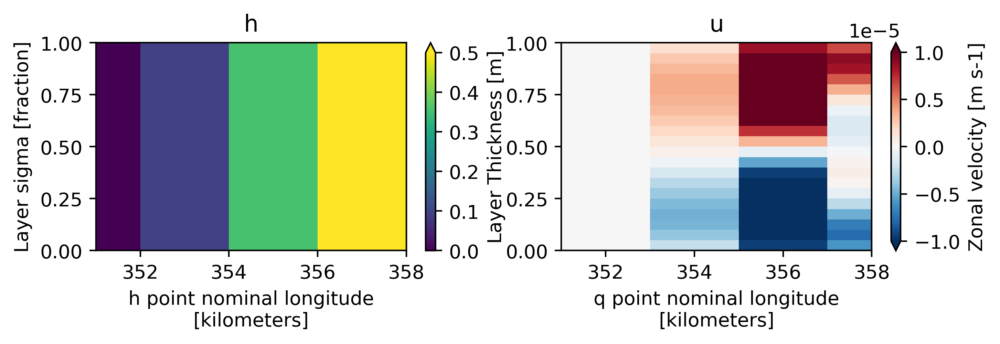

In [59]:
fig, axes = plt.subplots(ncols = 2, nrows = 1, figsize = (8,2),dpi = 400)
ax = np.ravel(axes)


label = 'iceshelf3-sigma-dynsurfp'
prog = open_files(label)

prog.h.isel(Time = -1, yh = 0).plot(ax = ax[0],vmax = 0.5,vmin = 0)
ax[0].set_xlim(351,358)
ax[0].set_title('h')

prog.u.isel(Time = -1, yh = 0).plot(ax = ax[1], vmax = 1e-5, vmin = -1e-5, cmap = 'RdBu_r')
ax[1].set_xlim(351,358)
ax[1].set_title('u')
ax[1].set_ylabel('')

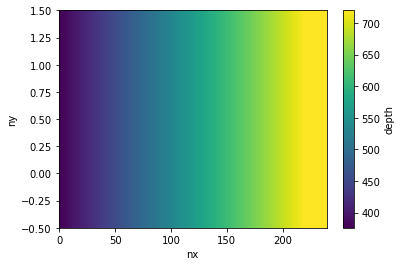

In [22]:
depth = np.zeros([2,240])
ny = np.arange(2)
nx = np.arange(240)
# create xarray dataset
ds = xr.Dataset(
    data_vars=dict(
        depth=(["ny", "nx"], depth),
    ),
#    coords=dict(
#        nx=(["nx"], nx),
#        ny=(["ny"], ny),
#    ),
    #attrs=dict(description="Depth of topography"),
)

ds2 = open_IC('iceshelf-z')
min_depth = -ds2.eta.isel(lonh = 0).max().values
ds['depth'] = (720-min_depth)/260*(ds.depth+ds.nx)+min_depth*1.5
ds['depth'] = ds.depth.where(ds.depth<720).fillna(720)

ds.depth.plot()
ds.to_netcdf('INPUT/topog_2D_shallower.nc')

[319.62448122 319.62448122]
313.35733453242636


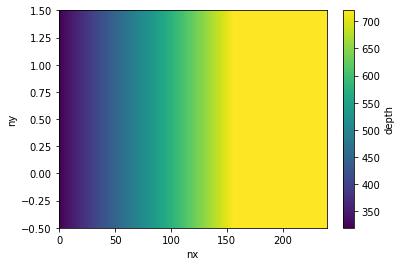

In [32]:
depth = np.zeros([2,240])
ny = np.arange(2)
nx = np.arange(240)
# create xarray dataset
ds = xr.Dataset(
    data_vars=dict(
        depth=(["ny", "nx"], depth),
    ),
#    coords=dict(
#        nx=(["nx"], nx),
#        ny=(["ny"], ny),
#    ),
    #attrs=dict(description="Depth of topography"),
)

ds2 = open_IC('iceshelf-z')
min_depth = -ds2.eta.isel(lonh = 0).min().values
ds['depth'] = (720-min_depth)/159*(ds.depth+ds.nx)+min_depth*1.02
ds['depth'] = ds.depth.where(ds.depth<720).fillna(720)
print(ds.depth.isel(nx = 0).values)
print(min_depth)
ds.depth.plot()
ds.to_netcdf('INPUT/topog_2D_shallowish.nc')

[316.49090788 316.49090788]
313.35733453242636


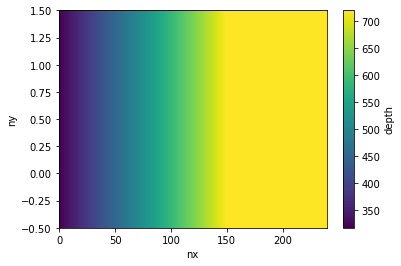

In [9]:
depth = np.zeros([2,240])
ny = np.arange(2)
nx = np.arange(240)
# create xarray dataset
ds = xr.Dataset(
    data_vars=dict(
        depth=(["ny", "nx"], depth),
    ),
#    coords=dict(
#        nx=(["nx"], nx),
#        ny=(["ny"], ny),
#    ),
    #attrs=dict(description="Depth of topography"),
)

ds2 = open_IC('iceshelf-z')
min_depth = -ds2.eta.isel(lonh = 0).min().values
ds['depth'] = (720-min_depth)/151*(ds.depth+ds.nx)+min_depth*1.01
ds['depth'] = ds.depth.where(ds.depth<720).fillna(720)
print(ds.depth.isel(nx = 0).values)
print(min_depth)
ds.depth.plot()
ds.to_netcdf('INPUT/topog_2D_shallowish2.nc')

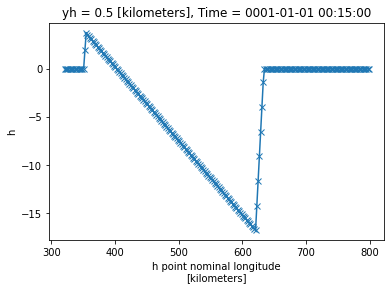

In [4]:
prog = open_files('iceshelf3-z')
prog2 = open_files('iceshelf-z')
(prog.isel(Time = 0,yh = 0).h.sum('zl')-prog2.isel(Time = 0,yh = 0).h.sum('zl')).plot(marker = 'x')


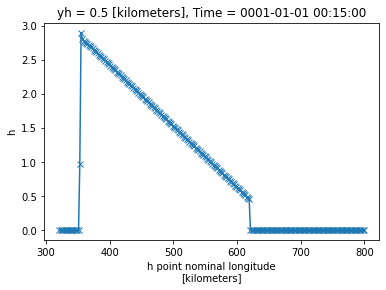

In [10]:
prog = open_files('iceshelf3-z')
prog2 = open_files('iceshelf-z')
(prog.isel(Time = 0,yh = 0).h.sum('zl')-prog2.isel(Time = 0,yh = 0).h.sum('zl')).plot(marker = 'x')


(330.0, 360.0)

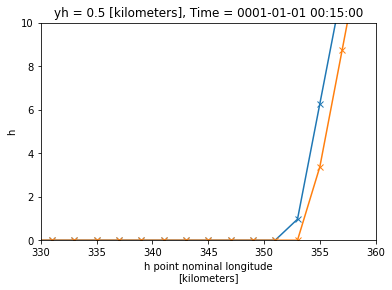

In [15]:
prog = open_files('iceshelf3-z')
prog2 = open_files('iceshelf-z')
(prog.isel(Time = 0,yh = 0).h.sum('zl')).plot(marker = 'x')
(prog2.isel(Time = 0,yh = 0).h.sum('zl')).plot(marker = 'x')

plt.ylim(0,10)
plt.xlim(330,360)

(330.0, 360.0)

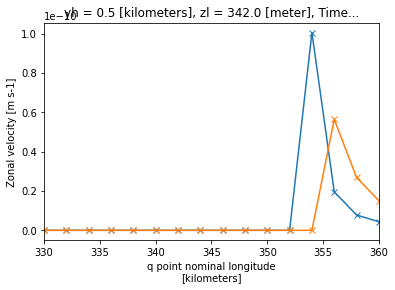

In [7]:
prog = open_files('iceshelf3-z')
prog2 = open_files('iceshelf-z')
(prog.isel(Time = 0,yh = 0).u.isel(zl = 9)).plot(marker = 'x')
(prog2.isel(Time = 0,yh = 0).u.isel(zl = 9)).plot(marker = 'x')

#plt.ylim(0,10)
plt.xlim(330,360)

/Users/claireyung/opt/anaconda3/lib/python3.9/site-packages/xarray/coding/times.py:699: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)


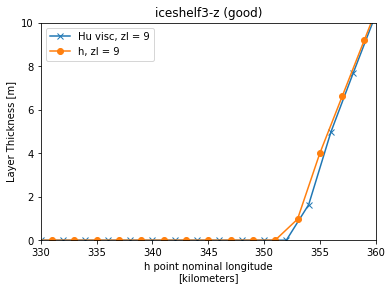

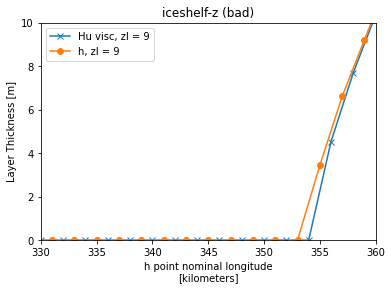

In [10]:
visc = open_visc('iceshelf3-z')
visc2 = open_visc('iceshelf-z')
(visc.isel(Time = 0,yh = 0).Hu_visc).isel(zl = 9).plot(marker = 'x', label = 'Hu visc, zl = 9')
(prog.isel(Time = 0,yh = 0).h.isel(zl = 9)).plot(marker = 'o', label = 'h, zl = 9')
plt.ylim(0,10)
plt.xlim(330,360)
plt.title('iceshelf3-z (good)')
plt.legend()
plt.show()

(visc2.isel(Time = 0,yh = 0).Hu_visc).isel(zl = 9).plot(marker = 'x', label = 'Hu visc, zl = 9')
(prog2.isel(Time = 0,yh = 0).h.isel(zl = 9)).plot(marker = 'o', label = 'h, zl = 9')

plt.ylim(0,10)
plt.xlim(330,360)
plt.title('iceshelf-z (bad)')
plt.legend()


# For z coordinate grounding line: 
I seem to be able to get either a large velocity (stripes, complaining about depth going below bathymetry) or a small velocity with very minimal changes to bathymetry. Seems like it is happy if second smallest layer ~1m, but not the jump from min to 4m?

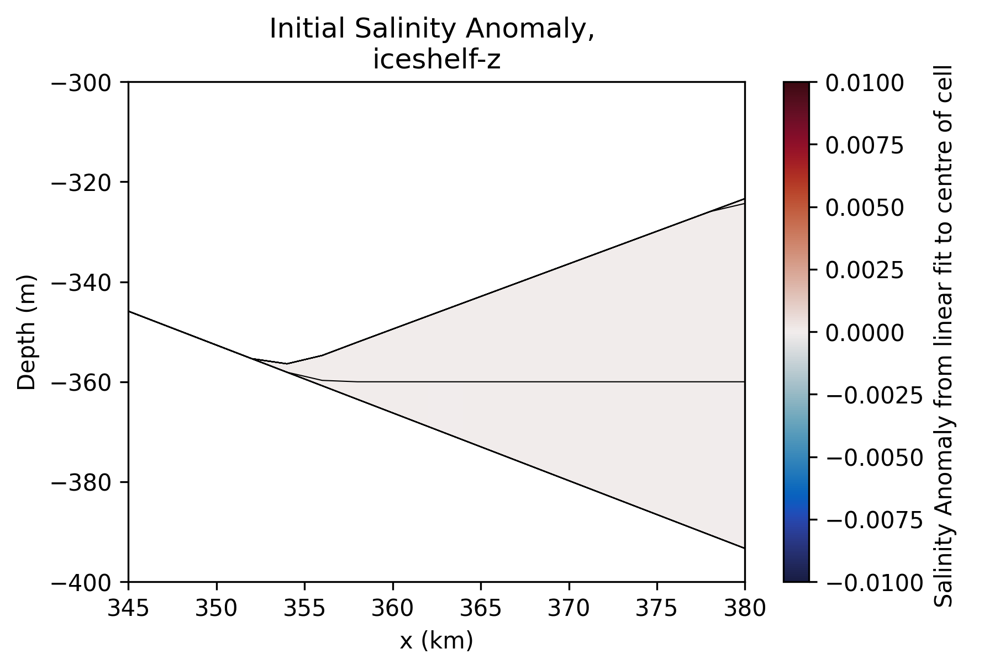

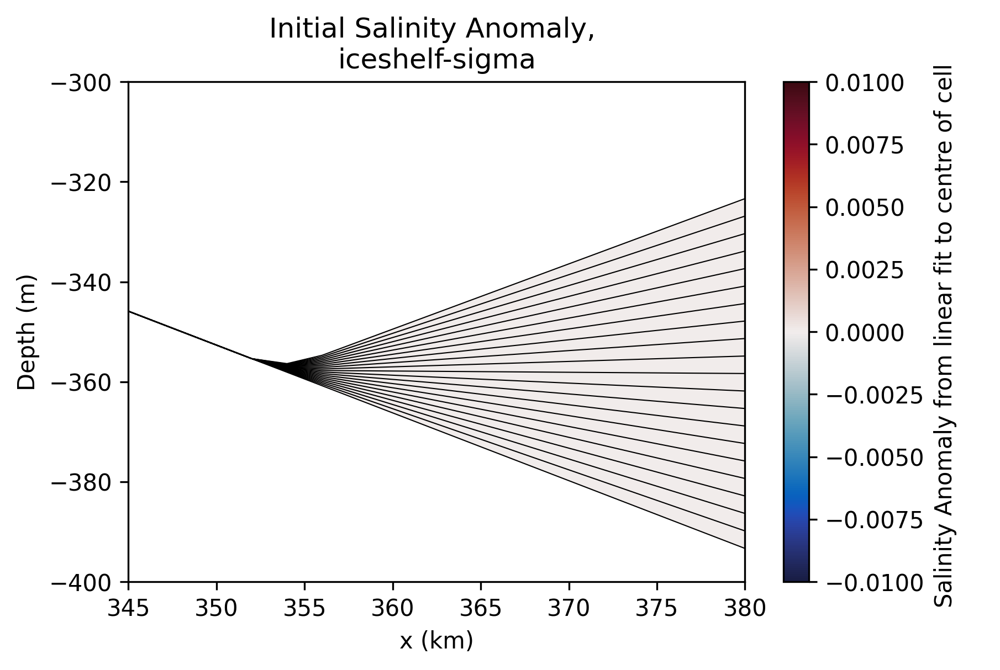

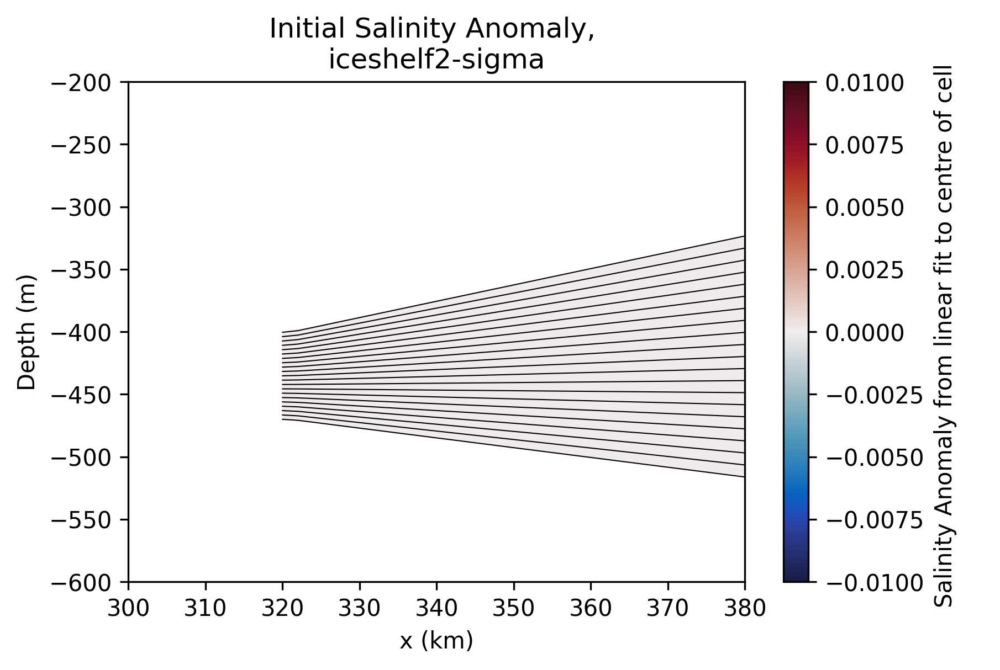

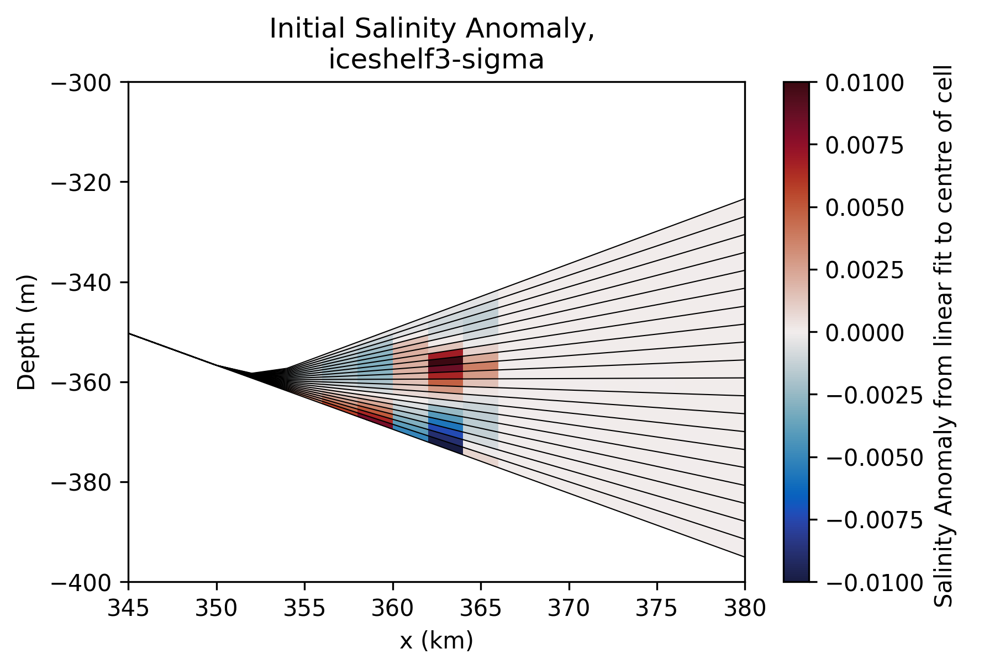

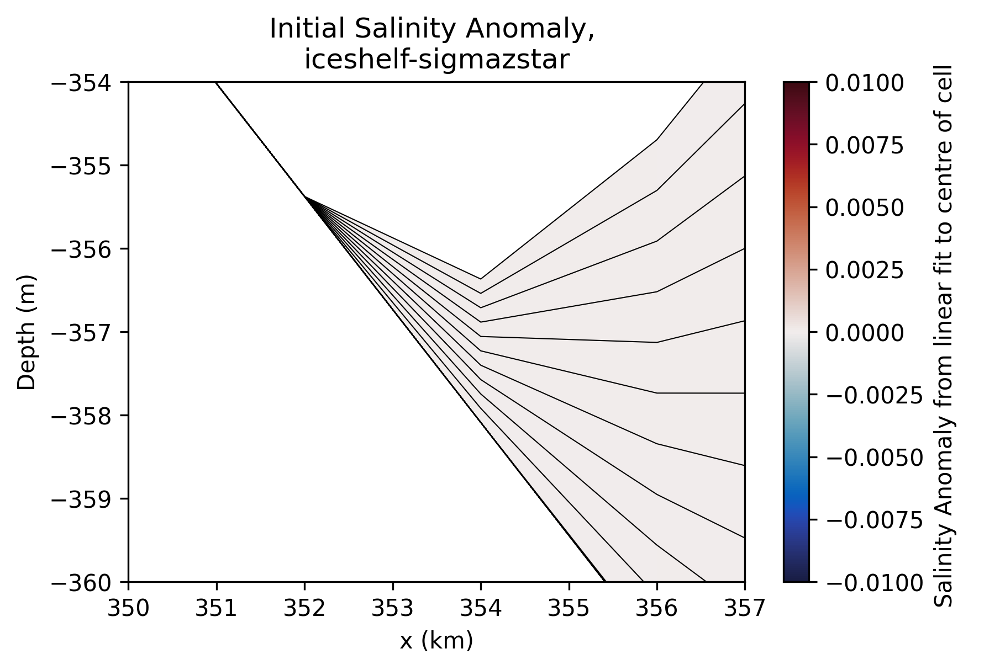

In [48]:
for label in ['iceshelf-z','iceshelf-sigma','iceshelf2-sigma','iceshelf3-sigma',
             'iceshelf-sigmazstar']:

    fig, axes = plt.subplots(dpi = 300)
    IC = open_IC(label)
    time = 0
    x = 0
    ymax = 720
    
    ideal_salt = xr.zeros_like(IC.Salt) + (IC.eta.isel(Interface = 0)-IC.h.cumsum('Layer')+IC.h/2)*(34.55-33.8)/(-ymax)+33.8 #\
    #+ 33.8 + ((IC.eta.isel(Interface = 0)-IC.h.cumsum('Layer')+IC.h/2)*(IC.eta.isel(Interface = 0)-IC.h.cumsum('Layer')+IC.h/2+ymax))/ymax**2*0.85
    plot_t(axes,x,time,IC.Salt-ideal_salt,"Salinity Anomaly from linear fit to centre of cell \n",-1e-2,1e-2,cm.cm.balance,ymax)
    axes.set_title('Initial Salinity Anomaly, \n'+label)
    plt.xlim(345,380)
    if label == 'iceshelf2-sigma':
        plt.ylim(-600,-200)
        plt.xlim(300,380)
    elif label == 'iceshelf-sigmazstar':
        plt.ylim(-360,-354)
        plt.xlim(350,357)
    else:
        plt.ylim(-400,-300)
    plt.show()


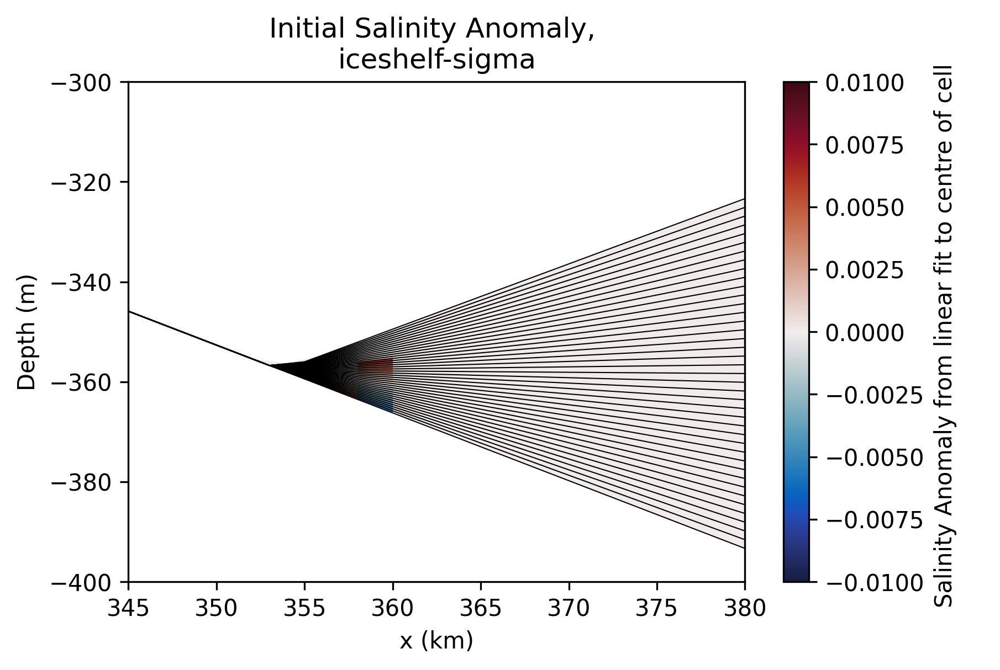

In [5]:
for label in ['iceshelf-sigma']:

    fig, axes = plt.subplots(dpi = 300)
    IC = open_IC(label)
    time = 0
    x = 0
    ymax = 720
    
    ideal_salt = xr.zeros_like(IC.Salt) + (IC.eta.isel(Interface = 0)-IC.h.cumsum('Layer')+IC.h/2)*(34.55-33.8)/(-ymax)+33.8 #\
    #+ 33.8 + ((IC.eta.isel(Interface = 0)-IC.h.cumsum('Layer')+IC.h/2)*(IC.eta.isel(Interface = 0)-IC.h.cumsum('Layer')+IC.h/2+ymax))/ymax**2*0.85
    plot(axes,x,time,IC.Salt-ideal_salt,"Salinity Anomaly from linear fit to centre of cell \n",-1e-2,1e-2,cm.cm.balance,ymax)
    axes.set_title('Initial Salinity Anomaly, \n'+label)
    plt.xlim(345,380)
    if label == 'iceshelf2-sigma':
        plt.ylim(-600,-200)
        plt.xlim(300,380)
    else:
        plt.ylim(-400,-300)
    plt.show()


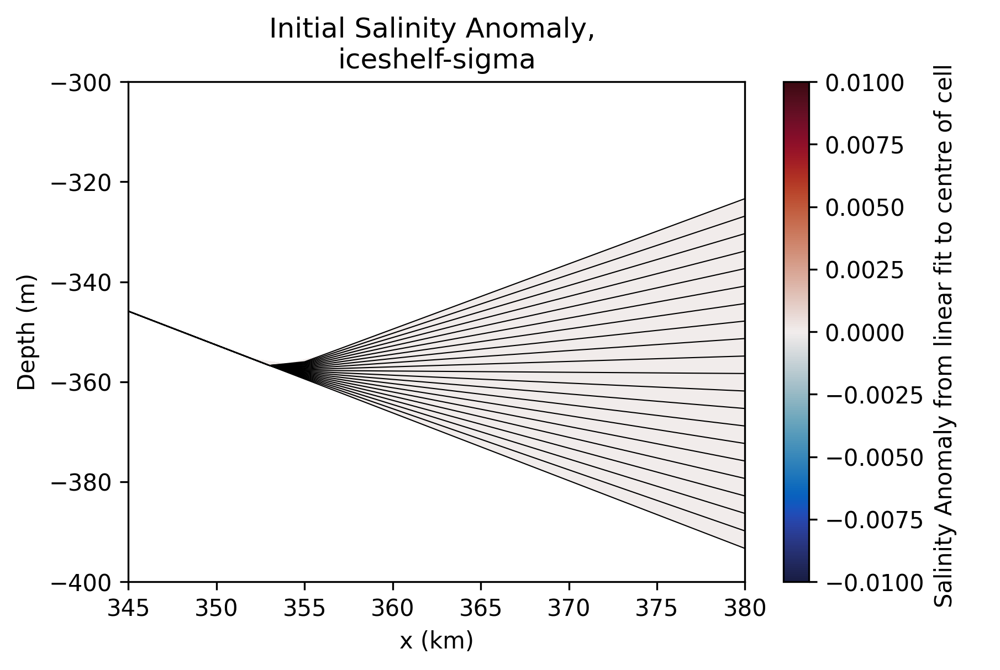

In [4]:
for label in ['iceshelf-sigma']:

    fig, axes = plt.subplots(dpi = 300)
    IC = open_IC(label)
    time = 0
    x = 0
    ymax = 720
    
    ideal_salt = xr.zeros_like(IC.Salt) + (IC.eta.isel(Interface = 0)-IC.h.cumsum('Layer')+IC.h/2)*(34.55-33.8)/(-ymax)+33.8 #\
    #+ 33.8 + ((IC.eta.isel(Interface = 0)-IC.h.cumsum('Layer')+IC.h/2)*(IC.eta.isel(Interface = 0)-IC.h.cumsum('Layer')+IC.h/2+ymax))/ymax**2*0.85
    plot(axes,x,time,IC.Salt-ideal_salt,"Salinity Anomaly from linear fit to centre of cell \n",-1e-2,1e-2,cm.cm.balance,ymax)
    axes.set_title('Initial Salinity Anomaly, \n'+label)
    plt.xlim(345,380)
    if label == 'iceshelf2-sigma':
        plt.ylim(-600,-200)
        plt.xlim(300,380)
    else:
        plt.ylim(-400,-300)
    plt.show()


## USE HACKMODE TO try and fix sigma initialisation near GL

In [5]:
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr
import netCDF4 as nc
import cmocean as cm
from xgcm import Grid

def make_thickness_file(filename):
    
    ic = xr.open_dataset('/Users/claireyung/mom6/MOM6-examples/ocean_only/ISOMIP/seamount-icemount-PGtest-dec24/iceshelf-sigma/MOM_IC.nc')
    _, nz, ny, nx = ic.h.data.shape

    new_thick = nc.Dataset(filename, "w", format="NETCDF4")
    new_thick.createDimension("nz", nz)
    new_thick.createDimension("ny", ny)
    new_thick.createDimension("nx", nx)
    new_thick.createVariable("h","f8",("nz","ny","nx"))

    new_thick["h"][:,:,:] = ic.h.data
    new_thick.close()

In [6]:
make_thickness_file('/Users/claireyung/mom6/MOM6-examples/ocean_only/ISOMIP/seamount-icemount-PGtest-dec24/iceshelf-sigma/INPUT/thickness_simpleshelf2_pfile.nc')


params with this as before, but

```
!#override THICKNESS_CONFIG = "ISOMIP"
!#override TRIM_IC_FOR_P_SURF = True

! hackmode
#override THICKNESS_CONFIG = "thickness_file"
#override THICKNESS_FILE = "thickness_simpleshelf2_pfile.nc"  ! This is defined in make_thickness.ipynb
#override REMAP_AFTER_INITIALIZATION = False
#override HACK_MODE = True 
```

# Initialisation bug documentation

6-Jan-25

**Issue:** salinity/temperature initialisation not perfect in ALE sigma coordinates near the grounding line.

**Suspected reason:** remapping of initial conditions to desired ALE coordinate *AFTER* `trim_for_ice` module (which creates a consistent z-coord ice shelf).

**Reasoning:** 
- As shown in the figure below, initial conditions in `z` coordinates are perfect. They are not perfect in sigma coords near the GL, but if no GL they are perfect (bottom left). `sigma-shelf-zstar` coordinates are perfect as well.
- Since z coordinates have perfect initialisation, I think `trim_for_ice` module is fine. However, I am confused why remapping to ALE `sigma` coordinates has a problem whilst `sigma-shelf-zstar` coordinates do not.

**Temporary solution:**
- We can fix sigma coordinate initialisation using hack mode (as I did previously before other bugs with the ice shelf initialisation were fixed). Briefly, to use hack mode I first initialise the model, then save the thickness, then re-initialise the model without applying ice shelf pressure but using the thicknesses that know about the ice shelf. This means T and S get applied perfectly since it is just a function of depth.

Note initialisation parameters used in these test cases:

```
#override THICKNESS_CONFIG = "ISOMIP"
#override TRIM_IC_FOR_P_SURF = True
#override REMAP_BOUNDARY_EXTRAP = False
#override INIT_BOUNDARY_EXTRAP = True ! fixes previous bug with initialisation remapping to allow extrapolation in remapping
#override TRIMMING_USES_REMAPPING = True
#override TRIM_IC_Z_TOLERANCE = 1.e-14

#override REMAPPING_USE_OM4_SUBCELLS = False  ! fixes previous bug with initialisation remapping if ocean thickness changes
#override DIAG_REMAPPING_USE_OM4_SUBCELLS = False

```


My understanding of the ALE ice shelf initialisation:

1. Ocean gets initialised without ice shelf
2. Use `trim_for_ice` (called with `TRIM_IC_FOR_P_SURF = True`) which takes ice shelf pressure as input
3. `cut_off_column_top` gets called by trim_for_ice that truncates columns (making layers vanished). The output of this is a grid with the ice shelf boundary treated in a ALE z-coordinate fashion with vanishing layers at the surface. Since `TRIMMING_USES_REMAPPING = True`, T and S get remapped to what they should be. I think everything is correct given that the z coordinate initialisation is perfect.
4. Then, it needs to be regridded and remapped from this z-ice shelf coordinate to sigma coordinates. I think the problem occurs somewhere here. This can be done with regrid_accelerate in MOM_state_initialization or by the block controlled by `REMAP_AFTER_INITIALIZATION` in MOM.F90. Here, we want `INIT_BOUNDARY_EXTRAP  = True` (my PR here https://github.com/NOAA-GFDL/MOM6/pull/608)

Comparing the NK20 and NK40 cases, it looks like the salinity anomaly only occurs when the ocean in thinner than one z coordinate grid cell (40m and 20m respectively). How does remapping work when going from one or two nonvanished layers to a large number in the other coordinate?


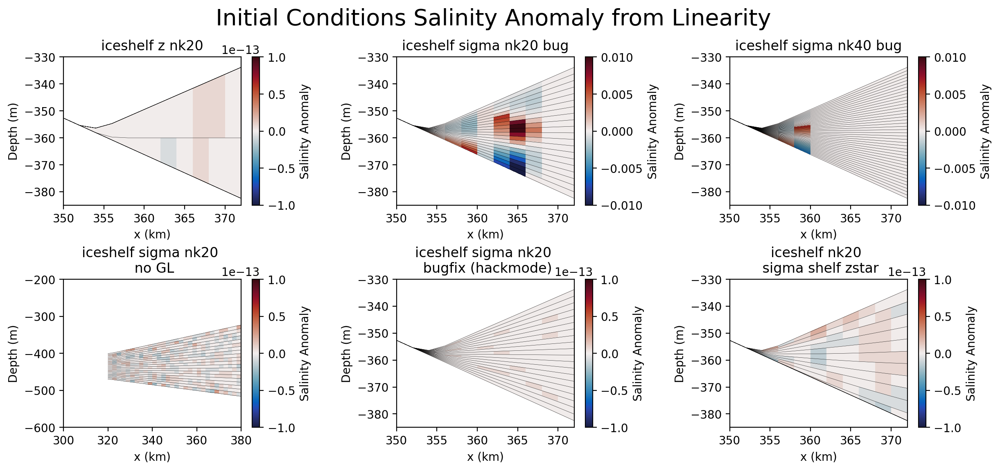

In [47]:
fig, axes = plt.subplots(nrows = 2, ncols = 3, figsize = (14,6),dpi = 200)
ax = axes.ravel()
for i in np.arange(6):
    label = ['iceshelf-z','iceshelf-sigma-bug','iceshelf-sigma-bug-nk40','iceshelf2-sigma','iceshelf-sigma',
             'iceshelf-sigmazstar'][i]
    nice_label = ['iceshelf z nk20','iceshelf sigma nk20 bug','iceshelf sigma nk40 bug',
                  'iceshelf sigma nk20 \n no GL','iceshelf sigma nk20 \n bugfix (hackmode)',
                 'iceshelf nk20 \n sigma shelf zstar'][i]

    IC = open_IC(label)
    time = 0
    x = 0
    ymax = 720
    vmax = [1e-13,1e-2,1e-2,1e-13,1e-13,1e-13][i]
    ideal_salt = xr.zeros_like(IC.Salt) + (IC.eta.isel(Interface = 0)-IC.h.cumsum('Layer')+IC.h/2)*(34.55-33.8)/(-ymax)+33.8 #\
    plot_t(ax[i],x,time,IC.Salt-ideal_salt,"Salinity Anomaly",-vmax, vmax,cm.cm.balance,ymax)
    ax[i].set_title(nice_label)
    ax[i].set_xlim(350,372)
    if label == 'iceshelf2-sigma':
        ax[i].set_ylim(-600,-200)
        ax[i].set_xlim(300,380)
#     elif label == 'iceshelf-sigmazstar':
#         ax[i].set_ylim(-360,-354)
#         ax[i].set_xlim(350,357)
#     elif label == 'iceshelf-sigma-bug-nk40':
#         ax[i].set_ylim(-370,-340)
#         ax[i].set_xlim(350,362)
    else:
        ax[i].set_ylim(-385,-330)
fig.suptitle('Initial Conditions Salinity Anomaly from Linearity',fontsize = 20)
fig.subplots_adjust(hspace = 0.5,wspace = 0.5)

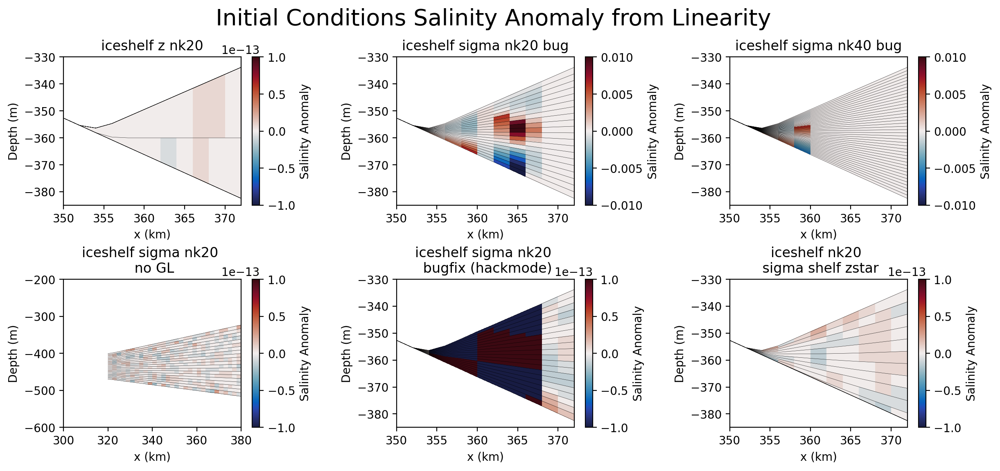

In [25]:
fig, axes = plt.subplots(nrows = 2, ncols = 3, figsize = (14,6),dpi = 200)
ax = axes.ravel()
for i in np.arange(6):
    label = ['iceshelf-z','iceshelf-sigma-bug','iceshelf-sigma-bug-nk40','iceshelf2-sigma','iceshelf-sigma',
             'iceshelf-sigmazstar'][i]
    nice_label = ['iceshelf z nk20','iceshelf sigma nk20 bug','iceshelf sigma nk40 bug',
                  'iceshelf sigma nk20 \n no GL','iceshelf sigma nk20 \n bugfix (hackmode)',
                 'iceshelf nk20 \n sigma shelf zstar'][i]

    IC = open_IC(label)
    time = 0
    x = 0
    ymax = 720
    vmax = [1e-13,1e-2,1e-2,1e-13,1e-13,1e-13][i]
    ideal_salt = xr.zeros_like(IC.Salt) + (IC.eta.isel(Interface = 0)-IC.h.cumsum('Layer')+IC.h/2)*(34.55-33.8)/(-ymax)+33.8 #\
    plot_t(ax[i],x,time,IC.Salt-ideal_salt,"Salinity Anomaly",-vmax, vmax,cm.cm.balance,ymax)
    ax[i].set_title(nice_label)
    ax[i].set_xlim(350,372)
    if label == 'iceshelf2-sigma':
        ax[i].set_ylim(-600,-200)
        ax[i].set_xlim(300,380)
#     elif label == 'iceshelf-sigmazstar':
#         ax[i].set_ylim(-360,-354)
#         ax[i].set_xlim(350,357)
#     elif label == 'iceshelf-sigma-bug-nk40':
#         ax[i].set_ylim(-370,-340)
#         ax[i].set_xlim(350,362)
    else:
        ax[i].set_ylim(-385,-330)
fig.suptitle('Initial Conditions Salinity Anomaly from Linearity',fontsize = 20)
fig.subplots_adjust(hspace = 0.5,wspace = 0.5)

### The velocities at t=1 timestep match the salinity anomalies.

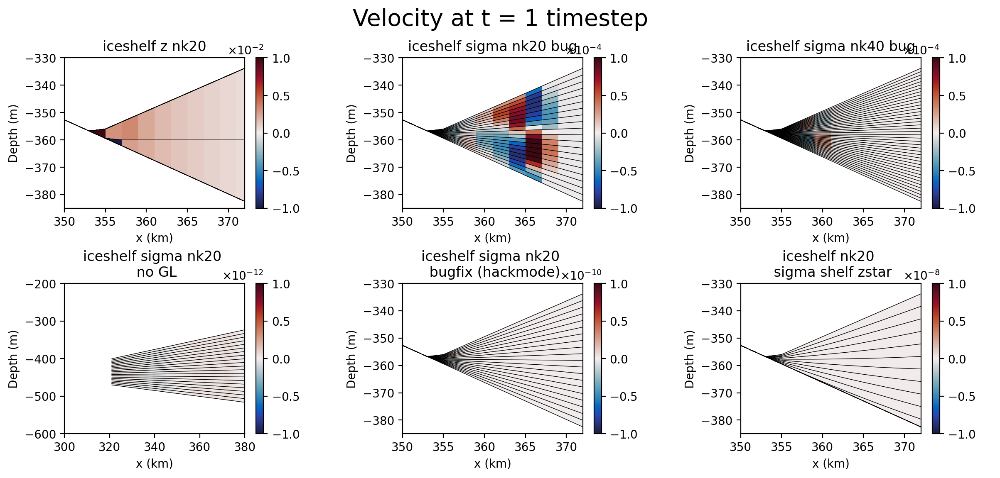

In [48]:
fig, axes = plt.subplots(nrows = 2, ncols = 3, figsize = (14,6),dpi = 200)
ax = axes.ravel()
for i in np.arange(6):
    label = ['iceshelf-z','iceshelf-sigma-bug','iceshelf-sigma-bug-nk40','iceshelf2-sigma','iceshelf-sigma',
             'iceshelf-sigmazstar'][i]
    nice_label = ['iceshelf z nk20','iceshelf sigma nk20 bug','iceshelf sigma nk40 bug',
                  'iceshelf sigma nk20 \n no GL','iceshelf sigma nk20 \n bugfix (hackmode)',
                 'iceshelf nk20 \n sigma shelf zstar'][i]

    prog = open_files(label)
    time = 0
    x = 0
    ymax = 720
    vmax = [1e-2,1e-4,1e-4,1e-12,1e-10,1e-8][i]
    plot_u(ax[i],x,time,prog.u,"uo",-vmax, vmax,cm.cm.balance,ymax)
    ax[i].set_title(nice_label)
    ax[i].set_xlim(350,372)
    if label == 'iceshelf2-sigma':
        ax[i].set_ylim(-600,-200)
        ax[i].set_xlim(300,380)
#     elif label == 'iceshelf-sigmazstar':
#         ax[i].set_ylim(-360,-354)
#         ax[i].set_xlim(350,357)
#     elif label == 'iceshelf-sigma-bug-nk40':
#         ax[i].set_ylim(-370,-340)
#         ax[i].set_xlim(350,362)
    else:
        ax[i].set_ylim(-385,-330)
fig.suptitle('Velocity at t = 1 timestep',fontsize = 20)
fig.subplots_adjust(hspace = 0.5,wspace = 0.5)

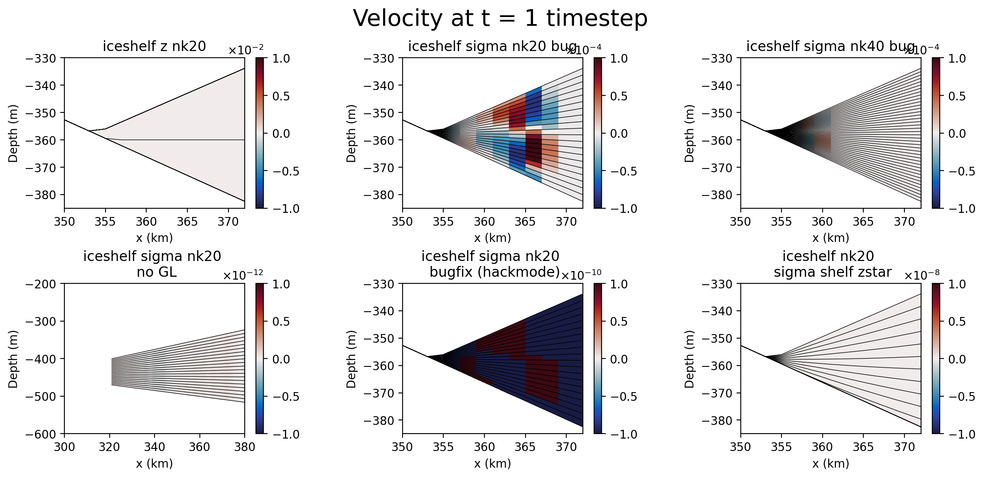

In [5]:
fig, axes = plt.subplots(nrows = 2, ncols = 3, figsize = (14,6),dpi = 200)
ax = axes.ravel()
for i in np.arange(6):
    label = ['iceshelf-z','iceshelf-sigma-bug','iceshelf-sigma-bug-nk40','iceshelf2-sigma','iceshelf-sigma',
             'iceshelf-sigmazstar'][i]
    nice_label = ['iceshelf z nk20','iceshelf sigma nk20 bug','iceshelf sigma nk40 bug',
                  'iceshelf sigma nk20 \n no GL','iceshelf sigma nk20 \n bugfix (hackmode)',
                 'iceshelf nk20 \n sigma shelf zstar'][i]

    prog = open_files(label)
    time = 0
    x = 0
    ymax = 720
    vmax = [1e-2,1e-4,1e-4,1e-12,1e-10,1e-8][i]
    plot_u(ax[i],x,time,prog.u,"uo",-vmax, vmax,cm.cm.balance,ymax)
    ax[i].set_title(nice_label)
    ax[i].set_xlim(350,372)
    if label == 'iceshelf2-sigma':
        ax[i].set_ylim(-600,-200)
        ax[i].set_xlim(300,380)
#     elif label == 'iceshelf-sigmazstar':
#         ax[i].set_ylim(-360,-354)
#         ax[i].set_xlim(350,357)
#     elif label == 'iceshelf-sigma-bug-nk40':
#         ax[i].set_ylim(-370,-340)
#         ax[i].set_xlim(350,362)
    else:
        ax[i].set_ylim(-385,-330)
fig.suptitle('Velocity at t = 1 timestep',fontsize = 20)
fig.subplots_adjust(hspace = 0.5,wspace = 0.5)

# Wright EOS Initialisation

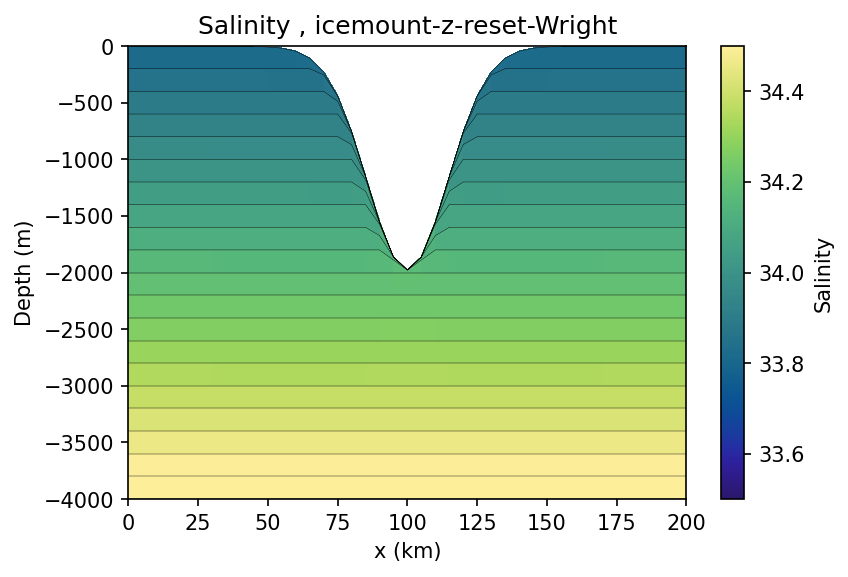

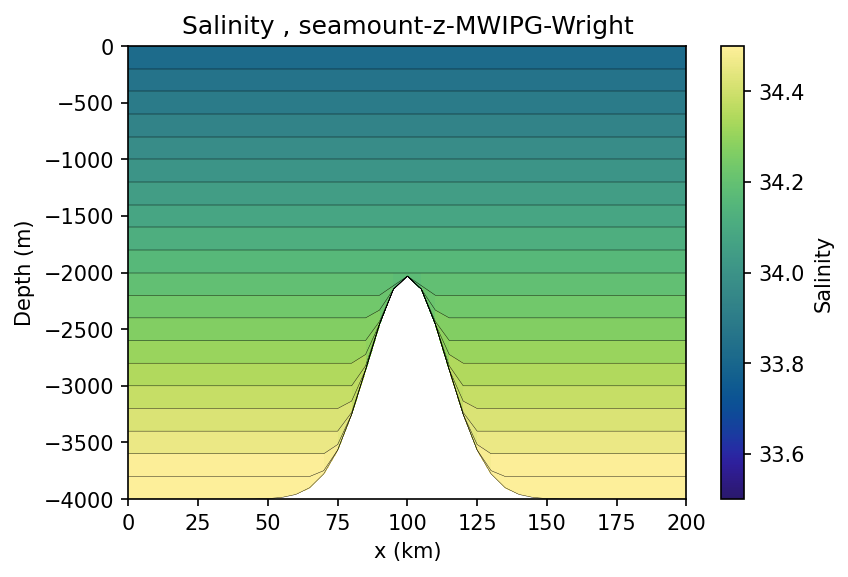

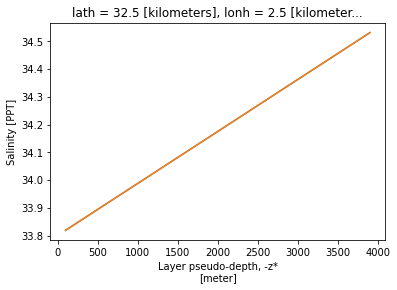

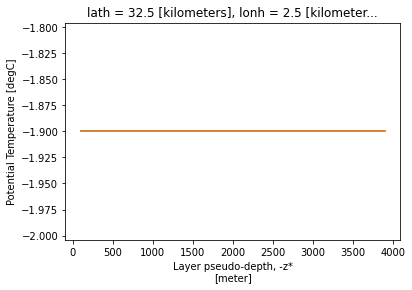

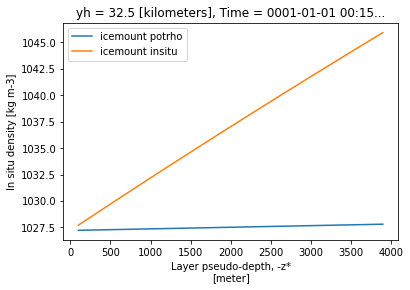

In [6]:
fig, axes = plt.subplots(dpi = 150)
label = 'icemount-z-reset-Wright'
prog = open_files(label)
IC1 = open_IC(label)
time = 0
x = 0
ymax = 4000

plot_t(axes,x,time,prog.salt,"Salinity",33.5,34.5,cm.cm.haline,ymax)
plt.show()

#####
fig, axes = plt.subplots(dpi = 150)
label = 'seamount-z-MWIPG-Wright'
prog2 = open_files(label)
IC2 = open_IC(label)
time = 0
x = 0
ymax = 4000

plot_t(axes,x,time,prog2.salt,"Salinity",33.5,34.5,cm.cm.haline,ymax)
plt.show()

IC1.Salt.isel(Time = 0, lath = 0, lonh = 0).plot()
IC2.Salt.isel(Time = 0, lath = 0, lonh = 0).plot()
plt.show()

IC1.Temp.isel(Time = 0, lath = 0, lonh = 0).plot()
IC2.Temp.isel(Time = 0, lath = 0, lonh = 0).plot()

plt.show()
prog.rhopot0.isel(Time = 0, xh =0, yh = 0).plot(label = 'icemount potrho')
#prog2.rhopot0.isel(Time = 0, xh =0, yh = 0).plot(label = 'seamount potrho')
prog.rhoinsitu.isel(Time = 0, xh =0, yh = 0).plot(label = 'icemount insitu')
#prog2.rhoinsitu.isel(Time = 0, xh =0, yh = 0).plot(label = 'seamount insitu')
plt.legend()

In [7]:
print(prog.rhoinsitu.isel(Time = 0, xh =0, yh = 0,zl = 10).values)
print(prog.rhoinsitu.isel(Time = 0, xh =0, yh = 0,zl = 0).values)
print(prog.h.isel(Time = 0, xh =0, yh = 0,zl = np.arange(0,10)).sum().values)
print(prog.rhopot0.isel(Time = 0, xh =0, yh = 0,zl = 10).values)
print(prog.rhopot0.isel(Time = 0, xh =0, yh = 0,zl = 0).values)


1037.5059733351716
1027.7095098155314
2000.8541912512237
1027.525414866703
1027.2204053532982


$$ p = g \int_0^z \rho_0 + (\rho_{2000}-\rho_{0})\frac{z}{H} dz = g \left( \rho_0 z + (\rho_{2000}-\rho_{0})z^2/2H \right)$$

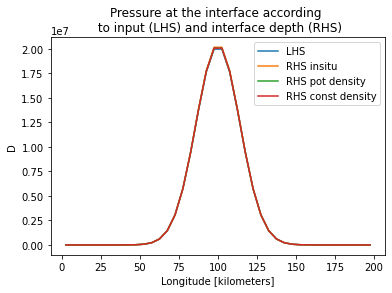

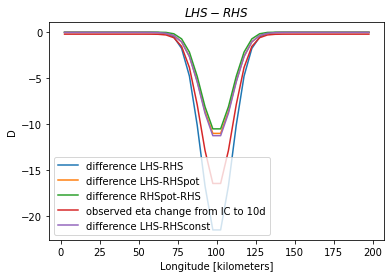

In [10]:
H_thick = xr.open_dataset('INPUT/fatseamountice.nc').D
(8820*H_thick).isel(lath = 0).plot(label = 'LHS')


g = 9.8
z = -IC1.eta.isel(Interface = 0, lath = 0, Time = 0)
S_top = 1027.713
S_bot = 1037.577
H = 2000 #2000.88
rho_0 = S_top- (S_bot-S_top)/H*100 #999.9106806711001
#beta = 0.805876093
#temp = -1.9
#alpha = -0.0383569483
RHS = g*rho_0*(z + 1/rho_0*(z**2/2)*(S_bot-S_top)/H)

S_top = 1027.5254168927715
S_bot = 1027.2204073776306
rho_0 = S_top- (S_bot-S_top)/H*100 #999.9106806711001
RHSpot = g*rho_0*(z + 1/rho_0*(z**2/2)*(S_bot-S_top)/H)

rho_0 = 1027.5
RHSconst = g*rho_0*z


plt.plot(H_thick.lonh.values, RHS.values, label = 'RHS insitu')
plt.plot(H_thick.lonh.values, RHSpot.values, label = 'RHS pot density')
plt.plot(H_thick.lonh.values, RHSconst.values, label = 'RHS const density')
plt.title('Pressure at the interface according \n to input (LHS) and interface depth (RHS)')

plt.legend()
plt.show()

((H_thick).isel(lath = 0)-RHS.values/8820).plot(label = 'difference LHS-RHS')
((H_thick).isel(lath = 0)-RHSpot.values/8820).plot(label = 'difference LHS-RHSpot')
(RHSpot.values/8820-RHS/8820).plot(label = 'difference RHSpot-RHS')
(900/1035*(IC1.eta.isel(Time = 0).isel(lath = 0,Interface = 0).values-prog.e.isel(Time = -1).isel(yh = 0,zi = 0))-2.3).plot(label = 'observed eta change from IC to 10d')
((H_thick).isel(lath = 0)-RHSconst.values/8820).plot(label = 'difference LHS-RHSconst')

plt.legend()
plt.title('$LHS-RHS$')
plt.show()


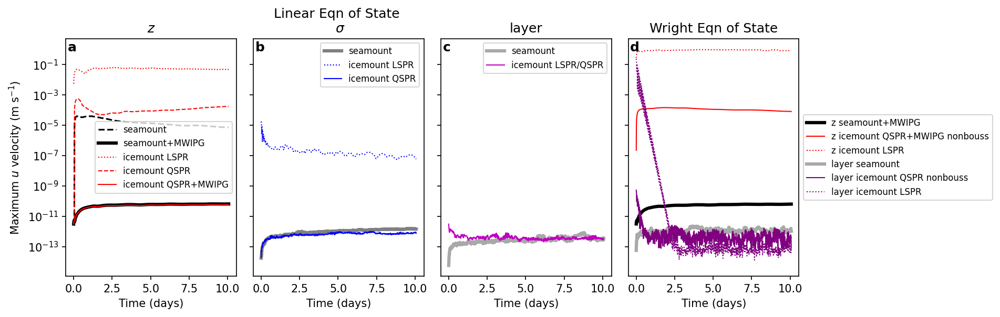

In [5]:
fig, axes = plt.subplots(ncols = 4, figsize = (12,4),dpi = 150, sharey = True)

# for label in ['seamount-layer','seamount-layer-quad','seamount-layer-exp',
#               'icemount-layer-LSPR','icemount-layer-reset-quad','icemount-layer-LSPR-exp',
#               'icemount-layer-reset-exp','icemount-layer-reset-exp-Wright','icemount-layer-reset-Wright',
#              'icemount-layer-LSPR-Wright','seamount-layer-Wright','seamount-layer-quad-Wright',
#              'icemount-z-reset-Wright','icemount-z-LSPR-Wright','seamount-z-MWIPG-Wright','seamount-z-exp-Wright']:
for i in np.arange(5):
    label = ['seamount-z','seamount-z-MWIPG',
              'icemount-z-LSPR','icemount-z-surfcorrect','icemount-z-reset'][i]
    labelplot = ['seamount','seamount+MWIPG','icemount LSPR','icemount QSPR','icemount QSPR+MWIPG'][i]
    color = ['k','k','r','r','r'][i]
    linestyle = ['--','-','dotted','--','-'][i]
    linewidth = [1.5,3,1,1,1][i]
    prog = open_files(label)
    axes[0].plot(np.arange(len(prog.Time))/24/4,np.abs(prog.u).max(['zl','yh','xq']), 
                 label = labelplot, color = color, linestyle = linestyle, linewidth = linewidth) 
axes[0].set_ylabel('Maximum $u$ velocity (m s$^{-1}$)')
axes[0].set_xlabel('Time (days)')
axes[0].set_yscale('log')
axes[0].legend(loc = 'center right', fontsize = 8)

for i in np.arange(3):
    label = ['seamount-sigma','icemount-sigma-LSPR','icemount-sigma-reset'][i]
    labelplot = ['seamount','icemount LSPR','icemount QSPR'][i]
    color = ['gray','b','b','b'][i]
    linestyle = ['-','dotted','-'][i]
    linewidth = [3,1,1,1][i]
    prog = open_files(label)
    axes[1].plot(np.arange(len(prog.Time))/24/4,np.abs(prog.u).max(['zl','yh','xq']), 
                 label = labelplot, color = color, linestyle = linestyle, linewidth = linewidth) 
#axes[0].set_ylabel('Max u vel (m/s)')
axes[1].set_xlabel('Time (days)')
#axes[0].set_yscale('log')
axes[1].legend(loc = 'upper right', fontsize = 8)

for i in np.arange(2):
    label = ['seamount-layer','icemount-layer-LSPR'][i]
    labelplot = ['seamount','icemount LSPR/QSPR'][i]
    color = ['darkgrey','m','b','b'][i]
    linestyle = ['-','-'][i]
    linewidth = [3,1,1,1][i]
    prog = open_files(label)
    axes[2].plot(np.arange(len(prog.Time))/24/4,np.abs(prog.u).max(['zl','yh','xq']), 
                 label = labelplot, color = color, linestyle = linestyle, linewidth = linewidth) 
#axes[0].set_ylabel('Max u vel (m/s)')
axes[2].set_xlabel('Time (days)')
#axes[0].set_yscale('log')
axes[2].legend(loc = 'upper right', fontsize = 8)


for i in np.arange(6):
    label = ['seamount-z-MWIPG-Wright','icemount-z-reset-Wright','icemount-z-LSPR-Wright',
             'seamount-layer-Wright','icemount-layer-reset-Wright','icemount-layer-LSPR-Wright'][i]
    labelplot = ['z seamount+MWIPG','z icemount QSPR+MWIPG nonbouss','z icemount LSPR',
                 'layer seamount', 'layer icemount QSPR nonbouss','layer icemount LSPR'][i]
    color = ['k','r','r','darkgrey','purple','purple'][i]
    linestyle = ['-','-','dotted','-','-','dotted',][i]
    linewidth = [3,1,1,3,1,1][i]
    prog = open_files(label)
    axes[3].plot(np.arange(len(prog.Time))/24/4,np.abs(prog.u).max(['zl','yh','xq']), 
                 label = labelplot, color = color, linestyle = linestyle, linewidth = linewidth) 
#axes[0].set_ylabel('Max u vel (m/s)')
axes[3].set_xlabel('Time (days)')
#axes[0].set_yscale('log')
axes[3].legend(loc = 'center left', fontsize = 8, bbox_to_anchor = (1,0.5))

fig.subplots_adjust(wspace = 0.1)

axes[0].set_title('$z$')
axes[1].set_title('Linear Eqn of State \n $\sigma$')
axes[2].set_title('layer')
axes[3].set_title('Wright Eqn of State')

# fig.suptitle('Spurious currents in linear temperature and salinity stratification tests', fontweight = 'bold',
#             x = 0.12,ha = 'left', y = 1.06)
for i in np.arange(4):
    axes[i].text(0.01,0.99,['a','b','c','d','e','f','g','h','i','j'][i], fontsize = 12, transform=axes[i].transAxes, fontweight='bold', va='top')


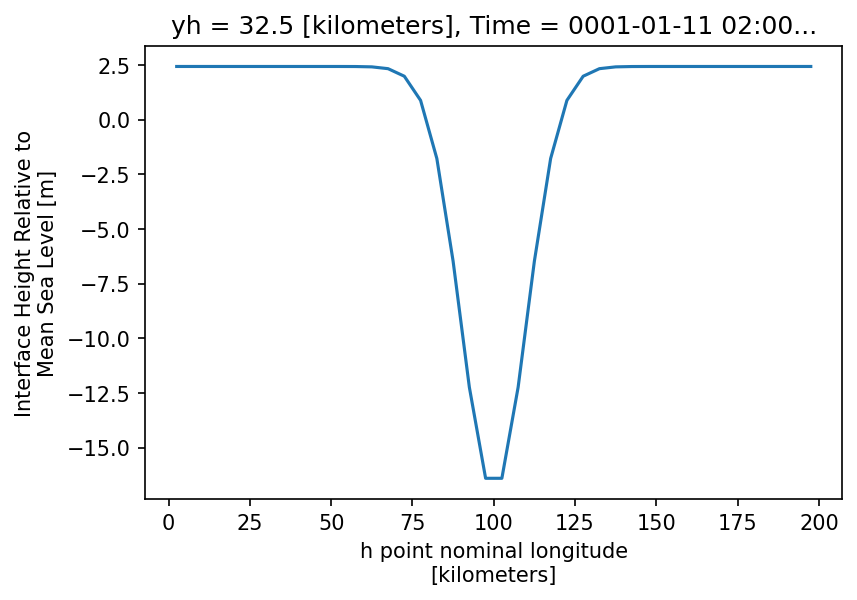

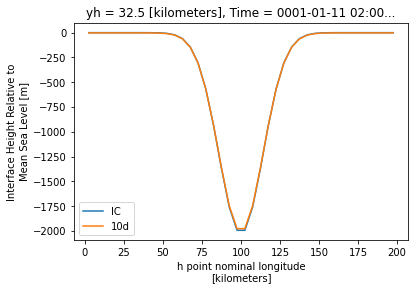

In [9]:
fig, axes = plt.subplots(dpi = 150)
label = 'icemount-z-reset-Wright'
prog = open_files(label)
IC1 = open_IC(label)
time = 0
x = 0
ymax = 4000

(IC1.eta.isel(Time = 0).isel(lath = 0,Interface = 0).values-prog.e.isel(Time = -1).isel(yh = 0,zi = 0)).plot()
plt.show()
IC1.eta.isel(Time = 0).isel(lath = 0,Interface = 0).plot(label = 'IC')
prog.e.isel(Time = -1).isel(yh = 0,zi = 0).plot(label = '10d')
plt.legend()

In [11]:
15/2000 *1035

7.762499999999999

$$p(z) = \int_\rho(z) g dz$$

$$ \rho(z) = (\rho_{2000} - \rho_0) -z/2000 + \rho_0 $$

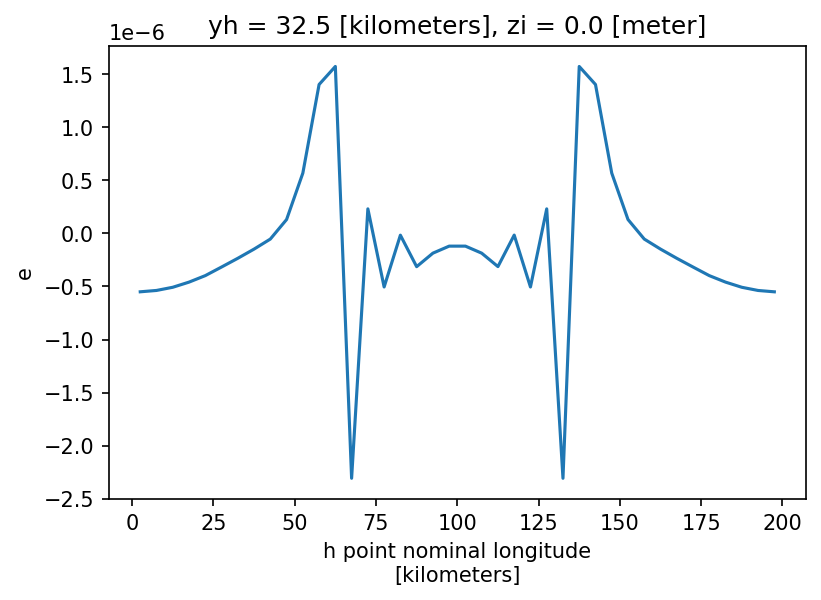

In [24]:
fig, axes = plt.subplots(dpi = 150)
label = 'icemount-z-reset-Wright'
prog = open_files(label)
IC1 = open_IC(label)
time = 0
x = 0
ymax = 4000

(prog.e.isel(Time = 0).isel(yh = 0,zi = 0)-prog.e.isel(Time = -1).isel(yh = 0,zi = 0)).plot()


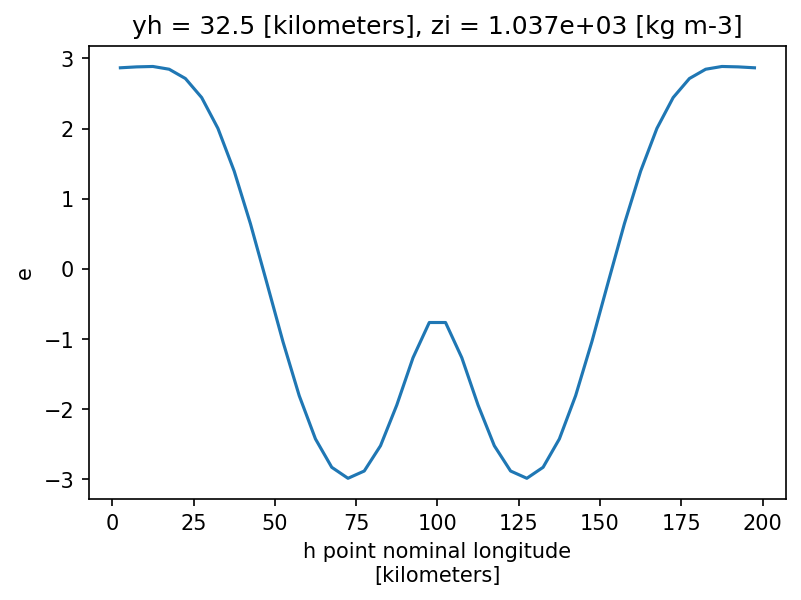

In [22]:
fig, axes = plt.subplots(dpi = 150)
label = 'icemount-layer-LSPR-Wright'
prog = open_files(label)
IC1 = open_IC(label)
time = 0
x = 0
ymax = 4000

(prog.e.isel(Time = 0).isel(yh = 0,zi = 0)-prog.e.isel(Time = -1).isel(yh = 0,zi = 0)).plot()


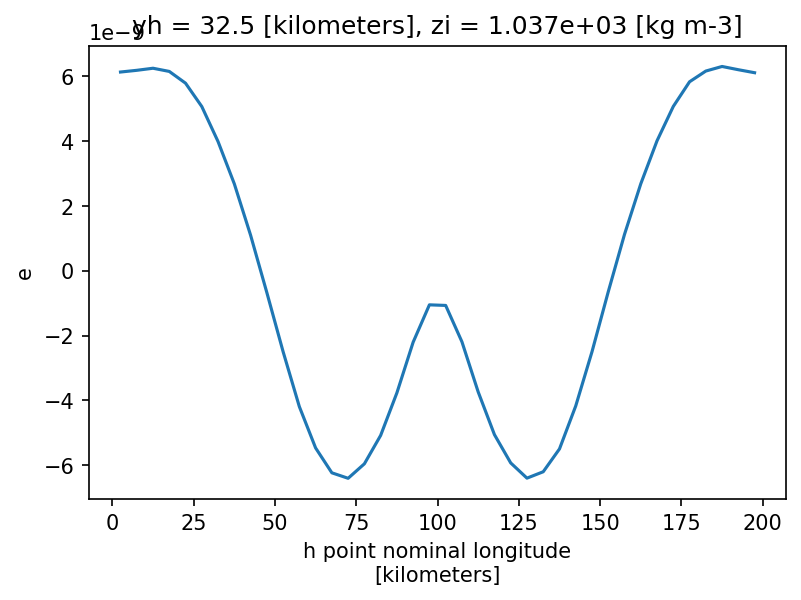

In [23]:
fig, axes = plt.subplots(dpi = 150)
label = 'icemount-layer-reset-Wright'
prog = open_files(label)
IC1 = open_IC(label)
time = 0
x = 0
ymax = 4000

(prog.e.isel(Time = 0).isel(yh = 0,zi = 0)-prog.e.isel(Time = -1).isel(yh = 0,zi = 0)).plot()


SIGMA_SHELF_ZSTAR

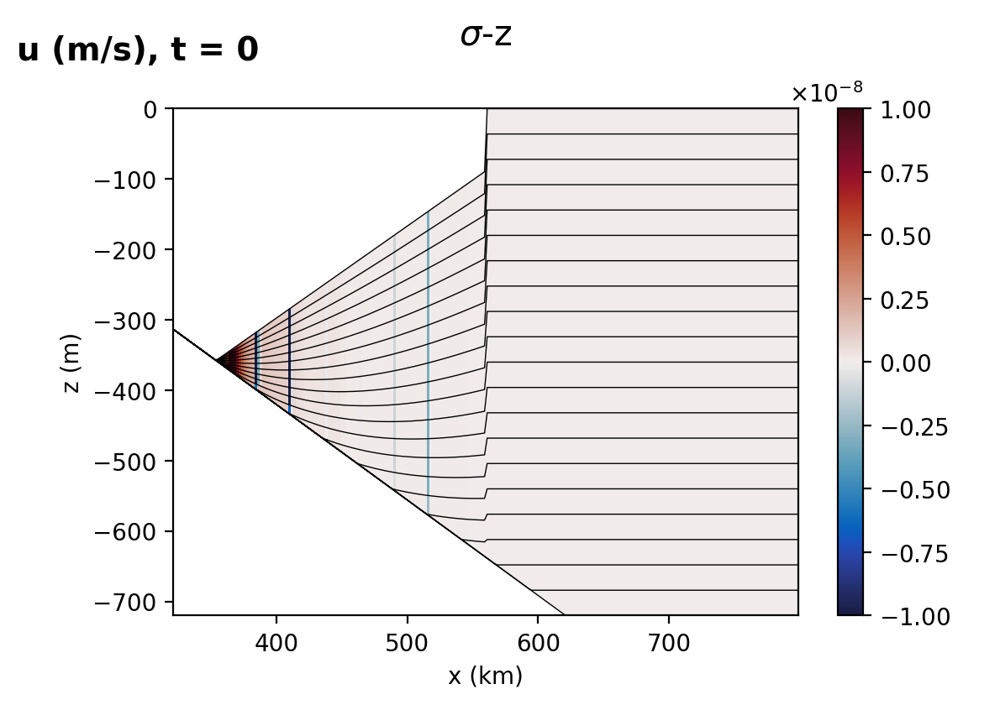

In [10]:
fig, ax = plt.subplots(dpi = 200)

label = 'iceshelf-sigmazstar'
loc = 0
vmax = 1e-8

a = ax

prog = open_files(label)
x = 0
ymax = 720

plot_u(a,x,0,prog.u,"uo",-vmax,vmax,cm.cm.balance,ymax)

a.set_title('')
if loc < 2:
    a.set_xlabel('x (km)')
if (loc ==0):
    a.set_ylabel('z (m)')
else:
    a.set_ylabel('')
    a.set_yticklabels('')

if loc < 3:
    a.set_title('$\sigma$-z', 
                y = 1.1, fontsize = 15)



fig.subplots_adjust(wspace = 0.15,hspace = 0.35)
fig.suptitle('u (m/s), t = 0', fontsize = 14, y = 0.99, x = 0.09,weight = 'bold')



plt.show()


/Users/claireyung/opt/anaconda3/lib/python3.9/site-packages/xarray/coding/times.py:699: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)


1
2
4
6
8
9
9
9
8
6
4
2
1


/Users/claireyung/opt/anaconda3/lib/python3.9/site-packages/xarray/coding/times.py:699: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)


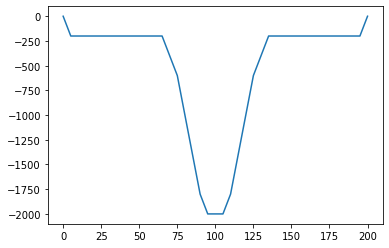

In [85]:
fig,ax = plt.subplots()
tt = 0
yy0 = 0
grid = Grid(prog,coords={"x":{"center":"xh","outer":"xq"},
                         "y":{"center":"yh","outer":"yq"},
                         "z":{"center":"zl","outer":"zi"}},periodic=False)
file_name = label
#IC = open_IC(label)
depth = grid.interp(prog.e,"x")
prog = open_files('icemount-z-reset')

try:
    mom = open_mom('icemount-z-reset')
    reset_ht = mom.reset_u.isel(Time = -1).isel(yh = yy0)
    height_reset = np.zeros(len(reset_ht.xq))
    for x in np.arange(1,len(reset_ht.xq)-1):
        # find depth
        if (np.max(reset_ht.isel(xq = x).values)==0):
            idx = 0
        else:
            idx = np.argmax(reset_ht.isel(xq = x).values)
            print(idx)
        height_reset[x] = depth.isel(Time = tt).isel(yh = yy0).isel(xq = x)[idx+1]

    plt.plot(prog.xq, height_reset)
except:
    print('No magic interface output')
    
# # i_heights = prog.e # this is 'Interface Height Relative to Mean Sea Level'
# # do for one time
# i_heights = i_heights.isel(Time = tt)
# # take zonal mean
# i_heights = i_heights.isel(yh = yy0)#.mean('xh')

# # plot a line of layer depths, layer by layer
# nz = len(i_heights.zi)
# xh = prog.xh

# for i in range(nz):
# ax.plot(xh,i_heights[i], color = 'k', linewidth = 0.5)
